# Aesthetic Bot - Post experiments
1. Retrain using a a set size for the CNN network (only maps of size 10) and no sliding window

In [36]:
# general imports
import random
import numpy as np
import math
import os
import random
import sys
from datetime import date
from tqdm import tqdm

# external files
import level_gen_sql
import pair_gen_sql
import pair_EXT_gen_sql
import aesthetic_bot
import TPKLDiv as tpkl
import utils

#nn imports
import tensorflow as tf
from keras import Sequential
from keras.layers import Dense, BatchNormalization, Conv2DTranspose, LeakyReLU, Reshape, ReLU, Conv2D, Flatten, MaxPooling2D

from matplotlib import pyplot as plt
%matplotlib inline

In [37]:
# global variables
TILENAMES = ["zelda","pokemon","pacman","amongus","dungeon"]
# get the tilesets
TILESETS = {}
for t in TILENAMES:
    TILESETS[t] = level_gen_sql.Tileset(t)

In [38]:
MAP_SIZE = 10

In [39]:
# import groups of pairings and levels for training
USER_LEVELS = {}
for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    USER_LEVELS[t] = utils.getAscUserLevels(t)
WIN_LEVELS = utils.getWinningLevelSet()
PROFILE_LEVELS = utils.getProfileLevelSet(["@MasterMilkX"])
#PROFILE_LEVELS = utils.getProfileLevelSet(["@MasterMilkX","@Nifflas"])

#get user levels of a specific size (10)
USER_LEVELS_POST = {}
for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    USER_LEVELS_POST[t] = []
    for ls in USER_LEVELS[t]:
        if ls.shape[0] == MAP_SIZE:
            USER_LEVELS_POST[t].append(ls)

# set used maps
TRAIN_MAPS = USER_LEVELS_POST
TWIT_LEVELS = PROFILE_LEVELS
TP_LEVELS = PROFILE_LEVELS

for k,v in TRAIN_MAPS.items():
    print(f"{k}: {len(v)}")
    
# shrink a map down by taking smaller subsection
def shrinkMap(m,s):
    diff = m.shape[0]-s
    o1 = random.choice(range(diff+1))
    o2 = random.choice(range(diff+1))
    return m[o1:o1+s,o2:o2+s]

** WARNING: Level ID [ 68 ] from [ gen ] dataset not found! **
zelda: 112
pokemon: 110
amongus: 24
pacman: 51
dungeon: 79


376
0.5129604365620737


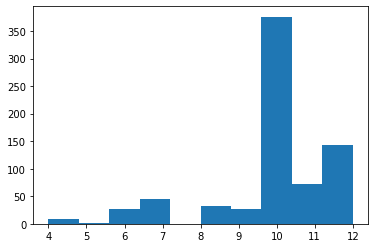

In [40]:
sizes = []
for k,v in USER_LEVELS.items():
    sizes += [x.shape[0] for x in v]
plt.hist(sizes)

print(len([a for a in sizes if a == 10]))
print(len([a for a in sizes if a == 10])/len(sizes))

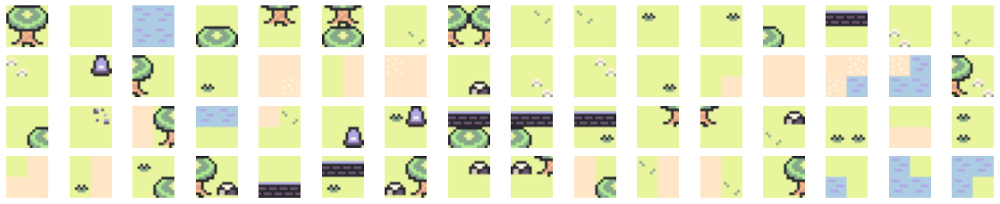

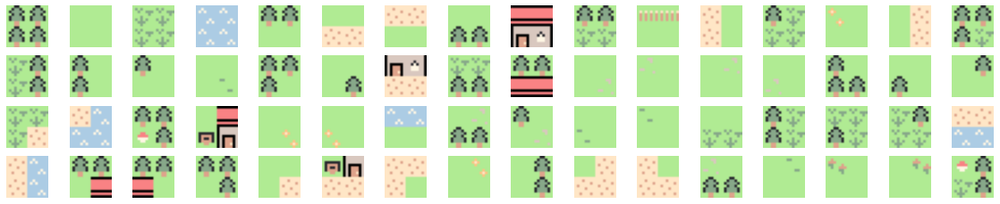

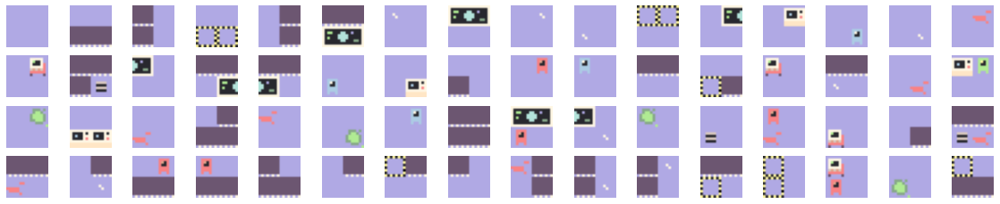

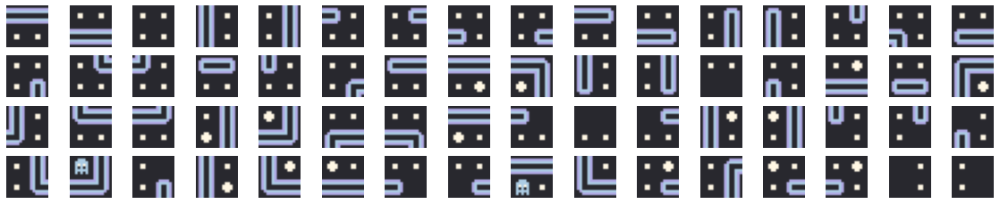

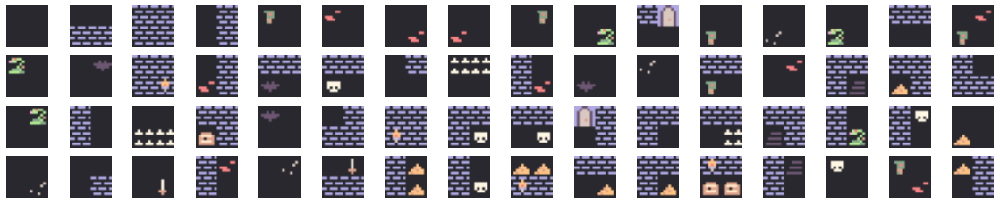

In [41]:
#make tilepatterns
TWIT_PATT_DICT = {}
EVO_PATT_2D = {}
KL_WINDOW_SIZE = 2

for t in ["zelda","pokemon","amongus","pacman","dungeon"]:
    TWIT_PATT_DICT[t] = tpkl.getTPProb(TWIT_LEVELS[t],KL_WINDOW_SIZE)    #for use in pseudotwitter
    EVO_PATT_2D[t] = tpkl.getPatternList2dSorted(TP_LEVELS[t])   #for use with evolver
    
    utils.showTilePat(EVO_PATT_2D[t][:64],t)

In [42]:
# a regression model that outputs a value (representing user vote) based on an input map
class FitnessCNN():
    def __init__(self,tileset,output='whole',map_size=10):
        self.tileset = tileset
        self.mod = 'encode'
        self.nn_size = map_size
        self.channels = tileset.num_tiles
        self.nn_out = output
        
        self.makeModel()
        
        
    #make a regression model to try to predict the rating value
    def makeModel(self):
        rm = Sequential()

        rm.add(Conv2D(self.channels*4,(2,2),strides=(2,2),padding='same',input_shape=[self.nn_size,self.nn_size,self.channels]))
        rm.add(BatchNormalization())
        rm.add(ReLU())
        rm.add(MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='same'))

        rm.add(Conv2D(self.channels*2,(2,2),strides=(2,2),padding='same'))
#         rm.add(Conv2D(self.channels*2,(2,2),strides=(2,2),padding='same',input_shape=[self.nn_size,self.nn_size,self.channels]))
        rm.add(BatchNormalization())
        rm.add(ReLU())
        rm.add(MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='same'))

        rm.add(Conv2D(self.channels,(2,2),strides=(2,2),padding='same'))
        rm.add(BatchNormalization())
        rm.add(ReLU())

        rm.add(Flatten())
        rm.add(Dense(self.channels, activation='relu'))
        
        # use whole values to predict (raw vote difference model)
        if self.nn_out == 'whole':
            rm.add(Dense(1, activation="linear"))
        # use 0-1 to predict (vote percentage model)
        else:
            rm.add(Dense(1,activation='sigmoid'))
    
        rm.compile(loss="mse", optimizer="adam",metrics=['accuracy'])
        if DEBUG:
            rm.summary()
        self.reg_model = rm
    
    #convert the maps to be input into the neural network
    def convert_maps(self,maps):
        #encode maps (assume all the same size)
        return np.array([utils.encodeMap(m) for m in maps])
        
    #evaluate a population of maps 
    def eval_map_population(self,pop):
        #convert the maps to an appropriate format
        conv_pop = self.convert_maps(pop)
        
        #return the predictions
        return np.array(self.reg_model(conv_pop,training=False)).squeeze()
            
    #train the network on the input maps (selected generated and user map) and their associated scores (from the fitness function)
    def train(self,epochs,input_maps,input_scores):
        if DEBUG:
            print(f"-- TRAINING REG MODEL ON [ {self.tileset.tileFile} ] for [ {epochs} ] EPOCHS --")
            
        #split up the maps and scores to associate and train individually
        real_maps = input_maps['real']
        real_scores = input_scores['real']
        conv_rm = self.convert_maps(real_maps)
        
        fake_maps = input_maps['fake']
        fake_scores = input_scores['fake']
        conv_fm = self.convert_maps(fake_maps)
                    
        #sanity check
#         unenc = [decodeMap(m) for m in conv_rm[:32]]
#         s = real_scores[:32]
#         showMultiMaps(unenc,self.tileset.tileFile,'',s)


        #combine to X and y
        X_tr = np.concatenate((conv_rm,conv_fm),axis=0)
        y_tr = np.concatenate((real_scores,fake_scores),axis=0)
        
            
        #train regression model for X epochs on Y batches of maps
        history = self.reg_model.fit(X_tr,y_tr,epochs=epochs,batch_size=min(16,len(X_tr)),shuffle=True,verbose=False)
        eloss = history.history['loss']
        acc = history.history['accuracy']
                
        return np.array(eloss), np.array(acc)
    
    #export the model to a folder
    def exportModel(self,loc,name):
        if not os.path.exists(loc):
            os.makedirs(loc,exist_ok=True)
        
        self.reg_model.save(os.path.join(loc,name)+".h5")
        
     #import the model to a folder
    def importModel(self,loc,name):
        filename = os.path.join(loc,name)+".h5"
        if not os.path.exists(filename):
            #try to find an appoximation
            new_name = self.getModel(loc,name)
            if new_name != None:
                filename = os.path.join(loc,new_name)
            else:
                print(f"ERROR: {filename} does not exist or file with partial name not found in location: {loc}!")
                return
        
        self.reg_model = tf.keras.models.load_model(filename)
        
    #find a model's full filename based on the approximate name given
    def getModel(self,directory,approx_name):
        d = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
        for f in d:
            if approx_name in f:
                return f
        return None

        
        

In [135]:
#Normal evolutionary algorithm that evolves a population of ascii maps towards a fitness value
class StraightBotTP():
    def __init__(self,tileset,popSize,mutrate,tilepatterns,rank_tp_sel=False,mu=0.5):
        self.tileset = tileset    #use the Tileset class
        self.pop_size = popSize
        self.population = [] 
        self.user_fun = None      #fitness function to act as the user evaluation of a level
        self.mutRate = mutrate
        self.changeFit = []
        self.mut_tilepats = tilepatterns
        self.mu = mu              #mu lambda mutation for evolution and population reselection
        self.rank_tp_sel = rank_tp_sel   #select the tile patterns in ranked form
        
    #creates a new randomized map population
    def new_pop(self,randomInit=True):
        if randomInit:
            self.population = utils.makeRandomAscMaps(self.pop_size,10)
        else:
            self.population = utils.makeBlankAscMaps(self.pop_size)
        
    #mu + lambda population update
    def evolve_pop(self):
        next_gen_pop = []
        pop_fitness = [i[0] for i in sorted(enumerate(self.user_fun(self.population)), key=lambda x:x[1],reverse=True)]
        
        #total = sum(list(range(self.pop_size+1)))
        #probs = [x/total for x in range(1,self.pop_size+1)]
        #print(pop_fitness)
        
        #get the best samples from the population
        best_population = []
        for p in pop_fitness:
            best_population.append(self.population[p])
            
        #add mutated maps (mu many)
        wpop = list(range(1,self.pop_size+1))
        wpop.reverse()
        mut_maps = random.choices(best_population,weights=wpop,k=int(self.pop_size*self.mu))
        for m in mut_maps:
            next_gen_pop.append(self.mutate(m))
            
        #add top maps
        for b in range(self.pop_size-len(next_gen_pop)):
            i = pop_fitness[b]
            next_gen_pop.append(self.population[i])
            
        self.population = np.array(next_gen_pop)
        
    #get the highest fitness in the population
    def high_pop_fit(self):
        return max(self.user_fun(self.population))
    
    #get the average fitness in the population
    def avg_pop_fit(self):
        return np.average(self.user_fun(self.population))
    
    #get the map from the population with the 
    def best_map(self):
        return self.population[np.argmax(self.user_fun(self.population))]
    
    #get the average NxN size of the population
    def avg_pop_size(self):
        return np.average([len(x) for x in self.population])
        
    #mutate a map 
    def mutate(self,m):
        m2 = m.copy()
        mr = random.random()
        
        #change the dimensions
#         if mr <= 0.01:
#             r = random.random()
#             #decrease
#             if r < 0.5 and m.shape[0]>6:
#                 m2 = m2[:m.shape[0]-1, :m.shape[1]-1]
#             #increase
#             elif m.shape[0] < 12:
#                 m2 = np.random.randint(0,16,size=(m.shape[0]+1,m.shape[1]+1))
#                 m2[0:m.shape[0], 0:m.shape[1]] = m.copy()
#                 #print(f"m:{m.shape} - m2:{m2.shape}")
                
        #change tiles randomly based on tile pattern set
        for i in range(np.prod(m2.shape)):
            c = i % m2.shape[1]
            r = math.floor(i / m2.shape[1])
            
            #replace tiles at position with randomly selected tile pattern
            tr = random.random()
            if tr <= self.mutRate:
                if self.rank_tp_sel:
                    tweights = [i for i in range(len(self.mut_tilepats),0,-1)]
                    rep_tp = random.choices(self.mut_tilepats,weights=tweights,k=1)[0]
                else:
                    rep_tp = random.choice(self.mut_tilepats)
                
                #keep within bounds
                h = min(m2.shape[0],r+KL_WINDOW_SIZE) - r  
                w = min(m2.shape[1],c+KL_WINDOW_SIZE) - c
                
                if h == 0 or w == 0:
                    continue
                
                m2[r:r+h, c:c+w] = rep_tp[:h,:w]
                
                
        return np.array(m2)
            
        
    #evolve a population from scratch for a number of epochs
    def train(self,epochs,randomInit=True,showPop=False):
        #initialize a new population if one not created already
        if len(self.population) == 0:
            self.new_pop(randomInit)
            self.changeFit = []
                    
        #don't show population as evolved
        with tqdm(total=epochs) as pbar:
            for e in range(epochs):
                pbar.update(1)
                self.evolve_pop()
                self.changeFit.append(self.avg_pop_fit())  #append the averaged population fitness to show changes
                pbar.set_description(f'epoch: {1 + e} - fit: {self.high_pop_fit():.2f} - N: {self.avg_pop_size():.2f}')
                
                if showPop:
                    utils.showMultiMaps(self.population,self.tileset.tileFile)


In [136]:
names = ["zelda","pokemon","amongus","pacman","dungeon"]
SAMP_WEIGHT = 0.2         #P vs. Q WEIGHT FOR TPKL-DIV
TWIT_MULT = 1              #TWITTER SCORE MULTIPLIER FOR THE TPKL-DIV
TWIT_OFFSET = 0            #ADD TO THE SCORE TO MAKE MORE POSITIVE
TWIT_VAR = 3              #ADD TO THE REAL SCORE TO ADD VARIANCE

MIN_USER_MAP_KLDIV = {}   #minimum score of all of the usermap levels
#set the min score
for t in names:
    MIN_USER_MAP_KLDIV[t] = min([tpkl.tp_fitness(x,TWIT_PATT_DICT[t],WEIGHT=SAMP_WEIGHT,WINDOW=KL_WINDOW_SIZE) for x in user_maps[t]])
    
print(MIN_USER_MAP_KLDIV)


    
#return the "TWITTER" defined fitness
def twitterFit(m):
    return tpkl.tp_fitness(m,TWIT_PATT_DICT[TILE],WEIGHT=SAMP_WEIGHT,WINDOW=KL_WINDOW_SIZE)+abs(MIN_USER_MAP_KLDIV[TILE])+TWIT_OFFSET
    
#simulate a twitter rating by returning the difference between a real map and fake map (using custom fitness)
def twitterScore(realMap,fakeMap,percentage=True):
    #TWIT_NORM = np.random.normal(TWIT_MULT,1)
    real_score = round(twitterFit(realMap)*TWIT_MULT*utils.entropy(realMap))+(random.randint(-TWIT_VAR,TWIT_VAR))  #add offset to simulate votes and prevent overfitting
    fake_score = round(twitterFit(fakeMap)*TWIT_MULT*utils.entropy(fakeMap))

    #return difference in scores
    if not percentage:
        print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:{(real_score-fake_score)} f:{(fake_score-real_score)}")
        return (real_score-fake_score),(fake_score-real_score)
                
    # return difference in percentage scores
    else:
        total = abs(real_score) + abs(fake_score)
        
        if fake_score <= 0:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:1.0 f:0.0")
            return 1.0, 0.0
        elif real_score <= 0:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:0.0 f:1.0")
            return 0.0, 1.0
        else:
            print(f"[TWITTER RESULT] r:{real_score}  f:{fake_score} => r:{(real_score/total):.3f} f:{(fake_score/total):.3f}")
            return real_score/total, fake_score/total


{'zelda': -13.267338170390511, 'pokemon': -12.706427791305638, 'amongus': -12.720140540682433, 'pacman': -13.933496226835196, 'dungeon': -14.188068006300593}


#### Test the models and functions

<ipython-input-114-7ec02ef40085>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  utils.showMultiMaps(np.array([fake_map,real_map,rand_map]),'pokemon','',[twitterFit(fake_map),twitterFit(real_map),twitterFit(rand_map)])


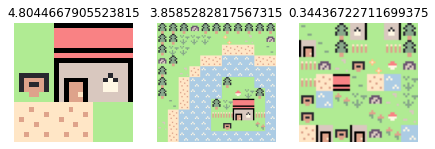

In [114]:
#test twitter fit

TILE = 'pokemon'
fake_map = np.array([[0,12,12],[8,13,14],[6,6,0]])
real_map = random.choice(PROFILE_LEVELS[TILE])
rand_map = utils.makeRandomAscMaps(1)[0]
utils.showMultiMaps(np.array([fake_map,real_map,rand_map]),'pokemon','',[twitterFit(fake_map),twitterFit(real_map),twitterFit(rand_map)])


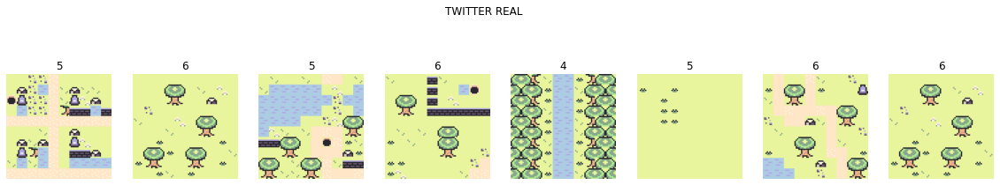

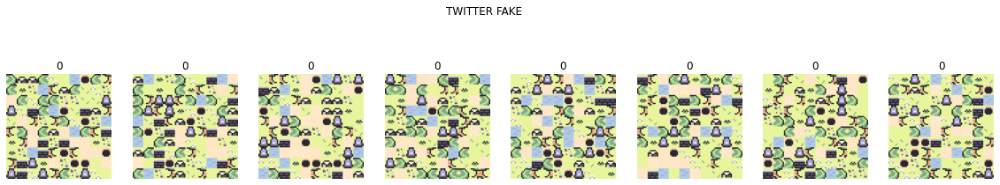

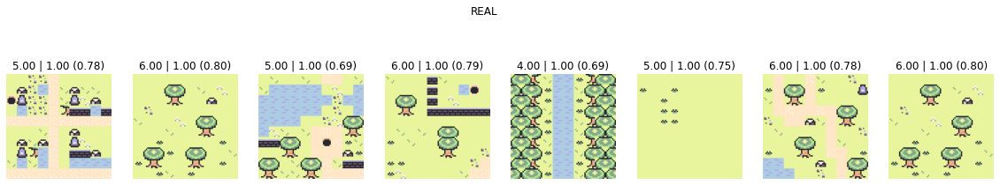

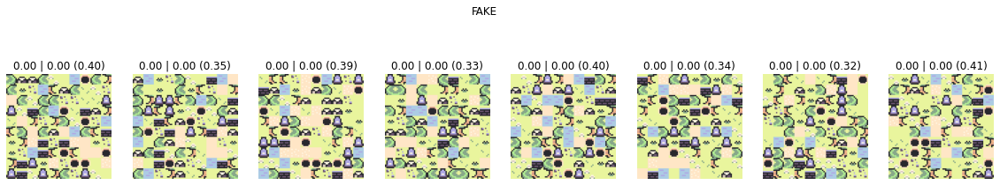

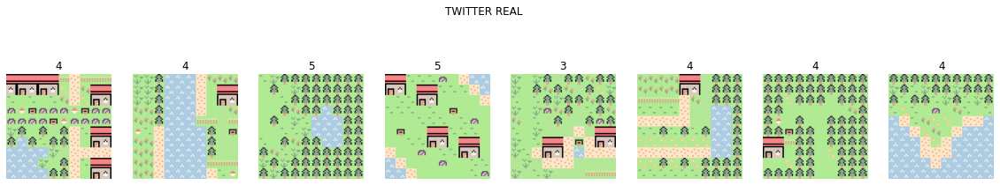

...

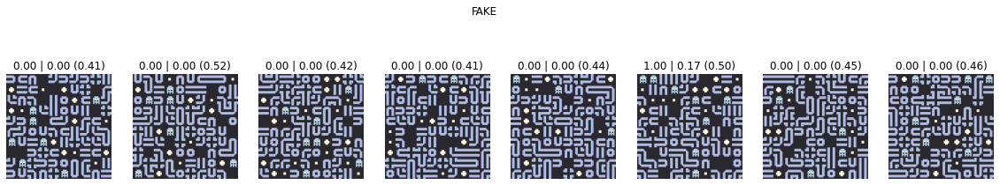

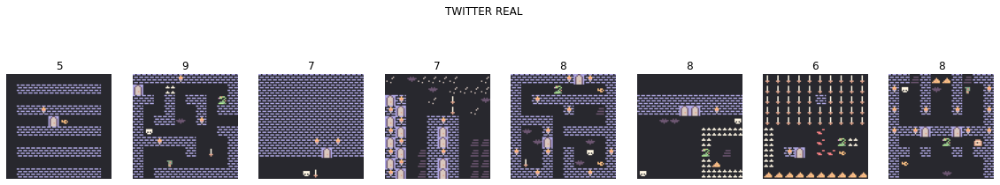

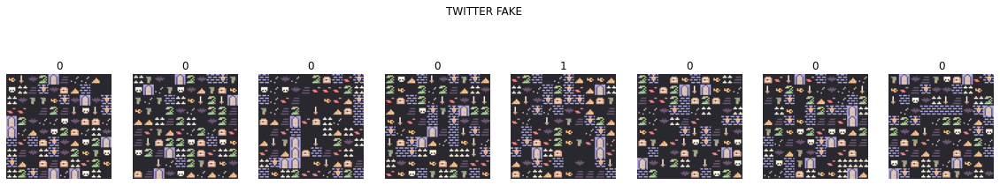

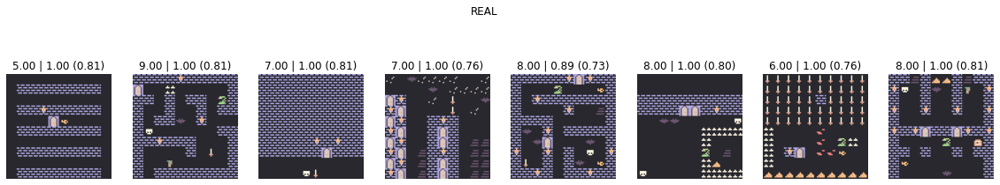

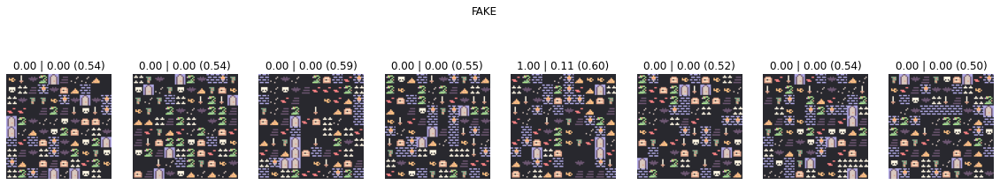

In [115]:
# test cnn

DEBUG = False
BINARY = True

names = ["zelda","pokemon","amongus","pacman","dungeon"]
MAX_LEVELS = 8
for name in names:
    
    TILE = name
    tils = TILESETS[TILE]

    prereal_maps = random.choices(TRAIN_MAPS[TILE],k=MAX_LEVELS)
    prereal_scores = [round(twitterFit(m)*TWIT_MULT) for m in prereal_maps]
    utils.showMultiMaps(prereal_maps,TILE,'TWITTER REAL',prereal_scores)

    prefake_maps = utils.makeRandomAscMaps(len(prereal_maps),10)
    prefake_scores = [round(twitterFit(m)*TWIT_MULT) for m in prefake_maps]
    utils.showMultiMaps(prefake_maps,TILE,'TWITTER FAKE',prefake_scores)


    # test on cnn output
    test_cnn = FitnessCNN(tils,('binary' if BINARY else "whole"))
    #test_cnn.reg_model.summary()

    # raw difference
    if not BINARY:
        rs = [prereal_scores[i] - prefake_scores[i] for i in range(len(prereal_scores))]
        fs = [prefake_scores[i] - prereal_scores[i] for i in range(len(prefake_scores))]
    
    # percentage scores
    else:
        rs = []
        fs = []
        for i in range(len(prereal_scores)):
            ri = prereal_scores[i]
            fi = prefake_scores[i]
            total = abs(ri) + abs(fi)
            if fi <= 0:
                rs.append(1.0)
                fs.append(0.0)
            elif ri <= 0:
                fs.append(1.0)
                rs.append(0.0)
            else:
                fs.append(fi/total)
                rs.append(ri/total)
        
    
    test_cnn.train(100,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})

    cnnreal_scores = test_cnn.eval_map_population(prereal_maps)
    cnnfake_scores = test_cnn.eval_map_population(prefake_maps)

    utils.showMultiMaps(prereal_maps,TILE,'REAL',[f"{prereal_scores[x]:.2f} | {(rs[x]):.2f} ({cnnreal_scores[x]:.2f})" for x in range(len(cnnreal_scores))])
    utils.showMultiMaps(prefake_maps,TILE,'FAKE',[f"{prefake_scores[x]:.2f} | {(fs[x]):.2f} ({cnnfake_scores[x]:.2f})" for x in range(len(cnnfake_scores))])   

### Run experiments

In [130]:
#for showing the fitness of the evolver in between iterations
def showFitnessGraphs2(fitsets,epochs,indexes):
    plt.figure(figsize=(20,3))
    for t in range(len(fitsets)):
        axs = plt.subplot(2, 5, t + 1)
        axs.plot(epochs[t][::10],fitsets[t][::10])   #use every 10th 
        plt.title(f'{indexes[t]}')
    plt.show()

 -- trials = 1, evo epochs = 250, nn epochs = 10, popsize = 32 --
> zelda tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:12  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:6  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:6  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:-3  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:12  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:6  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:13  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:12  f:-5 => r:1.0 f:0.0
[

epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.25it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 2 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0000


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.32it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 3 / 100 -- last fitness: 1.00 | last twit score: 0.20 | last loss: 0.0091


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 23.81it/s]


[TWITTER RESULT] r:11  f:3 => r:0.786 f:0.214
   >> EXP 4 / 100 -- last fitness: 1.00 | last twit score: 0.21 | last loss: 0.0070


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.14it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 5 / 100 -- last fitness: 0.96 | last twit score: 0.33 | last loss: 0.0238


epoch: 250 - fit: 0.56 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.66it/s]


SHOWING FITNESS GRAPHS


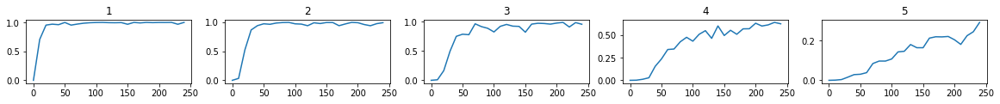

[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 6 / 100 -- last fitness: 0.56 | last twit score: 0.17 | last loss: 0.0148


epoch: 250 - fit: 0.71 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.04it/s]


[TWITTER RESULT] r:6  f:2 => r:0.750 f:0.250
   >> EXP 7 / 100 -- last fitness: 0.71 | last twit score: 0.25 | last loss: 0.0344


epoch: 250 - fit: 0.66 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.76it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 8 / 100 -- last fitness: 0.66 | last twit score: 0.22 | last loss: 0.0143


epoch: 250 - fit: 0.59 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.21it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 9 / 100 -- last fitness: 0.59 | last twit score: 0.08 | last loss: 0.0307


epoch: 250 - fit: 0.61 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.05it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 10 / 100 -- last fitness: 0.61 | last twit score: 0.00 | last loss: 0.0266


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.99it/s]


SHOWING FITNESS GRAPHS


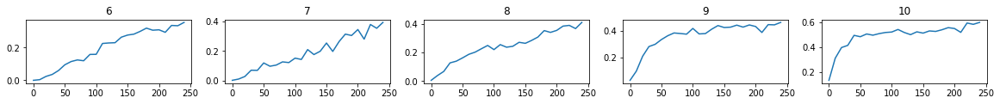

[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
[0.99999964, 0.99998, 0.99977434, 0.9621242, 0.55556697, 0.71352994, 0.6577338, 0.59374726, 0.6126186, 0.6956216]
   >> EXP 11 / 100 -- last fitness: 0.70 | last twit score: 0.00 | last loss: 0.0247


epoch: 250 - fit: 0.59 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.98it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 12 / 100 -- last fitness: 0.59 | last twit score: 0.10 | last loss: 0.0132


epoch: 250 - fit: 0.71 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.85it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 13 / 100 -- last fitness: 0.71 | last twit score: 0.10 | last loss: 0.0100


epoch: 250 - fit: 0.63 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.39it/s]


[TWITTER RESULT] r:13  f:1 => r:0.929 f:0.071
   >> EXP 14 / 100 -- last fitness: 0.63 | last twit score: 0.07 | last loss: 0.0045


epoch: 250 - fit: 0.64 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.54it/s]


[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 15 / 100 -- last fitness: 0.64 | last twit score: 0.29 | last loss: 0.0084


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 27.25it/s]


SHOWING FITNESS GRAPHS


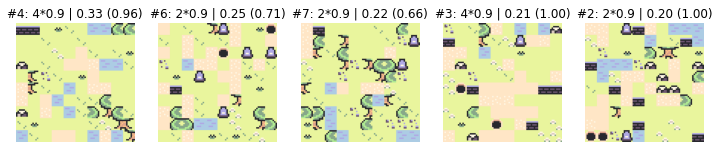

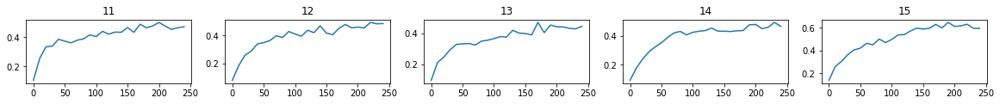

[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 16 / 100 -- last fitness: 0.79 | last twit score: 0.00 | last loss: 0.0127


epoch: 250 - fit: 0.60 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.81it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 17 / 100 -- last fitness: 0.60 | last twit score: 0.00 | last loss: 0.0064


epoch: 250 - fit: 0.66 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.90it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 18 / 100 -- last fitness: 0.66 | last twit score: 0.00 | last loss: 0.0076


epoch: 250 - fit: 0.62 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 23.81it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 19 / 100 -- last fitness: 0.62 | last twit score: 0.00 | last loss: 0.0046


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.87it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 20 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0085


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.40it/s]


SHOWING FITNESS GRAPHS


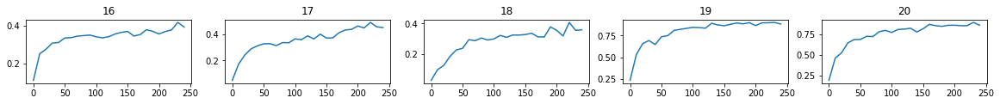

[TWITTER RESULT] r:11  f:1 => r:0.917 f:0.083
[0.59030056, 0.7073803, 0.63489413, 0.6367798, 0.7900068, 0.603023, 0.6648456, 0.62085557, 0.9737786, 0.9722762]
   >> EXP 21 / 100 -- last fitness: 0.97 | last twit score: 0.08 | last loss: 0.0028


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.40it/s]


[TWITTER RESULT] r:5  f:-2 => r:1.0 f:0.0
   >> EXP 22 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0047


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.05it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 23 / 100 -- last fitness: 0.93 | last twit score: 0.08 | last loss: 0.0044


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.32it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 24 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0013


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.08it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 25 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.90it/s]


SHOWING FITNESS GRAPHS


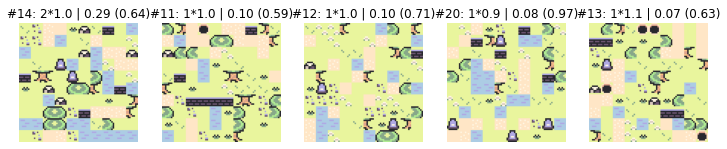

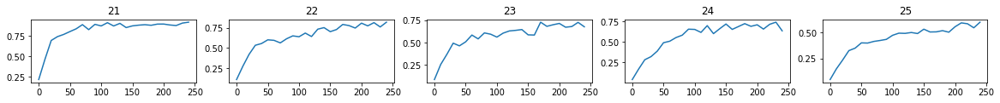

[TWITTER RESULT] r:-1  f:2 => r:0.0 f:1.0
   >> EXP 26 / 100 -- last fitness: 0.80 | last twit score: 1.00 | last loss: 0.0098


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.58it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 27 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0206


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.42it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 28 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0040


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.38it/s]


[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
   >> EXP 29 / 100 -- last fitness: 0.95 | last twit score: 0.20 | last loss: 0.0043


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.05it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 30 / 100 -- last fitness: 0.97 | last twit score: 0.12 | last loss: 0.0031


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 23.38it/s]


SHOWING FITNESS GRAPHS


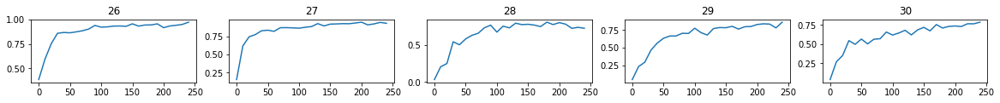

[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
[0.97212636, 0.9292575, 0.8728156, 0.9379226, 0.7973881, 0.99032867, 0.9885061, 0.94852996, 0.97228086, 0.94134974]
   >> EXP 31 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0028


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.04it/s]


[TWITTER RESULT] r:12  f:-1 => r:1.0 f:0.0
   >> EXP 32 / 100 -- last fitness: 0.85 | last twit score: 0.00 | last loss: 0.0019


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.49it/s]


[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
   >> EXP 33 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0037


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.79it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 34 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0061


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.41it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 35 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0033


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.42it/s]


SHOWING FITNESS GRAPHS


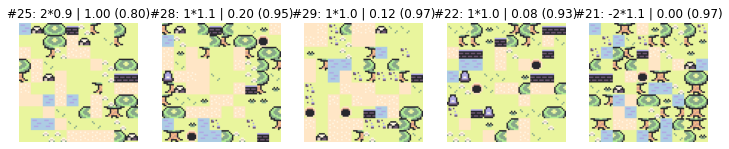

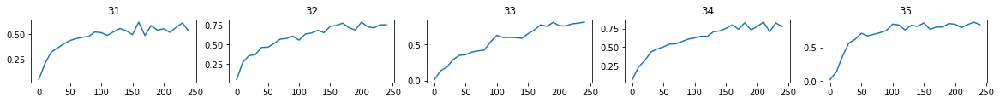

[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 36 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0116


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:11<00:00, 22.35it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 37 / 100 -- last fitness: 0.97 | last twit score: 0.12 | last loss: 0.0138


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.51it/s]


[TWITTER RESULT] r:11  f:0 => r:1.0 f:0.0
   >> EXP 38 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0037


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.69it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 39 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.05it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 40 / 100 -- last fitness: 0.98 | last twit score: 0.10 | last loss: 0.0030


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.45it/s]


SHOWING FITNESS GRAPHS


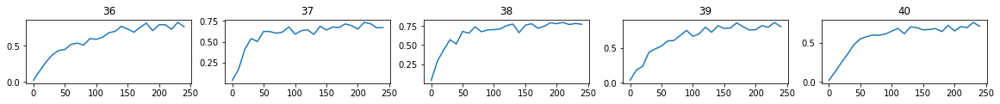

[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
[0.848781, 0.95027316, 0.95646954, 0.96030533, 0.98979175, 0.9664356, 0.91083336, 0.97025836, 0.9810759, 0.89986897]
   >> EXP 41 / 100 -- last fitness: 0.90 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.62it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 42 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0035


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.36it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 43 / 100 -- last fitness: 0.98 | last twit score: 0.08 | last loss: 0.0035


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.50it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 44 / 100 -- last fitness: 0.92 | last twit score: 0.33 | last loss: 0.0033


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.13it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 45 / 100 -- last fitness: 0.90 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.83it/s]


SHOWING FITNESS GRAPHS


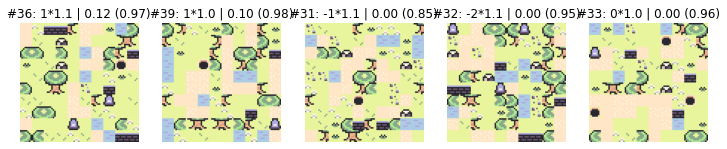

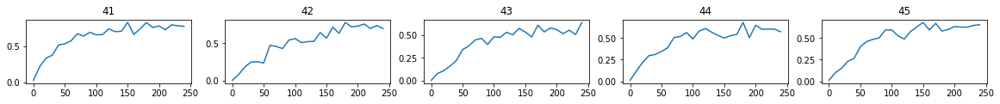

[TWITTER RESULT] r:-2  f:1 => r:0.0 f:1.0
   >> EXP 46 / 100 -- last fitness: 0.94 | last twit score: 1.00 | last loss: 0.0064


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.71it/s]


[TWITTER RESULT] r:11  f:0 => r:1.0 f:0.0
   >> EXP 47 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.80it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 48 / 100 -- last fitness: 0.99 | last twit score: 0.08 | last loss: 0.0102


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 23.10it/s]


[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 49 / 100 -- last fitness: 0.95 | last twit score: 0.11 | last loss: 0.0021


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.43it/s]


[TWITTER RESULT] r:11  f:2 => r:0.846 f:0.154
   >> EXP 50 / 100 -- last fitness: 0.98 | last twit score: 0.15 | last loss: 0.0112


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.24it/s]


SHOWING FITNESS GRAPHS


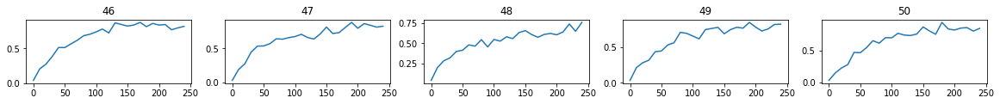

[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
[0.9722851, 0.9775164, 0.92145467, 0.90236676, 0.9384836, 0.9891394, 0.9874952, 0.94951487, 0.98433733, 0.99575216]
   >> EXP 51 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.01it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 52 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0118


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.91it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 53 / 100 -- last fitness: 1.00 | last twit score: 0.12 | last loss: 0.0092


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.68it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 54 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0177


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.19it/s]


[TWITTER RESULT] r:10  f:-2 => r:1.0 f:0.0
   >> EXP 55 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0017


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.76it/s]


SHOWING FITNESS GRAPHS


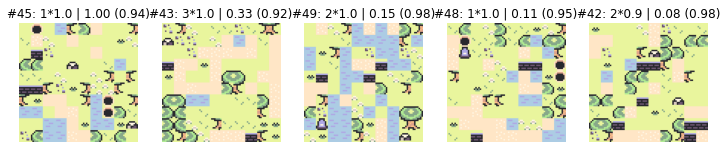

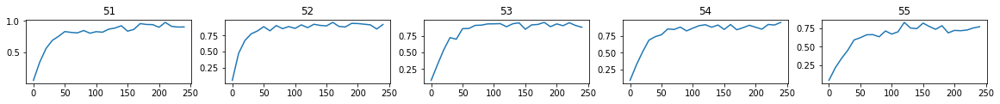

[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 56 / 100 -- last fitness: 0.95 | last twit score: 0.14 | last loss: 0.0021


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.56it/s]


[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
   >> EXP 57 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0030


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.75it/s]


[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 58 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0176


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.45it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 59 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.55it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 60 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0027


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.25it/s]


SHOWING FITNESS GRAPHS


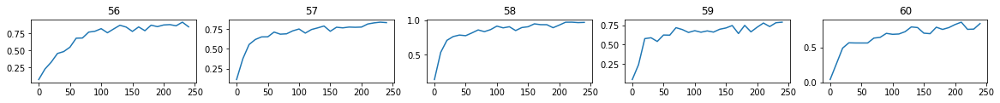

[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
[0.99896574, 0.998708, 0.9980236, 0.99645805, 0.9450443, 0.98799103, 0.96212065, 0.997582, 0.97626084, 0.98842824]
   >> EXP 61 / 100 -- last fitness: 0.99 | last twit score: 0.09 | last loss: 0.0057


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.57it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 62 / 100 -- last fitness: 0.99 | last twit score: 0.22 | last loss: 0.0059


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.89it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 63 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.19it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 64 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0016


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.46it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 65 / 100 -- last fitness: 0.99 | last twit score: 0.10 | last loss: 0.0018


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.76it/s]


SHOWING FITNESS GRAPHS


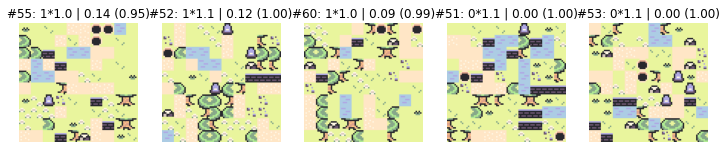

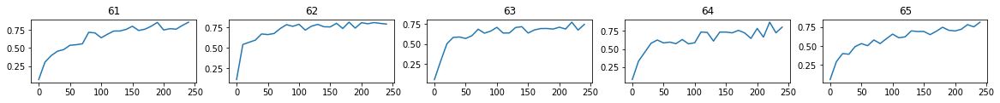

[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 66 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0168


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.02it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 67 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0104


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.54it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 68 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0095


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.34it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 69 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0034


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.73it/s]


[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 70 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.32it/s]


SHOWING FITNESS GRAPHS


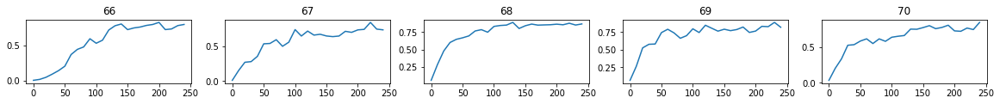

[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
[0.99029595, 0.9313606, 0.96765053, 0.9935723, 0.9775739, 0.9950605, 0.9800905, 0.9946133, 0.9822096, 0.9871467]
   >> EXP 71 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.44it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 72 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0052


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.03it/s]


[TWITTER RESULT] r:2  f:2 => r:0.500 f:0.500
   >> EXP 73 / 100 -- last fitness: 0.95 | last twit score: 0.50 | last loss: 0.0017


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.87it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 74 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0175


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.22it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 75 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0041


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.45it/s]


SHOWING FITNESS GRAPHS


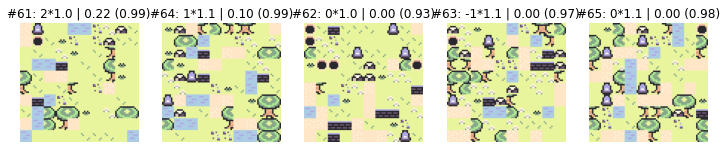

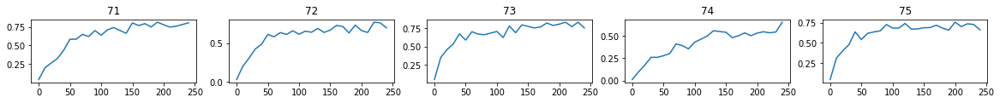

[TWITTER RESULT] r:12  f:-1 => r:1.0 f:0.0
   >> EXP 76 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.71it/s]


[TWITTER RESULT] r:11  f:-2 => r:1.0 f:0.0
   >> EXP 77 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.54it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 78 / 100 -- last fitness: 0.97 | last twit score: 0.17 | last loss: 0.0020


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.88it/s]


[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 79 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0017


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.58it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 80 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0019


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.90it/s]


SHOWING FITNESS GRAPHS


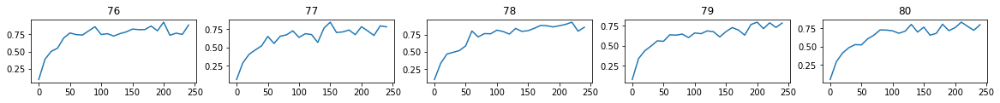

[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
[0.9912531, 0.94710696, 0.9856043, 0.9169055, 0.9694222, 0.99394095, 0.97336555, 0.9935359, 0.9642199, 0.99076295]
   >> EXP 81 / 100 -- last fitness: 0.99 | last twit score: 0.12 | last loss: 0.0022


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.47it/s]


[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 82 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0082


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.89it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 83 / 100 -- last fitness: 0.99 | last twit score: 0.17 | last loss: 0.0026


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.53it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 84 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.55it/s]


[TWITTER RESULT] r:1  f:0 => r:1.0 f:0.0
   >> EXP 85 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0016


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.37it/s]


SHOWING FITNESS GRAPHS


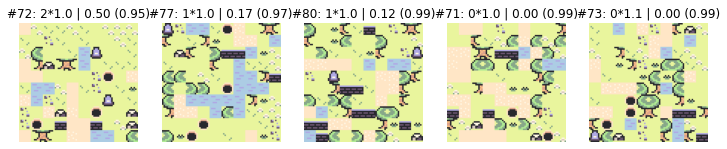

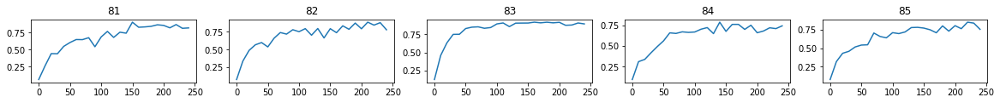

[TWITTER RESULT] r:13  f:0 => r:1.0 f:0.0
   >> EXP 86 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0075


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.08it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 87 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.54it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 88 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0015


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.36it/s]


[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 89 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:16<00:00, 14.81it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 90 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:15<00:00, 16.52it/s]


SHOWING FITNESS GRAPHS


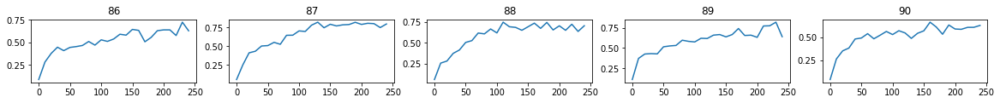

[TWITTER RESULT] r:8  f:-2 => r:1.0 f:0.0
[0.9975241, 0.9911704, 0.98898876, 0.96025634, 0.9972755, 0.95130444, 0.9810457, 0.9590095, 0.9669281, 0.8491493]
   >> EXP 91 / 100 -- last fitness: 0.85 | last twit score: 0.00 | last loss: 0.0032


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:11<00:00, 21.54it/s]


[TWITTER RESULT] r:4  f:-2 => r:1.0 f:0.0
   >> EXP 92 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 22.91it/s]


[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
   >> EXP 93 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0017


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.92it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 94 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0019


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.27it/s]


[TWITTER RESULT] r:10  f:2 => r:0.833 f:0.167
   >> EXP 95 / 100 -- last fitness: 0.95 | last twit score: 0.17 | last loss: 0.0016


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.34it/s]


SHOWING FITNESS GRAPHS


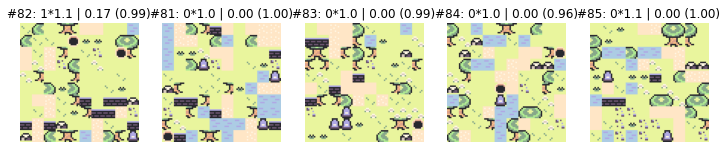

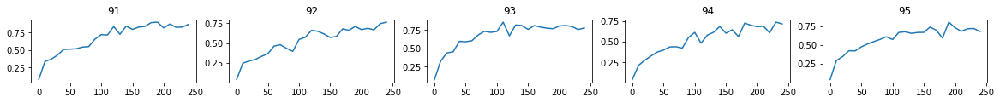

[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 96 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0013


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.84it/s]


[TWITTER RESULT] r:13  f:0 => r:1.0 f:0.0
   >> EXP 97 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 27.40it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 98 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0061


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 27.02it/s]


[TWITTER RESULT] r:3  f:0 => r:1.0 f:0.0
   >> EXP 99 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0057


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 27.11it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 100 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.82it/s]


SHOWING FITNESS GRAPHS


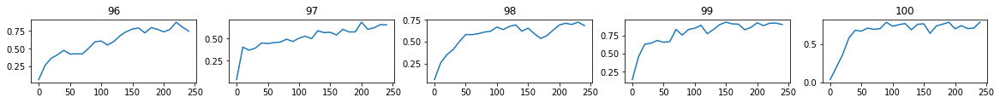

[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
[0.9963241, 0.9891396, 0.99530286, 0.9488101, 0.9885741, 0.99688816, 0.91743565, 0.9806798, 0.9976969, 0.9908346]
> pokemon tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:9  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:4  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:4  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:12  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:4  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-6 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:3  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-5 => r:1.0 f

epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.14it/s]


[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
   >> EXP 2 / 100 -- last fitness: 1.00 | last twit score: 0.20 | last loss: 0.0394


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.05it/s]


[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 3 / 100 -- last fitness: 1.00 | last twit score: 0.29 | last loss: 0.0219


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.00it/s]


[TWITTER RESULT] r:13  f:2 => r:0.867 f:0.133
   >> EXP 4 / 100 -- last fitness: 1.00 | last twit score: 0.13 | last loss: 0.1452


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.74it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 5 / 100 -- last fitness: 0.87 | last twit score: 0.14 | last loss: 0.1123


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.55it/s]


SHOWING FITNESS GRAPHS


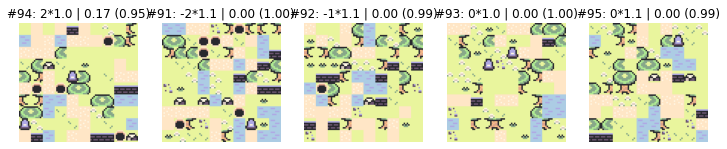

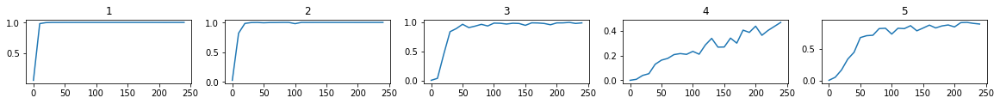

[TWITTER RESULT] r:1  f:-1 => r:1.0 f:0.0
   >> EXP 6 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0885


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.98it/s]


[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 7 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0246


epoch: 250 - fit: 0.59 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.53it/s]


[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 8 / 100 -- last fitness: 0.59 | last twit score: 0.00 | last loss: 0.0194


epoch: 50 - fit: 0.52 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 25.66it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 9 / 100 -- last fitness: 0.52 | last twit score: 0.20 | last loss: 0.0178


epoch: 50 - fit: 0.47 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 25.79it/s]


[TWITTER RESULT] r:12  f:2 => r:0.857 f:0.143
   >> EXP 10 / 100 -- last fitness: 0.47 | last twit score: 0.14 | last loss: 0.0278


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.47it/s]


SHOWING FITNESS GRAPHS


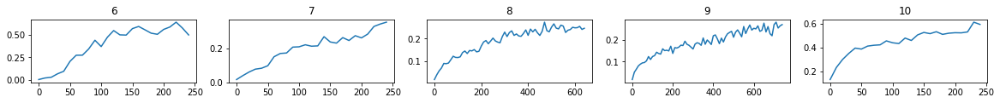

[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
[1.0, 1.0, 0.9998933, 0.872071, 0.9938912, 0.92037034, 0.5920345, 0.5216751, 0.46993163, 0.75084424]
   >> EXP 11 / 100 -- last fitness: 0.75 | last twit score: 0.00 | last loss: 0.0112


epoch: 250 - fit: 0.67 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.39it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 12 / 100 -- last fitness: 0.67 | last twit score: 0.00 | last loss: 0.0098


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.20it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 13 / 100 -- last fitness: 0.88 | last twit score: 0.00 | last loss: 0.0156


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.16it/s]


[TWITTER RESULT] r:9  f:-2 => r:1.0 f:0.0
   >> EXP 14 / 100 -- last fitness: 0.81 | last twit score: 0.00 | last loss: 0.0295


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.06it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 15 / 100 -- last fitness: 0.77 | last twit score: 0.00 | last loss: 0.0227


epoch: 250 - fit: 0.60 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.45it/s]


SHOWING FITNESS GRAPHS


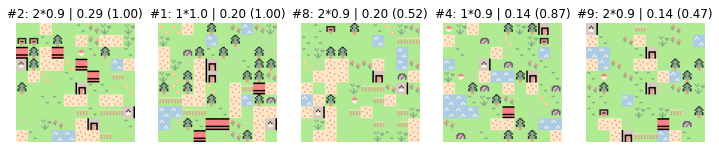

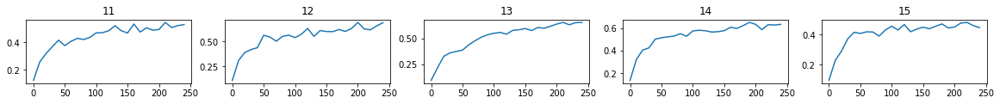

[TWITTER RESULT] r:12  f:-3 => r:1.0 f:0.0
   >> EXP 16 / 100 -- last fitness: 0.60 | last twit score: 0.00 | last loss: 0.0076


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.10it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 17 / 100 -- last fitness: 0.75 | last twit score: 0.00 | last loss: 0.0233


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.09it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 18 / 100 -- last fitness: 0.85 | last twit score: 0.00 | last loss: 0.0457


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.43it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 19 / 100 -- last fitness: 0.84 | last twit score: 0.00 | last loss: 0.0175


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.86it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 20 / 100 -- last fitness: 0.92 | last twit score: 0.12 | last loss: 0.0149


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.20it/s]


SHOWING FITNESS GRAPHS


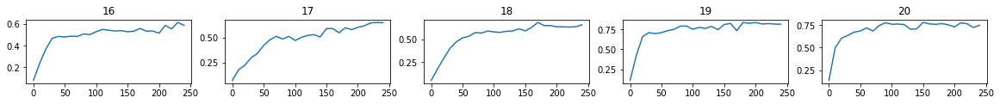

[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
[0.6709433, 0.87564325, 0.8063079, 0.7724806, 0.60205185, 0.74982446, 0.8544227, 0.8389386, 0.9247861, 0.92062926]
   >> EXP 21 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0051


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.21it/s]


[TWITTER RESULT] r:10  f:-2 => r:1.0 f:0.0
   >> EXP 22 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0106


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.41it/s]


[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 23 / 100 -- last fitness: 0.85 | last twit score: 0.00 | last loss: 0.0034


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.63it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 24 / 100 -- last fitness: 0.79 | last twit score: 0.00 | last loss: 0.0110


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.91it/s]


[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 25 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0059


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.49it/s]


SHOWING FITNESS GRAPHS


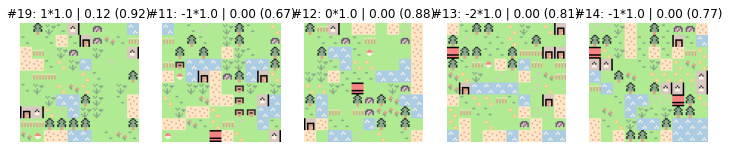

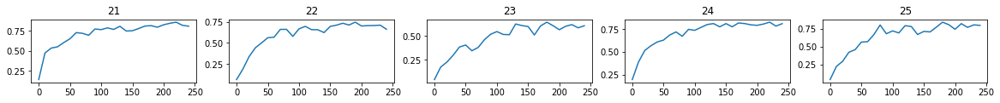

[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 26 / 100 -- last fitness: 0.97 | last twit score: 0.10 | last loss: 0.0081


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.12it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 27 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0040


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.15it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 28 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0043


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.32it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 29 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0046


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.37it/s]


[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 30 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0017


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.72it/s]


SHOWING FITNESS GRAPHS


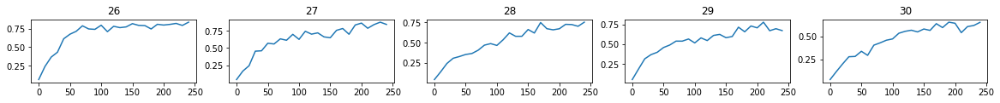

[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
[0.9499178, 0.85485923, 0.7878456, 0.91499865, 0.9688964, 0.9706536, 0.9906484, 0.9450158, 0.95237494, 0.91075516]
   >> EXP 31 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0041


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.12it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 32 / 100 -- last fitness: 0.98 | last twit score: 0.14 | last loss: 0.0118


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.03it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 33 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.10it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 34 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 22.91it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 35 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0159


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:10<00:00, 24.76it/s]


SHOWING FITNESS GRAPHS


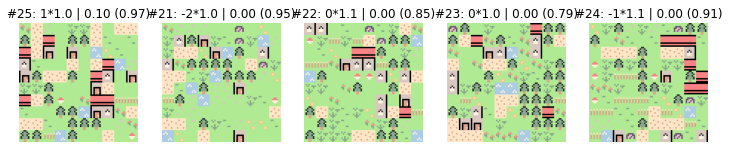

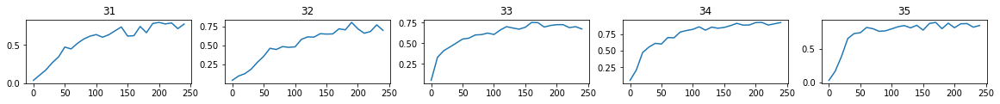

[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 36 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0017


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.44it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 37 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0032


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.37it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 38 / 100 -- last fitness: 0.90 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.35it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 39 / 100 -- last fitness: 0.99 | last twit score: 0.08 | last loss: 0.0018


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.05it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 40 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.91it/s]


SHOWING FITNESS GRAPHS


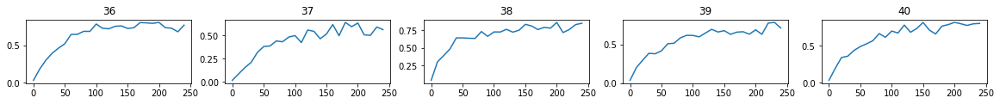

[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
[0.9834455, 0.95585, 0.9292574, 0.9882087, 0.98794806, 0.96206975, 0.9004997, 0.9897306, 0.96420085, 0.9897162]
   >> EXP 41 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0011


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.56it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 42 / 100 -- last fitness: 0.95 | last twit score: 0.14 | last loss: 0.0026


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.08it/s]


[TWITTER RESULT] r:10  f:-2 => r:1.0 f:0.0
   >> EXP 43 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0029


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.36it/s]


[TWITTER RESULT] r:3  f:0 => r:1.0 f:0.0
   >> EXP 44 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0134


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.61it/s]


[TWITTER RESULT] r:12  f:-3 => r:1.0 f:0.0
   >> EXP 45 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0044


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.08it/s]


SHOWING FITNESS GRAPHS


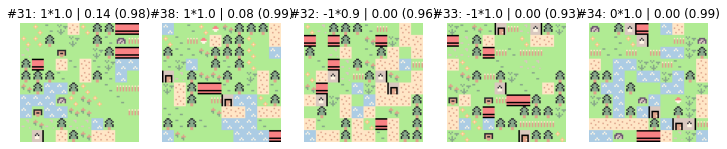

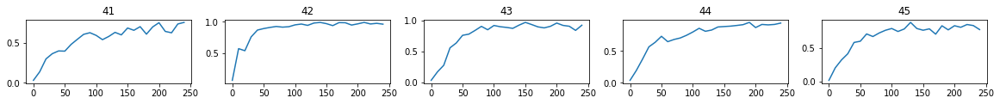

[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 46 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0015


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.27it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 47 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.72it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 48 / 100 -- last fitness: 0.99 | last twit score: 0.10 | last loss: 0.0009


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.38it/s]


[TWITTER RESULT] r:4  f:-1 => r:1.0 f:0.0
   >> EXP 49 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.63it/s]


[TWITTER RESULT] r:11  f:0 => r:1.0 f:0.0
   >> EXP 50 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0029


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.40it/s]


SHOWING FITNESS GRAPHS


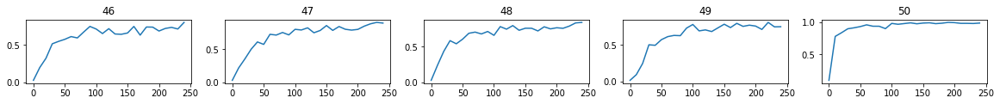

[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
[0.9532882, 0.99967235, 0.9990688, 0.99729466, 0.9838791, 0.9458906, 0.987669, 0.9872838, 0.96446973, 0.9999317]
   >> EXP 51 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0125


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.85it/s]


[TWITTER RESULT] r:6  f:-3 => r:1.0 f:0.0
   >> EXP 52 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0221


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.70it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 53 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0083


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.91it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 54 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0015


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.83it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 55 / 100 -- last fitness: 0.98 | last twit score: 0.10 | last loss: 0.0011


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.71it/s]


SHOWING FITNESS GRAPHS


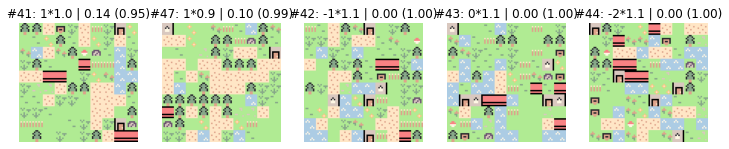

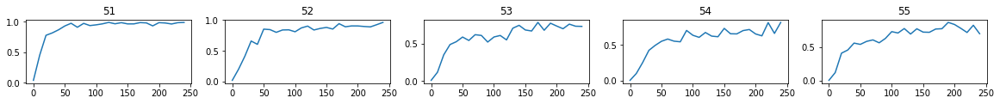

[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 56 / 100 -- last fitness: 0.97 | last twit score: 0.29 | last loss: 0.0015


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.13it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 57 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0019


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.86it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 58 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0047


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.23it/s]


[TWITTER RESULT] r:8  f:-2 => r:1.0 f:0.0
   >> EXP 59 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.96it/s]


[TWITTER RESULT] r:2  f:2 => r:0.500 f:0.500
   >> EXP 60 / 100 -- last fitness: 0.98 | last twit score: 0.50 | last loss: 0.0032


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.32it/s]


SHOWING FITNESS GRAPHS


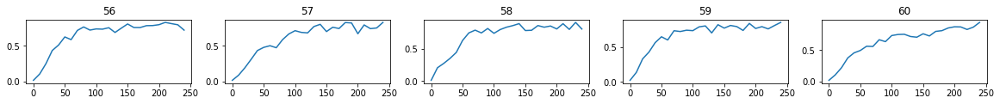

[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
[0.9998786, 0.9989205, 0.98728716, 0.9771733, 0.97060144, 0.9903035, 0.9848156, 0.9950801, 0.9809427, 0.99730253]
   >> EXP 61 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0033


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.16it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 62 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.67it/s]


[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 63 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.72it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 64 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.23it/s]


[TWITTER RESULT] r:2  f:-3 => r:1.0 f:0.0
   >> EXP 65 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.32it/s]


SHOWING FITNESS GRAPHS


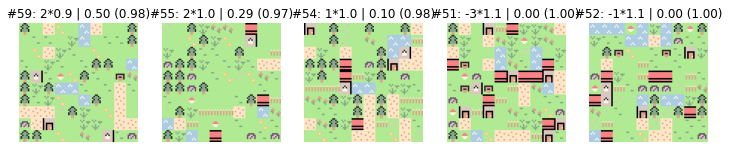

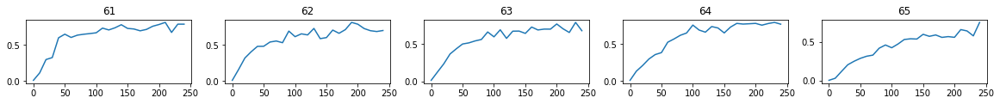

[TWITTER RESULT] r:3  f:-2 => r:1.0 f:0.0
   >> EXP 66 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0035


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.98it/s]


[TWITTER RESULT] r:6  f:-2 => r:1.0 f:0.0
   >> EXP 67 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.63it/s]


[TWITTER RESULT] r:5  f:3 => r:0.625 f:0.375
   >> EXP 68 / 100 -- last fitness: 1.00 | last twit score: 0.38 | last loss: 0.0028


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.35it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 69 / 100 -- last fitness: 0.99 | last twit score: 0.20 | last loss: 0.0035


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.50it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 70 / 100 -- last fitness: 0.96 | last twit score: 0.08 | last loss: 0.0021


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.47it/s]


SHOWING FITNESS GRAPHS


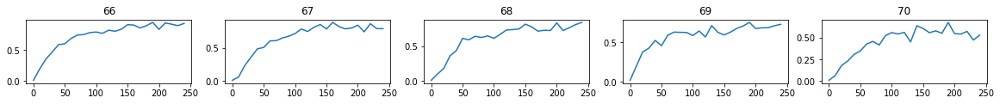

[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
[0.9810626, 0.9858737, 0.97140265, 0.9816713, 0.97983265, 0.9984205, 0.996626, 0.99025327, 0.96161735, 0.9319458]
   >> EXP 71 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0027


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.15it/s]


[TWITTER RESULT] r:13  f:-1 => r:1.0 f:0.0
   >> EXP 72 / 100 -- last fitness: 0.90 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.25it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 73 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.71it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 74 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0032


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.64it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 75 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.81it/s]


SHOWING FITNESS GRAPHS


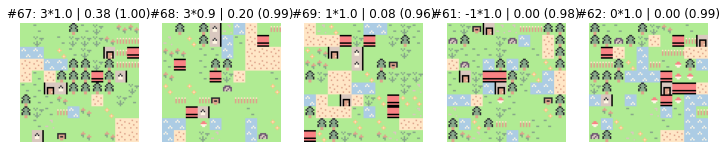

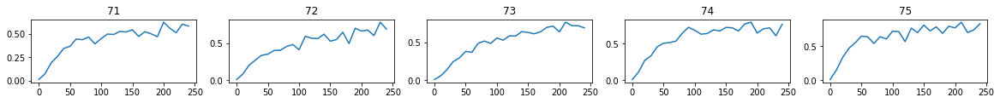

[TWITTER RESULT] r:7  f:-2 => r:1.0 f:0.0
   >> EXP 76 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.22it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 77 / 100 -- last fitness: 0.99 | last twit score: 0.09 | last loss: 0.0018


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.74it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 78 / 100 -- last fitness: 0.99 | last twit score: 0.20 | last loss: 0.0022


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.93it/s]


[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 79 / 100 -- last fitness: 0.99 | last twit score: 0.11 | last loss: 0.0069


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.06it/s]


[TWITTER RESULT] r:1  f:0 => r:1.0 f:0.0
   >> EXP 80 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.04it/s]


SHOWING FITNESS GRAPHS


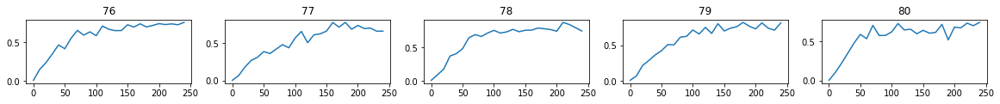

[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
[0.900715, 0.9794176, 0.9842572, 0.96474576, 0.99588406, 0.9898336, 0.99005705, 0.9943687, 0.99226296, 0.99324155]
   >> EXP 81 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.99it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 82 / 100 -- last fitness: 1.00 | last twit score: 0.12 | last loss: 0.0028


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.27it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 83 / 100 -- last fitness: 0.86 | last twit score: 0.10 | last loss: 0.0055


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.68it/s]


[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
   >> EXP 84 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0026


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.81it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 85 / 100 -- last fitness: 1.00 | last twit score: 0.17 | last loss: 0.0023


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.47it/s]


SHOWING FITNESS GRAPHS


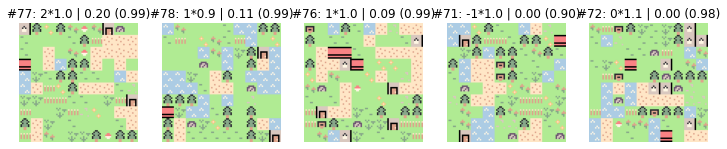

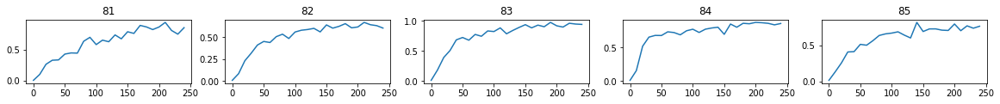

[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 86 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.52it/s]


[TWITTER RESULT] r:8  f:-2 => r:1.0 f:0.0
   >> EXP 87 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.95it/s]


[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 88 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.41it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 89 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.49it/s]


[TWITTER RESULT] r:4  f:0 => r:1.0 f:0.0
   >> EXP 90 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0039


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.19it/s]


SHOWING FITNESS GRAPHS


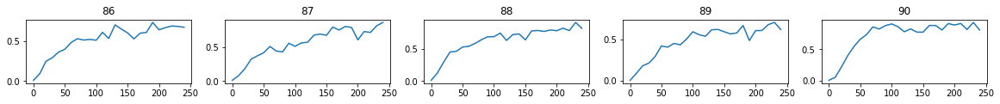

[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
[0.9994745, 0.85609996, 0.9997395, 0.99583757, 0.9881897, 0.9809681, 0.99787647, 0.99808705, 0.9833306, 0.9997697]
   >> EXP 91 / 100 -- last fitness: 1.00 | last twit score: 0.12 | last loss: 0.0076


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.86it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 92 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0040


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.10it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 93 / 100 -- last fitness: 1.00 | last twit score: 0.22 | last loss: 0.0026


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.27it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 94 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.23it/s]


[TWITTER RESULT] r:3  f:0 => r:1.0 f:0.0
   >> EXP 95 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0030


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.10it/s]


SHOWING FITNESS GRAPHS


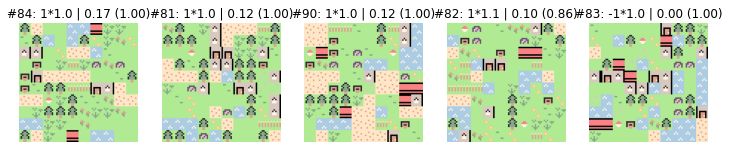

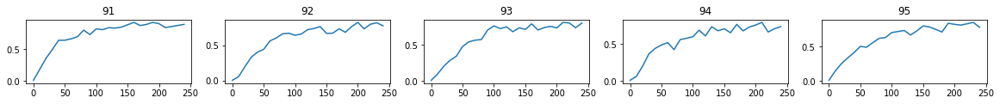

[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 96 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.02it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 97 / 100 -- last fitness: 0.99 | last twit score: 0.09 | last loss: 0.0021


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.98it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 98 / 100 -- last fitness: 1.00 | last twit score: 0.18 | last loss: 0.0018


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.18it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 99 / 100 -- last fitness: 0.98 | last twit score: 0.09 | last loss: 0.0019


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 25.90it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 100 / 100 -- last fitness: 0.89 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.31it/s]


SHOWING FITNESS GRAPHS


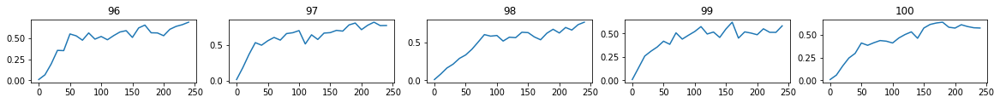

[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
[0.9993845, 0.99500805, 0.9966231, 0.9820299, 0.99533856, 0.98729694, 0.9958369, 0.9844563, 0.89006346, 0.90801144]
> amongus tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:10  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:-3  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:1  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:1  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:4  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:1  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-5 => r:1.0 f:0.0
[TWITTER RESULT] r:1  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-5 => r:1.0 f

epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.81it/s]


[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 2 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0028


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.06it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 3 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0041


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.54it/s]


[TWITTER RESULT] r:11  f:1 => r:0.917 f:0.083
   >> EXP 4 / 100 -- last fitness: 0.99 | last twit score: 0.08 | last loss: 0.0049


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.18it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 5 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0049


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.08it/s]


SHOWING FITNESS GRAPHS


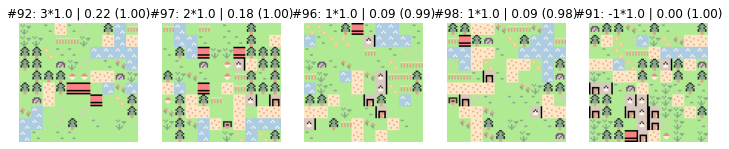

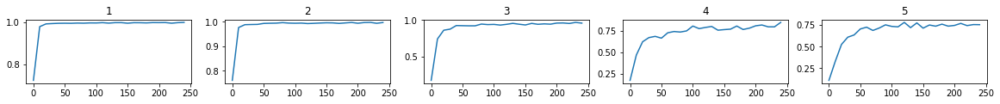

[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 6 / 100 -- last fitness: 0.88 | last twit score: 0.12 | last loss: 0.0123


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.47it/s]


[TWITTER RESULT] r:1  f:0 => r:1.0 f:0.0
   >> EXP 7 / 100 -- last fitness: 0.79 | last twit score: 0.00 | last loss: 0.0066


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.92it/s]


[TWITTER RESULT] r:9  f:3 => r:0.750 f:0.250
   >> EXP 8 / 100 -- last fitness: 0.85 | last twit score: 0.25 | last loss: 0.0043


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.92it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 9 / 100 -- last fitness: 0.79 | last twit score: 0.22 | last loss: 0.0053


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.33it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 10 / 100 -- last fitness: 0.89 | last twit score: 0.17 | last loss: 0.0137


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.28it/s]


SHOWING FITNESS GRAPHS


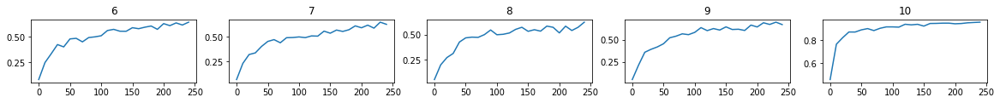

[TWITTER RESULT] r:1  f:1 => r:0.500 f:0.500
[0.9996031, 0.9993998, 0.98739344, 0.93645537, 0.8774041, 0.786941, 0.8451207, 0.7851728, 0.88589025, 0.9755056]
   >> EXP 11 / 100 -- last fitness: 0.98 | last twit score: 0.50 | last loss: 0.0154


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.44it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 12 / 100 -- last fitness: 0.89 | last twit score: 0.12 | last loss: 0.0115


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.29it/s]


[TWITTER RESULT] r:9  f:3 => r:0.750 f:0.250
   >> EXP 13 / 100 -- last fitness: 0.93 | last twit score: 0.25 | last loss: 0.0134


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.81it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 14 / 100 -- last fitness: 0.84 | last twit score: 0.14 | last loss: 0.0158


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.34it/s]


[TWITTER RESULT] r:5  f:3 => r:0.625 f:0.375
   >> EXP 15 / 100 -- last fitness: 0.85 | last twit score: 0.38 | last loss: 0.0079


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.99it/s]


SHOWING FITNESS GRAPHS


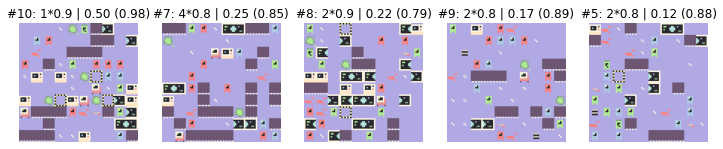

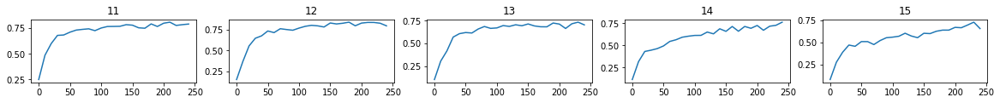

[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 16 / 100 -- last fitness: 0.87 | last twit score: 0.11 | last loss: 0.0094


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.75it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 17 / 100 -- last fitness: 0.73 | last twit score: 0.17 | last loss: 0.0113


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.29it/s]


[TWITTER RESULT] r:0  f:0 => r:1.0 f:0.0
   >> EXP 18 / 100 -- last fitness: 0.70 | last twit score: 0.00 | last loss: 0.0391


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.65it/s]


[TWITTER RESULT] r:0  f:0 => r:1.0 f:0.0
   >> EXP 19 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0144


epoch: 250 - fit: 0.67 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.97it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 20 / 100 -- last fitness: 0.67 | last twit score: 0.14 | last loss: 0.0106


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.00it/s]


SHOWING FITNESS GRAPHS


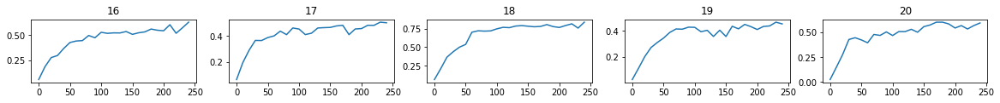

[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
[0.885494, 0.9340137, 0.837613, 0.8519886, 0.86530876, 0.7326314, 0.7029595, 0.9613628, 0.669769, 0.83499587]
   >> EXP 21 / 100 -- last fitness: 0.83 | last twit score: 0.00 | last loss: 0.0272


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.95it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 22 / 100 -- last fitness: 0.78 | last twit score: 0.22 | last loss: 0.0089


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.57it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 23 / 100 -- last fitness: 0.79 | last twit score: 0.00 | last loss: 0.0110


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.92it/s]


[TWITTER RESULT] r:3  f:2 => r:0.600 f:0.400
   >> EXP 24 / 100 -- last fitness: 0.69 | last twit score: 0.40 | last loss: 0.0089


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.39it/s]


[TWITTER RESULT] r:6  f:2 => r:0.750 f:0.250
   >> EXP 25 / 100 -- last fitness: 0.84 | last twit score: 0.25 | last loss: 0.0087


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.47it/s]


SHOWING FITNESS GRAPHS


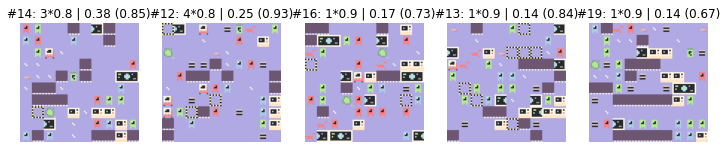

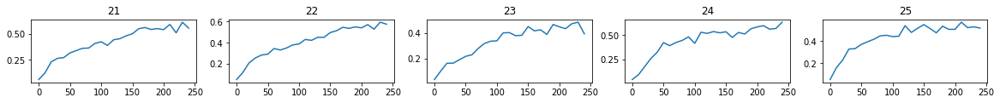

[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 26 / 100 -- last fitness: 0.76 | last twit score: 0.00 | last loss: 0.0124


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.24it/s]


[TWITTER RESULT] r:4  f:2 => r:0.667 f:0.333
   >> EXP 27 / 100 -- last fitness: 0.85 | last twit score: 0.33 | last loss: 0.0102


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.90it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 28 / 100 -- last fitness: 0.81 | last twit score: 0.33 | last loss: 0.0090


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.30it/s]


[TWITTER RESULT] r:6  f:2 => r:0.750 f:0.250
   >> EXP 29 / 100 -- last fitness: 0.89 | last twit score: 0.25 | last loss: 0.0107


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.17it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 30 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0099


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.44it/s]


SHOWING FITNESS GRAPHS


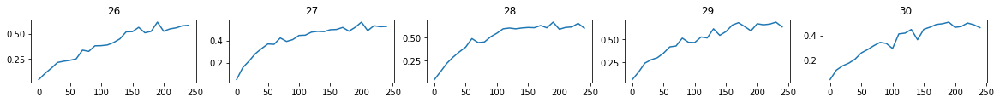

[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
[0.78218555, 0.79197437, 0.6855141, 0.8391262, 0.7617389, 0.8455, 0.8051646, 0.887035, 0.9206791, 0.7405081]
   >> EXP 31 / 100 -- last fitness: 0.74 | last twit score: 0.00 | last loss: 0.0095


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.81it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 32 / 100 -- last fitness: 0.75 | last twit score: 0.18 | last loss: 0.0101


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.01it/s]


[TWITTER RESULT] r:10  f:2 => r:0.833 f:0.167
   >> EXP 33 / 100 -- last fitness: 0.73 | last twit score: 0.17 | last loss: 0.0106


epoch: 250 - fit: 0.63 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.86it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 34 / 100 -- last fitness: 0.63 | last twit score: 0.12 | last loss: 0.0109


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.79it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 35 / 100 -- last fitness: 0.87 | last twit score: 0.33 | last loss: 0.0090


epoch: 250 - fit: 0.72 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.78it/s]


SHOWING FITNESS GRAPHS


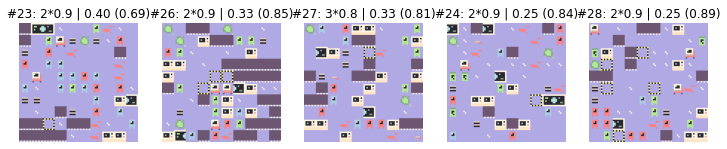

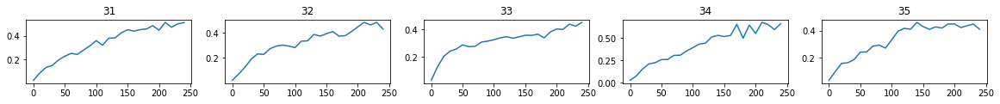

[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 36 / 100 -- last fitness: 0.72 | last twit score: 0.00 | last loss: 0.0093


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.19it/s]


[TWITTER RESULT] r:5  f:3 => r:0.625 f:0.375
   >> EXP 37 / 100 -- last fitness: 0.79 | last twit score: 0.38 | last loss: 0.0111


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.14it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 38 / 100 -- last fitness: 0.86 | last twit score: 0.18 | last loss: 0.0089


epoch: 250 - fit: 0.57 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.70it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 39 / 100 -- last fitness: 0.57 | last twit score: 0.00 | last loss: 0.0114


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.36it/s]


[TWITTER RESULT] r:-1  f:0 => r:1.0 f:0.0
   >> EXP 40 / 100 -- last fitness: 0.70 | last twit score: 0.00 | last loss: 0.0088


epoch: 250 - fit: 0.66 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.82it/s]


SHOWING FITNESS GRAPHS


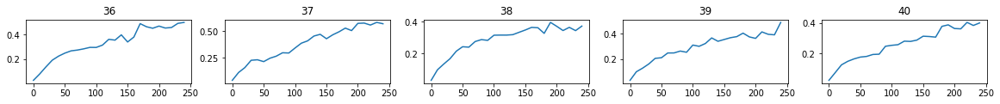

[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
[0.749358, 0.7320581, 0.62896407, 0.87256885, 0.71922183, 0.7861507, 0.8623735, 0.56583035, 0.69651496, 0.65900767]
   >> EXP 41 / 100 -- last fitness: 0.66 | last twit score: 0.00 | last loss: 0.0083


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.20it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 42 / 100 -- last fitness: 0.78 | last twit score: 0.09 | last loss: 0.0104


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.42it/s]


[TWITTER RESULT] r:0  f:1 => r:0.0 f:1.0
   >> EXP 43 / 100 -- last fitness: 0.89 | last twit score: 1.00 | last loss: 0.0083


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.90it/s]


[TWITTER RESULT] r:1  f:0 => r:1.0 f:0.0
   >> EXP 44 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0088


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.88it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 45 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0086


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.06it/s]


SHOWING FITNESS GRAPHS


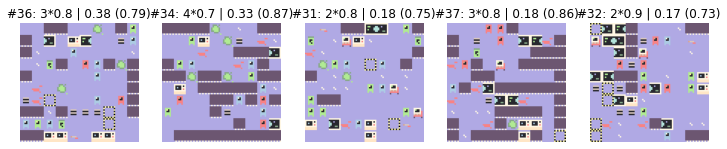

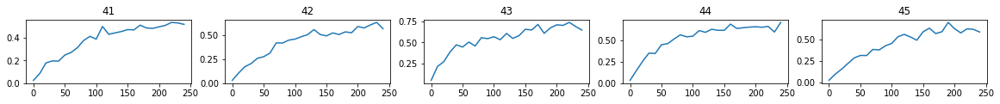

[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 46 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0076


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.96it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 47 / 100 -- last fitness: 0.84 | last twit score: 0.12 | last loss: 0.0078


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.83it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 48 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0076


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.07it/s]


[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
   >> EXP 49 / 100 -- last fitness: 0.86 | last twit score: 0.27 | last loss: 0.0069


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.23it/s]


[TWITTER RESULT] r:-2  f:0 => r:1.0 f:0.0
   >> EXP 50 / 100 -- last fitness: 0.76 | last twit score: 0.00 | last loss: 0.0211


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.40it/s]


SHOWING FITNESS GRAPHS


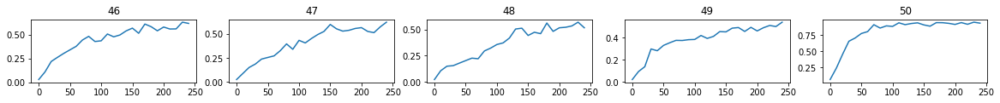

[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
[0.77565205, 0.8934518, 0.94352704, 0.92753744, 0.92848265, 0.84134233, 0.8722353, 0.8563262, 0.75847936, 0.99703175]
   >> EXP 51 / 100 -- last fitness: 1.00 | last twit score: 0.11 | last loss: 0.0072


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.04it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 52 / 100 -- last fitness: 0.90 | last twit score: 0.18 | last loss: 0.0093


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.19it/s]


[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 53 / 100 -- last fitness: 0.80 | last twit score: 0.11 | last loss: 0.0080


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.26it/s]


[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 54 / 100 -- last fitness: 0.84 | last twit score: 0.11 | last loss: 0.0076


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.80it/s]


[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 55 / 100 -- last fitness: 0.80 | last twit score: 0.00 | last loss: 0.0065


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.07it/s]


SHOWING FITNESS GRAPHS


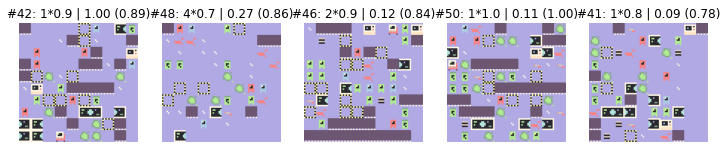

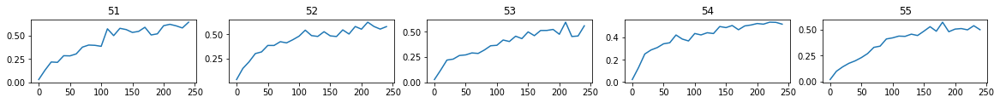

[TWITTER RESULT] r:11  f:3 => r:0.786 f:0.214
   >> EXP 56 / 100 -- last fitness: 0.81 | last twit score: 0.21 | last loss: 0.0068


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.89it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 57 / 100 -- last fitness: 0.77 | last twit score: 0.20 | last loss: 0.0051


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.22it/s]


[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
   >> EXP 58 / 100 -- last fitness: 0.70 | last twit score: 0.00 | last loss: 0.0077


epoch: 50 - fit: 0.66 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 38.32it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 59 / 100 -- last fitness: 0.66 | last twit score: 0.10 | last loss: 0.0089


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.24it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 60 / 100 -- last fitness: 0.86 | last twit score: 0.17 | last loss: 0.0064


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.56it/s]


SHOWING FITNESS GRAPHS


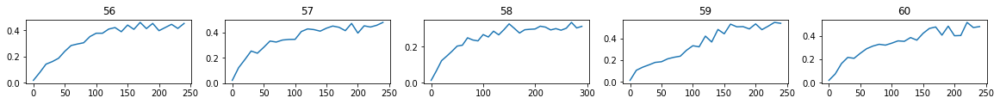

[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
[0.90119356, 0.79709554, 0.83691645, 0.7977447, 0.80926275, 0.76650774, 0.69561785, 0.6591987, 0.8603089, 0.7781744]
   >> EXP 61 / 100 -- last fitness: 0.78 | last twit score: 0.00 | last loss: 0.0067


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.69it/s]


[TWITTER RESULT] r:11  f:2 => r:0.846 f:0.154
   >> EXP 62 / 100 -- last fitness: 0.69 | last twit score: 0.15 | last loss: 0.0062


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.38it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 63 / 100 -- last fitness: 0.80 | last twit score: 0.12 | last loss: 0.0071


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.07it/s]


[TWITTER RESULT] r:3  f:1 => r:0.750 f:0.250
   >> EXP 64 / 100 -- last fitness: 0.70 | last twit score: 0.25 | last loss: 0.0065


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.12it/s]


[TWITTER RESULT] r:3  f:0 => r:1.0 f:0.0
   >> EXP 65 / 100 -- last fitness: 0.73 | last twit score: 0.00 | last loss: 0.0060


epoch: 250 - fit: 0.59 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.52it/s]


SHOWING FITNESS GRAPHS


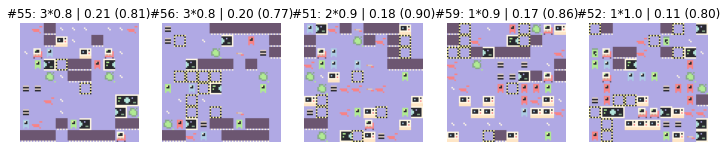

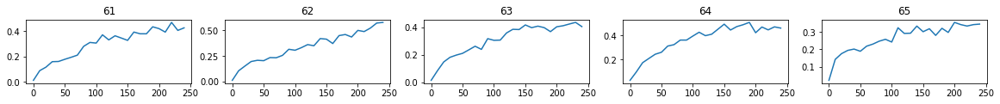

[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 66 / 100 -- last fitness: 0.59 | last twit score: 0.17 | last loss: 0.0065


epoch: 250 - fit: 0.51 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.07it/s]


[TWITTER RESULT] r:6  f:0 => r:1.0 f:0.0
   >> EXP 67 / 100 -- last fitness: 0.51 | last twit score: 0.00 | last loss: 0.0144


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.05it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 68 / 100 -- last fitness: 0.86 | last twit score: 0.00 | last loss: 0.0099


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.41it/s]


[TWITTER RESULT] r:3  f:2 => r:0.600 f:0.400
   >> EXP 69 / 100 -- last fitness: 0.80 | last twit score: 0.40 | last loss: 0.0114


epoch: 250 - fit: 0.72 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.99it/s]


[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
   >> EXP 70 / 100 -- last fitness: 0.72 | last twit score: 0.27 | last loss: 0.0108


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.04it/s]


SHOWING FITNESS GRAPHS


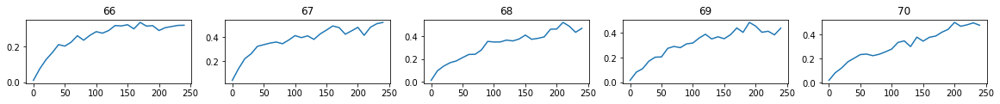

[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
[0.69211715, 0.80070233, 0.69567686, 0.73166025, 0.5915569, 0.51406515, 0.8600569, 0.8014144, 0.721927, 0.85847145]
   >> EXP 71 / 100 -- last fitness: 0.86 | last twit score: 0.00 | last loss: 0.0113


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.43it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 72 / 100 -- last fitness: 0.76 | last twit score: 0.18 | last loss: 0.0109


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.96it/s]


[TWITTER RESULT] r:-1  f:1 => r:0.0 f:1.0
   >> EXP 73 / 100 -- last fitness: 0.68 | last twit score: 1.00 | last loss: 0.0143


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.85it/s]


[TWITTER RESULT] r:10  f:2 => r:0.833 f:0.167
   >> EXP 74 / 100 -- last fitness: 0.73 | last twit score: 0.17 | last loss: 0.0156


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.46it/s]


[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
   >> EXP 75 / 100 -- last fitness: 0.69 | last twit score: 0.20 | last loss: 0.0141


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.25it/s]


SHOWING FITNESS GRAPHS


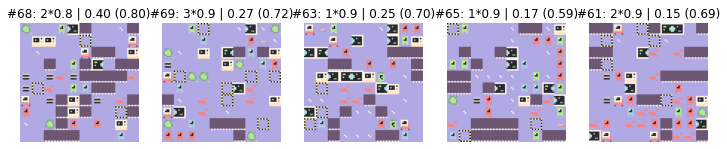

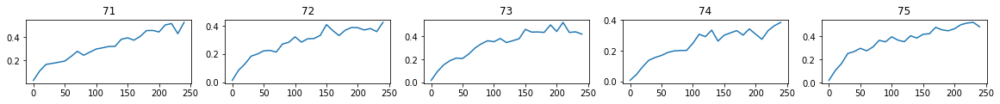

[TWITTER RESULT] r:-2  f:1 => r:0.0 f:1.0
   >> EXP 76 / 100 -- last fitness: 0.79 | last twit score: 1.00 | last loss: 0.0184


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.24it/s]


[TWITTER RESULT] r:9  f:-2 => r:1.0 f:0.0
   >> EXP 77 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0184


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.12it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 78 / 100 -- last fitness: 0.92 | last twit score: 0.09 | last loss: 0.0173


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.24it/s]


[TWITTER RESULT] r:2  f:1 => r:0.667 f:0.333
   >> EXP 79 / 100 -- last fitness: 0.83 | last twit score: 0.33 | last loss: 0.0189


epoch: 250 - fit: 0.63 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.56it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 80 / 100 -- last fitness: 0.63 | last twit score: 0.14 | last loss: 0.0177


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.34it/s]


SHOWING FITNESS GRAPHS


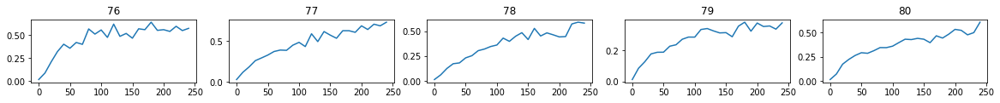

[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
[0.7640539, 0.67657083, 0.726047, 0.69163996, 0.7854915, 0.87305576, 0.92202294, 0.8255354, 0.62565774, 0.7696596]
   >> EXP 81 / 100 -- last fitness: 0.77 | last twit score: 0.18 | last loss: 0.0175


epoch: 250 - fit: 0.72 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.77it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 82 / 100 -- last fitness: 0.72 | last twit score: 0.00 | last loss: 0.0194


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.77it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 83 / 100 -- last fitness: 0.94 | last twit score: 0.10 | last loss: 0.0172


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.99it/s]


[TWITTER RESULT] r:10  f:3 => r:0.769 f:0.231
   >> EXP 84 / 100 -- last fitness: 0.84 | last twit score: 0.23 | last loss: 0.0178


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.17it/s]


[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
   >> EXP 85 / 100 -- last fitness: 0.73 | last twit score: 0.20 | last loss: 0.0168


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.59it/s]


SHOWING FITNESS GRAPHS


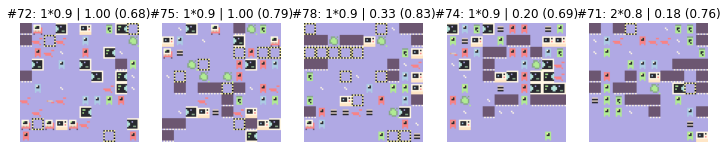

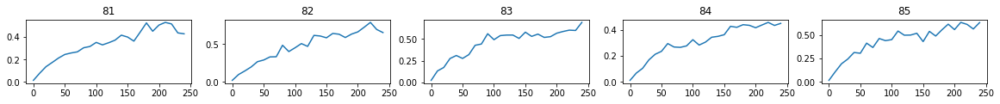

[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 86 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0162


epoch: 250 - fit: 0.82 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.23it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 87 / 100 -- last fitness: 0.82 | last twit score: 0.00 | last loss: 0.0159


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.53it/s]


[TWITTER RESULT] r:10  f:3 => r:0.769 f:0.231
   >> EXP 88 / 100 -- last fitness: 0.68 | last twit score: 0.23 | last loss: 0.0157


epoch: 50 - fit: 0.52 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 37.32it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 89 / 100 -- last fitness: 0.52 | last twit score: 0.18 | last loss: 0.0155


epoch: 250 - fit: 0.56 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.01it/s]


[TWITTER RESULT] r:3  f:2 => r:0.600 f:0.400
   >> EXP 90 / 100 -- last fitness: 0.56 | last twit score: 0.40 | last loss: 0.0197


epoch: 50 - fit: 0.52 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 38.04it/s]


SHOWING FITNESS GRAPHS


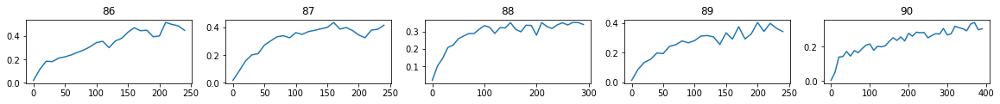

[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
[0.72165126, 0.9401437, 0.84357005, 0.730574, 0.87258434, 0.8186463, 0.68359977, 0.52008027, 0.5585945, 0.5174111]
   >> EXP 91 / 100 -- last fitness: 0.52 | last twit score: 0.14 | last loss: 0.0171


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.13it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 92 / 100 -- last fitness: 0.90 | last twit score: 0.17 | last loss: 0.0163


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.88it/s]


[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 93 / 100 -- last fitness: 0.77 | last twit score: 0.11 | last loss: 0.0154


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.95it/s]


[TWITTER RESULT] r:-1  f:-1 => r:1.0 f:0.0
   >> EXP 94 / 100 -- last fitness: 0.83 | last twit score: 0.00 | last loss: 0.0163


epoch: 50 - fit: 0.56 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 38.11it/s]


[TWITTER RESULT] r:2  f:1 => r:0.667 f:0.333
   >> EXP 95 / 100 -- last fitness: 0.56 | last twit score: 0.33 | last loss: 0.0157


epoch: 250 - fit: 0.58 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.29it/s]


SHOWING FITNESS GRAPHS


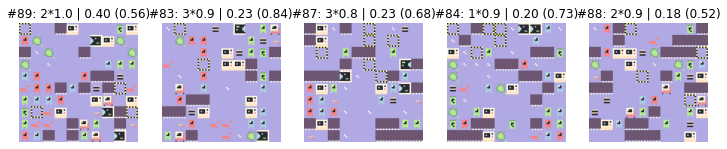

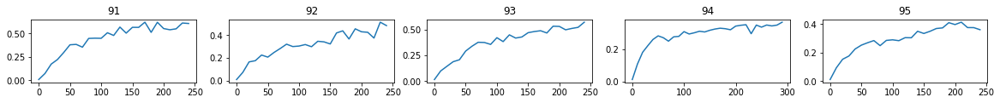

[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 96 / 100 -- last fitness: 0.58 | last twit score: 0.17 | last loss: 0.0164


epoch: 250 - fit: 0.57 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 36.33it/s]


[TWITTER RESULT] r:6  f:4 => r:0.600 f:0.400
   >> EXP 97 / 100 -- last fitness: 0.57 | last twit score: 0.40 | last loss: 0.0156


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.11it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 98 / 100 -- last fitness: 0.80 | last twit score: 0.20 | last loss: 0.0199


epoch: 250 - fit: 0.57 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.41it/s]


[TWITTER RESULT] r:11  f:3 => r:0.786 f:0.214
   >> EXP 99 / 100 -- last fitness: 0.57 | last twit score: 0.21 | last loss: 0.0173


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 37.65it/s]


[TWITTER RESULT] r:2  f:4 => r:0.333 f:0.667
   >> EXP 100 / 100 -- last fitness: 0.80 | last twit score: 0.67 | last loss: 0.0162


epoch: 250 - fit: 0.50 - N: 10.00: 100%|██████████| 250/250 [00:06<00:00, 38.13it/s]


SHOWING FITNESS GRAPHS


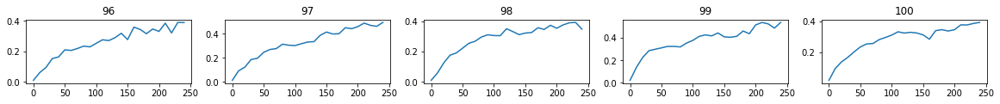

[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
[0.89959, 0.771433, 0.8298527, 0.5565847, 0.57707804, 0.5688672, 0.8048421, 0.56750584, 0.80073225, 0.50234306]
> pacman tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:9  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:13  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:3  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-3 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:2  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-3 => r:1.0 f:0.0
[TWITTER RESULT] r:13  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-3 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-3 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:-1  f:-4 => r:1.0

epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.91it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 2 / 100 -- last fitness: 1.00 | last twit score: 0.00 | last loss: 0.0006


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.33it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 3 / 100 -- last fitness: 1.00 | last twit score: 0.14 | last loss: 0.0047


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.56it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 4 / 100 -- last fitness: 0.83 | last twit score: 0.00 | last loss: 0.0559


epoch: 250 - fit: 0.51 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.95it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 5 / 100 -- last fitness: 0.51 | last twit score: 0.00 | last loss: 0.0588


epoch: 50 - fit: 0.50 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 33.65it/s]


SHOWING FITNESS GRAPHS


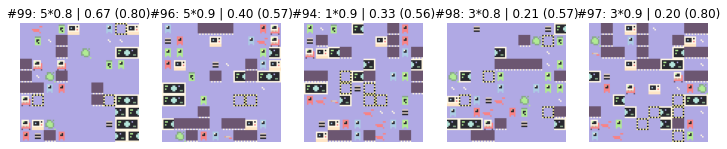

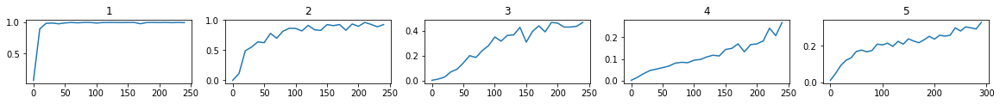

[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 6 / 100 -- last fitness: 0.50 | last twit score: 0.00 | last loss: 0.0637


epoch: 50 - fit: 0.50 - N: 10.00: 100%|██████████| 50/50 [00:01<00:00, 32.46it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 7 / 100 -- last fitness: 0.50 | last twit score: 0.00 | last loss: 0.0597


epoch: 250 - fit: 0.50 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.69it/s]


[TWITTER RESULT] r:11  f:-1 => r:1.0 f:0.0
   >> EXP 8 / 100 -- last fitness: 0.50 | last twit score: 0.00 | last loss: 0.0383


epoch: 250 - fit: 0.62 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.40it/s]


[TWITTER RESULT] r:6  f:-2 => r:1.0 f:0.0
   >> EXP 9 / 100 -- last fitness: 0.62 | last twit score: 0.00 | last loss: 0.0173


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.78it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 10 / 100 -- last fitness: 0.76 | last twit score: 0.12 | last loss: 0.0059


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.56it/s]


SHOWING FITNESS GRAPHS


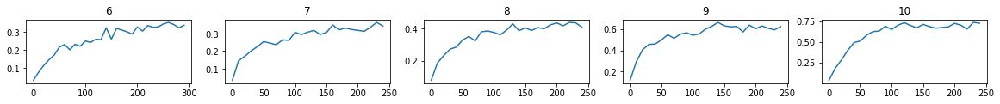

[TWITTER RESULT] r:8  f:-2 => r:1.0 f:0.0
[0.99986655, 0.9969767, 0.8332858, 0.5142776, 0.50102085, 0.50081736, 0.5014414, 0.61543334, 0.76357615, 0.8724632]
   >> EXP 11 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0290


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.31it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 12 / 100 -- last fitness: 0.96 | last twit score: 0.09 | last loss: 0.0071


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.76it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 13 / 100 -- last fitness: 0.96 | last twit score: 0.18 | last loss: 0.0284


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.72it/s]


[TWITTER RESULT] r:10  f:3 => r:0.769 f:0.231
   >> EXP 14 / 100 -- last fitness: 0.96 | last twit score: 0.23 | last loss: 0.0275


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.31it/s]


[TWITTER RESULT] r:3  f:1 => r:0.750 f:0.250
   >> EXP 15 / 100 -- last fitness: 0.89 | last twit score: 0.25 | last loss: 0.0113


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.96it/s]


SHOWING FITNESS GRAPHS


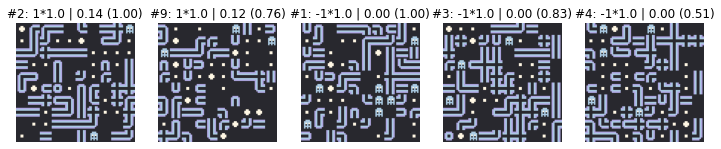

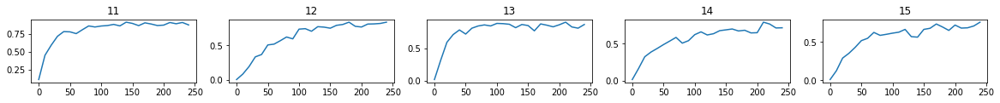

[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 16 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0252


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.93it/s]


[TWITTER RESULT] r:3  f:0 => r:1.0 f:0.0
   >> EXP 17 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0089


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.16it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 18 / 100 -- last fitness: 0.80 | last twit score: 0.12 | last loss: 0.0357


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.38it/s]


[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 19 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0409


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.14it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 20 / 100 -- last fitness: 0.97 | last twit score: 0.14 | last loss: 0.0194


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.92it/s]


SHOWING FITNESS GRAPHS


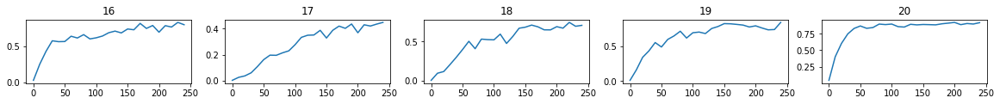

[TWITTER RESULT] r:11  f:1 => r:0.917 f:0.083
[0.96407413, 0.9564881, 0.95762396, 0.89104736, 0.90561044, 0.9162544, 0.7984239, 0.92833066, 0.9663613, 0.9741343]
   >> EXP 21 / 100 -- last fitness: 0.97 | last twit score: 0.08 | last loss: 0.0286


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.18it/s]


[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
   >> EXP 22 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0107


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.94it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 23 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0037


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.41it/s]


[TWITTER RESULT] r:14  f:1 => r:0.933 f:0.067
   >> EXP 24 / 100 -- last fitness: 0.87 | last twit score: 0.07 | last loss: 0.0034


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.23it/s]


[TWITTER RESULT] r:2  f:-2 => r:1.0 f:0.0
   >> EXP 25 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0062


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.82it/s]


SHOWING FITNESS GRAPHS


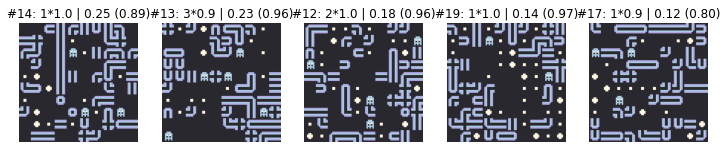

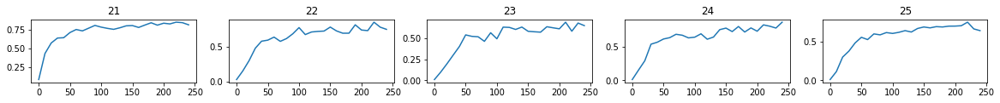

[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 26 / 100 -- last fitness: 0.89 | last twit score: 0.00 | last loss: 0.0062


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.53it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 27 / 100 -- last fitness: 0.94 | last twit score: 0.10 | last loss: 0.0025


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.79it/s]


[TWITTER RESULT] r:12  f:-1 => r:1.0 f:0.0
   >> EXP 28 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0035


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.10it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 29 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0156


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.71it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 30 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0029


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.79it/s]


SHOWING FITNESS GRAPHS


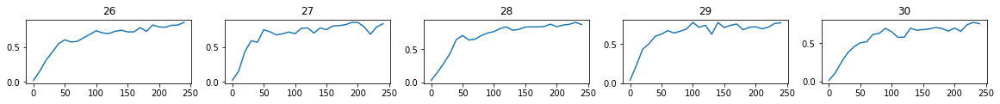

[TWITTER RESULT] r:13  f:0 => r:1.0 f:0.0
[0.9222337, 0.94378805, 0.87334085, 0.945783, 0.89171386, 0.9379721, 0.973074, 0.9743898, 0.9410869, 0.93352485]
   >> EXP 31 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.52it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 32 / 100 -- last fitness: 0.93 | last twit score: 0.08 | last loss: 0.0016


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.88it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 33 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0031


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.17it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 34 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0118


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.45it/s]


[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
   >> EXP 35 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.06it/s]


SHOWING FITNESS GRAPHS


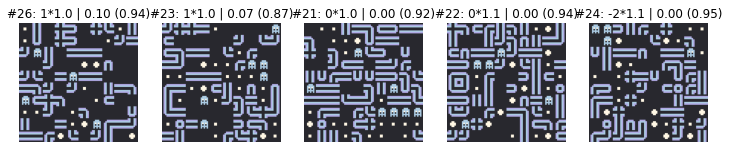

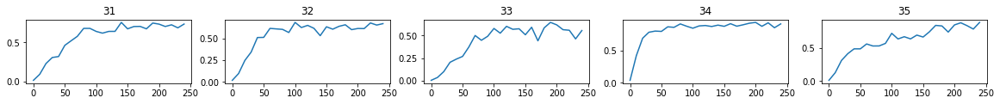

[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 36 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0073


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.40it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 37 / 100 -- last fitness: 0.95 | last twit score: 0.10 | last loss: 0.0021


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.05it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 38 / 100 -- last fitness: 0.96 | last twit score: 0.09 | last loss: 0.0034


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.09it/s]


[TWITTER RESULT] r:12  f:2 => r:0.857 f:0.143
   >> EXP 39 / 100 -- last fitness: 0.86 | last twit score: 0.14 | last loss: 0.0019


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.49it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 40 / 100 -- last fitness: 0.97 | last twit score: 0.17 | last loss: 0.0018


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.84it/s]


SHOWING FITNESS GRAPHS


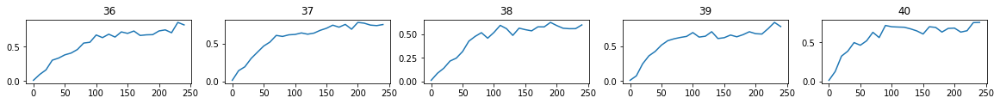

[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
[0.9285438, 0.91152257, 0.90531874, 0.9833, 0.9705677, 0.95002544, 0.9594006, 0.8558192, 0.9694812, 0.92358696]
   >> EXP 41 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0014


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.14it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 42 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0169


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.34it/s]


[TWITTER RESULT] r:6  f:-1 => r:1.0 f:0.0
   >> EXP 43 / 100 -- last fitness: 0.77 | last twit score: 0.00 | last loss: 0.0030


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.08it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 44 / 100 -- last fitness: 0.97 | last twit score: 0.09 | last loss: 0.0049


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.97it/s]


[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
   >> EXP 45 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0033


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.32it/s]


SHOWING FITNESS GRAPHS


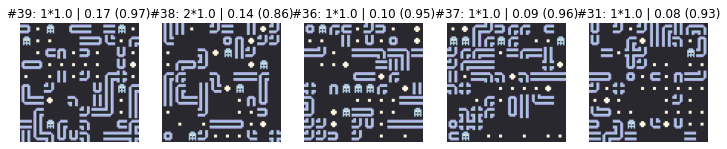

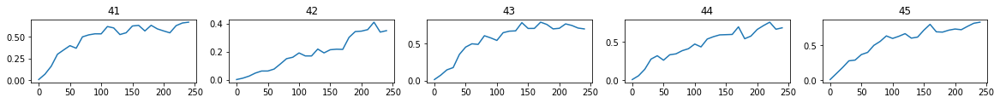

[TWITTER RESULT] r:12  f:-1 => r:1.0 f:0.0
   >> EXP 46 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0026


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.08it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 47 / 100 -- last fitness: 0.94 | last twit score: 0.12 | last loss: 0.0024


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.22it/s]


[TWITTER RESULT] r:5  f:-1 => r:1.0 f:0.0
   >> EXP 48 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0020


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.30it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 49 / 100 -- last fitness: 0.87 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.92it/s]


[TWITTER RESULT] r:4  f:-1 => r:1.0 f:0.0
   >> EXP 50 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.46it/s]


SHOWING FITNESS GRAPHS


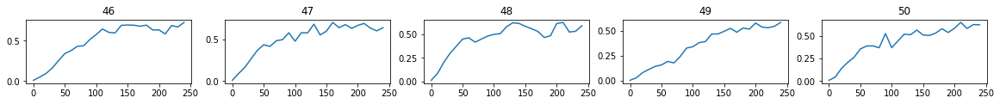

[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
[0.9370688, 0.7688378, 0.9667357, 0.9625453, 0.97564965, 0.9439814, 0.9389347, 0.8730993, 0.9383856, 0.9014024]
   >> EXP 51 / 100 -- last fitness: 0.90 | last twit score: 0.20 | last loss: 0.0042


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.25it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 52 / 100 -- last fitness: 0.97 | last twit score: 0.17 | last loss: 0.0027


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.48it/s]


[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 53 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.44it/s]


[TWITTER RESULT] r:13  f:0 => r:1.0 f:0.0
   >> EXP 54 / 100 -- last fitness: 0.92 | last twit score: 0.00 | last loss: 0.0019


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.04it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 55 / 100 -- last fitness: 0.88 | last twit score: 0.10 | last loss: 0.0018


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.13it/s]


SHOWING FITNESS GRAPHS


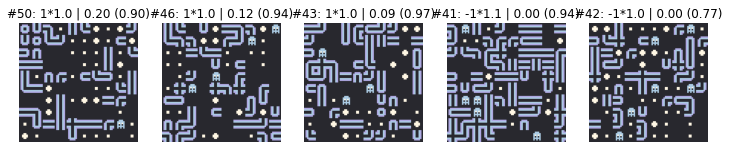

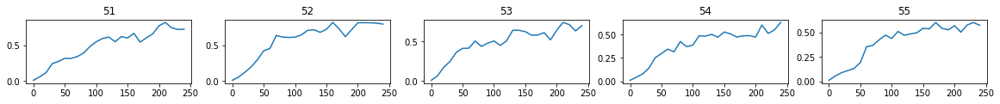

[TWITTER RESULT] r:12  f:0 => r:1.0 f:0.0
   >> EXP 56 / 100 -- last fitness: 0.88 | last twit score: 0.00 | last loss: 0.0018


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.52it/s]


[TWITTER RESULT] r:9  f:1 => r:0.900 f:0.100
   >> EXP 57 / 100 -- last fitness: 0.79 | last twit score: 0.10 | last loss: 0.0020


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.14it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 58 / 100 -- last fitness: 0.81 | last twit score: 0.17 | last loss: 0.0020


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.83it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 59 / 100 -- last fitness: 0.84 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.84it/s]


[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 60 / 100 -- last fitness: 0.81 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.21it/s]


SHOWING FITNESS GRAPHS


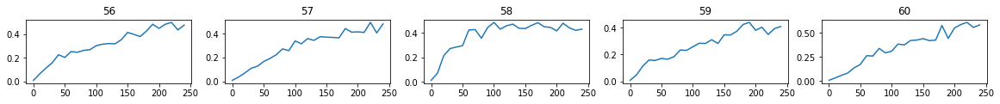

[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
[0.9673375, 0.975109, 0.917904, 0.88440216, 0.87886465, 0.7892671, 0.8145895, 0.8375397, 0.8097477, 0.9133699]
   >> EXP 61 / 100 -- last fitness: 0.91 | last twit score: 0.14 | last loss: 0.0022


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.10it/s]


[TWITTER RESULT] r:14  f:0 => r:1.0 f:0.0
   >> EXP 62 / 100 -- last fitness: 0.80 | last twit score: 0.00 | last loss: 0.0021


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.12it/s]


[TWITTER RESULT] r:9  f:-1 => r:1.0 f:0.0
   >> EXP 63 / 100 -- last fitness: 0.75 | last twit score: 0.00 | last loss: 0.0023


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 28.78it/s]


[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 64 / 100 -- last fitness: 0.68 | last twit score: 0.09 | last loss: 0.0022


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.34it/s]


[TWITTER RESULT] r:1  f:1 => r:0.500 f:0.500
   >> EXP 65 / 100 -- last fitness: 0.91 | last twit score: 0.50 | last loss: 0.0030


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.51it/s]


SHOWING FITNESS GRAPHS


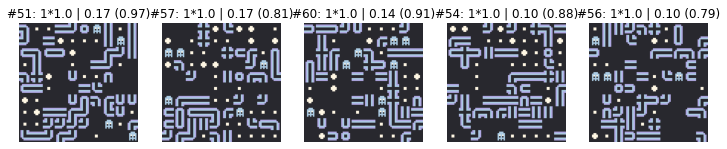

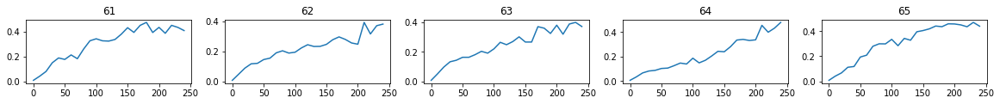

[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
   >> EXP 66 / 100 -- last fitness: 0.84 | last twit score: 0.09 | last loss: 0.0033


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:09<00:00, 26.67it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 67 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0043


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.26it/s]


[TWITTER RESULT] r:2  f:2 => r:0.500 f:0.500
   >> EXP 68 / 100 -- last fitness: 0.98 | last twit score: 0.50 | last loss: 0.0048


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.83it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 69 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0037


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.33it/s]


[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 70 / 100 -- last fitness: 0.90 | last twit score: 0.00 | last loss: 0.0035


epoch: 250 - fit: 0.92 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.62it/s]


SHOWING FITNESS GRAPHS


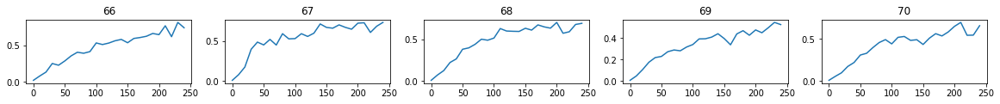

[TWITTER RESULT] r:10  f:1 => r:0.909 f:0.091
[0.80223477, 0.74587667, 0.6839555, 0.9079238, 0.84156334, 0.9652164, 0.9827945, 0.93520653, 0.89817435, 0.9198446]
   >> EXP 71 / 100 -- last fitness: 0.92 | last twit score: 0.09 | last loss: 0.0030


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.45it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 72 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0032


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.42it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 73 / 100 -- last fitness: 0.88 | last twit score: 0.00 | last loss: 0.0034


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.16it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 74 / 100 -- last fitness: 0.76 | last twit score: 0.17 | last loss: 0.0041


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.87it/s]


[TWITTER RESULT] r:8  f:-1 => r:1.0 f:0.0
   >> EXP 75 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0032


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 33.12it/s]


SHOWING FITNESS GRAPHS


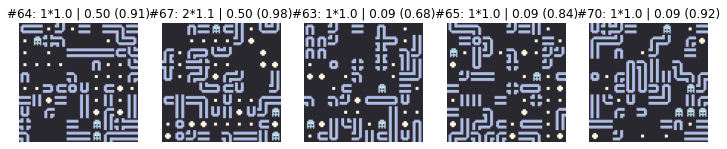

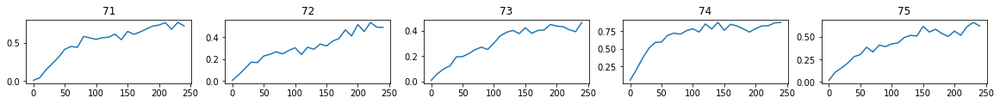

[TWITTER RESULT] r:12  f:-2 => r:1.0 f:0.0
   >> EXP 76 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0028


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.19it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 77 / 100 -- last fitness: 0.95 | last twit score: 0.17 | last loss: 0.0025


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.62it/s]


[TWITTER RESULT] r:12  f:1 => r:0.923 f:0.077
   >> EXP 78 / 100 -- last fitness: 0.90 | last twit score: 0.08 | last loss: 0.0023


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.19it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 79 / 100 -- last fitness: 0.89 | last twit score: 0.00 | last loss: 0.0030


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.67it/s]


[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
   >> EXP 80 / 100 -- last fitness: 0.81 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.57it/s]


SHOWING FITNESS GRAPHS


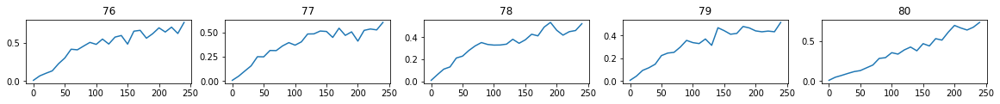

[TWITTER RESULT] r:10  f:2 => r:0.833 f:0.167
[0.9559567, 0.8826178, 0.7640383, 0.9912852, 0.90924156, 0.9521489, 0.9007155, 0.8949994, 0.8121112, 0.97210205]
   >> EXP 81 / 100 -- last fitness: 0.97 | last twit score: 0.17 | last loss: 0.0026


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.24it/s]


[TWITTER RESULT] r:7  f:-1 => r:1.0 f:0.0
   >> EXP 82 / 100 -- last fitness: 0.84 | last twit score: 0.00 | last loss: 0.0053


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.39it/s]


[TWITTER RESULT] r:5  f:1 => r:0.833 f:0.167
   >> EXP 83 / 100 -- last fitness: 1.00 | last twit score: 0.17 | last loss: 0.0050


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.02it/s]


[TWITTER RESULT] r:4  f:-1 => r:1.0 f:0.0
   >> EXP 84 / 100 -- last fitness: 0.99 | last twit score: 0.00 | last loss: 0.0031


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.48it/s]


[TWITTER RESULT] r:2  f:0 => r:1.0 f:0.0
   >> EXP 85 / 100 -- last fitness: 0.95 | last twit score: 0.00 | last loss: 0.0030


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.67it/s]


SHOWING FITNESS GRAPHS


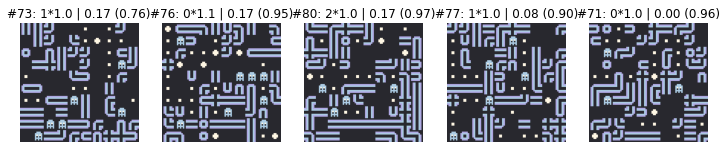

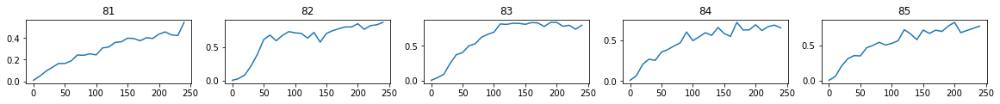

[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 86 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.86it/s]


[TWITTER RESULT] r:9  f:0 => r:1.0 f:0.0
   >> EXP 87 / 100 -- last fitness: 0.97 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.84it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 88 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0022


epoch: 250 - fit: 0.96 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.30it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 89 / 100 -- last fitness: 0.96 | last twit score: 0.00 | last loss: 0.0027


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.13it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 90 / 100 -- last fitness: 0.91 | last twit score: 0.18 | last loss: 0.0043


epoch: 250 - fit: 0.97 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.94it/s]


SHOWING FITNESS GRAPHS


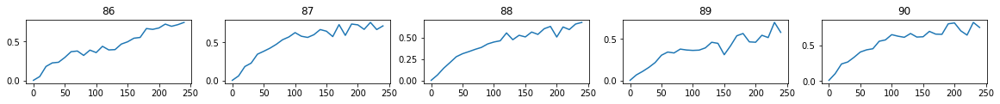

[TWITTER RESULT] r:4  f:1 => r:0.800 f:0.200
[0.83518565, 0.99729025, 0.98637486, 0.9528651, 0.96349347, 0.97254324, 0.9646783, 0.9603199, 0.91063696, 0.9719389]
   >> EXP 91 / 100 -- last fitness: 0.97 | last twit score: 0.20 | last loss: 0.0031


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.09it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 92 / 100 -- last fitness: 0.98 | last twit score: 0.00 | last loss: 0.0029


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.96it/s]


[TWITTER RESULT] r:7  f:0 => r:1.0 f:0.0
   >> EXP 93 / 100 -- last fitness: 0.94 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.93 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.69it/s]


[TWITTER RESULT] r:10  f:-1 => r:1.0 f:0.0
   >> EXP 94 / 100 -- last fitness: 0.93 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.22it/s]


[TWITTER RESULT] r:14  f:0 => r:1.0 f:0.0
   >> EXP 95 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0028


epoch: 250 - fit: 0.63 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.75it/s]


SHOWING FITNESS GRAPHS


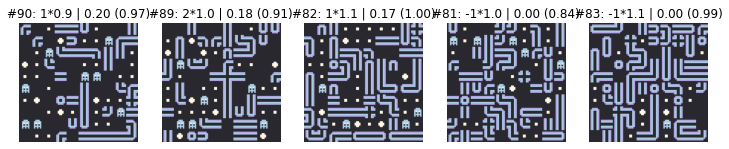

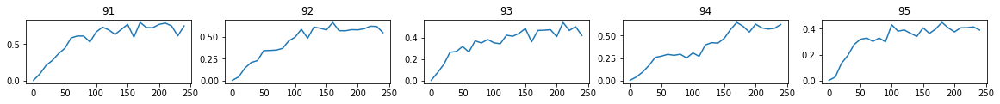

[TWITTER RESULT] r:10  f:0 => r:1.0 f:0.0
   >> EXP 96 / 100 -- last fitness: 0.63 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.35it/s]


[TWITTER RESULT] r:8  f:0 => r:1.0 f:0.0
   >> EXP 97 / 100 -- last fitness: 0.89 | last twit score: 0.00 | last loss: 0.0024


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.91it/s]


[TWITTER RESULT] r:5  f:0 => r:1.0 f:0.0
   >> EXP 98 / 100 -- last fitness: 0.78 | last twit score: 0.00 | last loss: 0.0031


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.19it/s]


[TWITTER RESULT] r:12  f:-1 => r:1.0 f:0.0
   >> EXP 99 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0026


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.51it/s]


[TWITTER RESULT] r:6  f:-2 => r:1.0 f:0.0
   >> EXP 100 / 100 -- last fitness: 0.91 | last twit score: 0.00 | last loss: 0.0025


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.00it/s]


SHOWING FITNESS GRAPHS


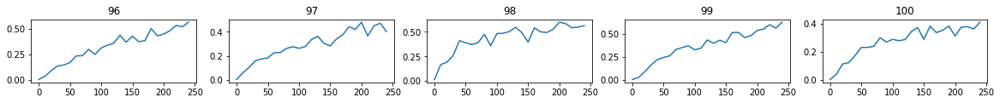

[TWITTER RESULT] r:11  f:0 => r:1.0 f:0.0
[0.98362863, 0.93778324, 0.9290898, 0.9149132, 0.62665933, 0.8859478, 0.7809106, 0.9092949, 0.9113916, 0.773492]
> dungeon tileset
 ------- TRIAL #1 --------
[TWITTER RESULT] r:13  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:6  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:2  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-3 => r:1.0 f:0.0
[TWITTER RESULT] r:12  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:5  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:9  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:6  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:11  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:7  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:10  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:8  f:-4 => r:1.0 f:0.0
[TWITTER RESULT] r:2  f:-4 => r:1.0 

epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.34it/s]


[TWITTER RESULT] r:3  f:2 => r:0.600 f:0.400
   >> EXP 2 / 100 -- last fitness: 1.00 | last twit score: 0.40 | last loss: 0.0839


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.37it/s]


[TWITTER RESULT] r:1  f:3 => r:0.250 f:0.750
   >> EXP 3 / 100 -- last fitness: 1.00 | last twit score: 0.75 | last loss: 0.0626


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.54it/s]


[TWITTER RESULT] r:0  f:1 => r:0.0 f:1.0
   >> EXP 4 / 100 -- last fitness: 1.00 | last twit score: 1.00 | last loss: 0.0506


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.21it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 5 / 100 -- last fitness: 1.00 | last twit score: 0.14 | last loss: 0.0095


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.25it/s]


SHOWING FITNESS GRAPHS


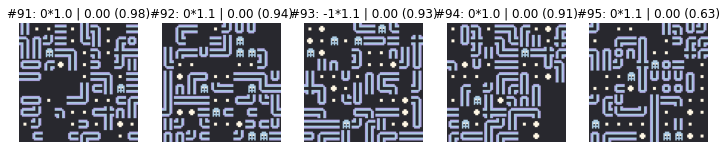

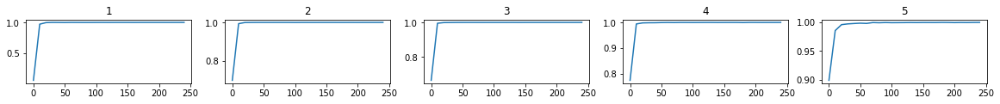

[TWITTER RESULT] r:8  f:1 => r:0.889 f:0.111
   >> EXP 6 / 100 -- last fitness: 1.00 | last twit score: 0.11 | last loss: 0.0128


epoch: 250 - fit: 1.00 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.77it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 7 / 100 -- last fitness: 1.00 | last twit score: 0.22 | last loss: 0.0131


epoch: 250 - fit: 0.99 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.33it/s]


[TWITTER RESULT] r:5  f:4 => r:0.556 f:0.444
   >> EXP 8 / 100 -- last fitness: 0.99 | last twit score: 0.44 | last loss: 0.0069


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.83it/s]


[TWITTER RESULT] r:8  f:4 => r:0.667 f:0.333
   >> EXP 9 / 100 -- last fitness: 0.98 | last twit score: 0.33 | last loss: 0.0058


epoch: 250 - fit: 0.95 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.06it/s]


[TWITTER RESULT] r:8  f:5 => r:0.615 f:0.385
   >> EXP 10 / 100 -- last fitness: 0.95 | last twit score: 0.38 | last loss: 0.0077


epoch: 250 - fit: 0.98 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.61it/s]


SHOWING FITNESS GRAPHS


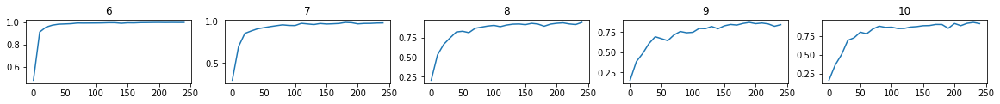

[TWITTER RESULT] r:7  f:4 => r:0.636 f:0.364
[1.0, 1.0, 1.0, 0.99999744, 0.99996996, 0.9997065, 0.9943498, 0.9766477, 0.9481158, 0.9778725]
   >> EXP 11 / 100 -- last fitness: 0.98 | last twit score: 0.36 | last loss: 0.0106


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.52it/s]


[TWITTER RESULT] r:5  f:5 => r:0.500 f:0.500
   >> EXP 12 / 100 -- last fitness: 0.86 | last twit score: 0.50 | last loss: 0.0032


epoch: 250 - fit: 0.85 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.24it/s]


[TWITTER RESULT] r:6  f:4 => r:0.600 f:0.400
   >> EXP 13 / 100 -- last fitness: 0.85 | last twit score: 0.40 | last loss: 0.0058


epoch: 250 - fit: 0.86 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.32it/s]


[TWITTER RESULT] r:8  f:5 => r:0.615 f:0.385
   >> EXP 14 / 100 -- last fitness: 0.86 | last twit score: 0.38 | last loss: 0.0062


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.59it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 15 / 100 -- last fitness: 0.75 | last twit score: 0.31 | last loss: 0.0044


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.02it/s]


SHOWING FITNESS GRAPHS


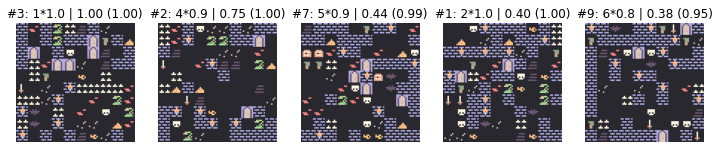

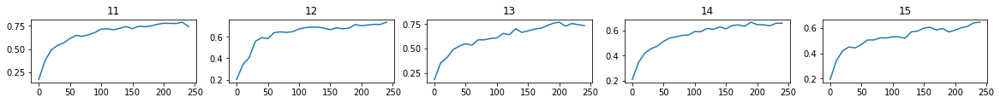

[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 16 / 100 -- last fitness: 0.74 | last twit score: 0.31 | last loss: 0.0052


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.86it/s]


[TWITTER RESULT] r:10  f:5 => r:0.667 f:0.333
   >> EXP 17 / 100 -- last fitness: 0.76 | last twit score: 0.33 | last loss: 0.0055


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.93it/s]


[TWITTER RESULT] r:10  f:4 => r:0.714 f:0.286
   >> EXP 18 / 100 -- last fitness: 0.69 | last twit score: 0.29 | last loss: 0.0058


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.96it/s]


[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 19 / 100 -- last fitness: 0.89 | last twit score: 0.29 | last loss: 0.0064


epoch: 250 - fit: 0.82 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.00it/s]


[TWITTER RESULT] r:10  f:3 => r:0.769 f:0.231
   >> EXP 20 / 100 -- last fitness: 0.82 | last twit score: 0.23 | last loss: 0.0061


epoch: 250 - fit: 0.67 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.94it/s]


SHOWING FITNESS GRAPHS


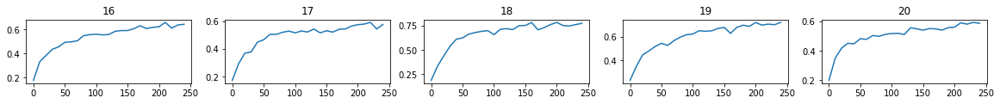

[TWITTER RESULT] r:5  f:5 => r:0.500 f:0.500
[0.8637487, 0.84582233, 0.8617996, 0.74920297, 0.7366401, 0.7647073, 0.68529266, 0.8863835, 0.81760913, 0.6659426]
   >> EXP 21 / 100 -- last fitness: 0.67 | last twit score: 0.50 | last loss: 0.0038


epoch: 250 - fit: 0.65 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.35it/s]


[TWITTER RESULT] r:6  f:5 => r:0.545 f:0.455
   >> EXP 22 / 100 -- last fitness: 0.65 | last twit score: 0.45 | last loss: 0.0038


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.07it/s]


[TWITTER RESULT] r:8  f:4 => r:0.667 f:0.333
   >> EXP 23 / 100 -- last fitness: 0.73 | last twit score: 0.33 | last loss: 0.0042


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.35it/s]


[TWITTER RESULT] r:9  f:3 => r:0.750 f:0.250
   >> EXP 24 / 100 -- last fitness: 0.76 | last twit score: 0.25 | last loss: 0.0047


epoch: 250 - fit: 0.66 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.34it/s]


[TWITTER RESULT] r:8  f:6 => r:0.571 f:0.429
   >> EXP 25 / 100 -- last fitness: 0.66 | last twit score: 0.43 | last loss: 0.0032


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.38it/s]


SHOWING FITNESS GRAPHS


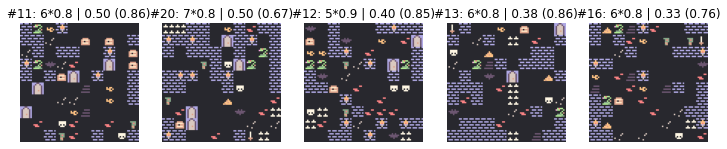

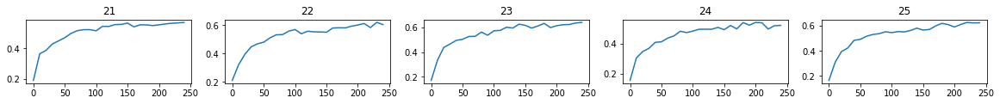

[TWITTER RESULT] r:7  f:4 => r:0.636 f:0.364
   >> EXP 26 / 100 -- last fitness: 0.74 | last twit score: 0.36 | last loss: 0.0072


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.41it/s]


[TWITTER RESULT] r:6  f:4 => r:0.600 f:0.400
   >> EXP 27 / 100 -- last fitness: 0.79 | last twit score: 0.40 | last loss: 0.0028


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.29it/s]


[TWITTER RESULT] r:5  f:3 => r:0.625 f:0.375
   >> EXP 28 / 100 -- last fitness: 0.79 | last twit score: 0.38 | last loss: 0.0030


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.05it/s]


[TWITTER RESULT] r:6  f:5 => r:0.545 f:0.455
   >> EXP 29 / 100 -- last fitness: 0.77 | last twit score: 0.45 | last loss: 0.0025


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.46it/s]


[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
   >> EXP 30 / 100 -- last fitness: 0.73 | last twit score: 0.27 | last loss: 0.0025


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.45it/s]


SHOWING FITNESS GRAPHS


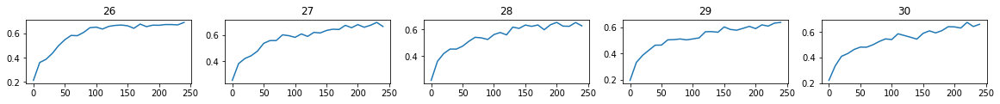

[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
[0.651988, 0.7268952, 0.75918484, 0.66359115, 0.7364428, 0.78657883, 0.79319876, 0.77131236, 0.7264486, 0.7974583]
   >> EXP 31 / 100 -- last fitness: 0.80 | last twit score: 0.12 | last loss: 0.0028


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.94it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 32 / 100 -- last fitness: 0.76 | last twit score: 0.33 | last loss: 0.0022


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.39it/s]


[TWITTER RESULT] r:7  f:4 => r:0.636 f:0.364
   >> EXP 33 / 100 -- last fitness: 0.70 | last twit score: 0.36 | last loss: 0.0019


epoch: 250 - fit: 0.66 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.98it/s]


[TWITTER RESULT] r:9  f:2 => r:0.818 f:0.182
   >> EXP 34 / 100 -- last fitness: 0.66 | last twit score: 0.18 | last loss: 0.0031


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.49it/s]


[TWITTER RESULT] r:1  f:5 => r:0.167 f:0.833
   >> EXP 35 / 100 -- last fitness: 0.79 | last twit score: 0.83 | last loss: 0.0030


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.45it/s]


SHOWING FITNESS GRAPHS


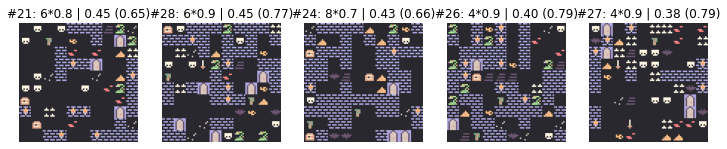

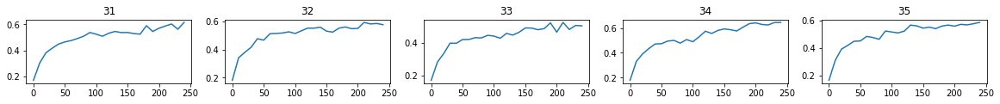

[TWITTER RESULT] r:8  f:4 => r:0.667 f:0.333
   >> EXP 36 / 100 -- last fitness: 0.68 | last twit score: 0.33 | last loss: 0.0024


epoch: 250 - fit: 0.72 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.36it/s]


[TWITTER RESULT] r:8  f:5 => r:0.615 f:0.385
   >> EXP 37 / 100 -- last fitness: 0.72 | last twit score: 0.38 | last loss: 0.0024


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.58it/s]


[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
   >> EXP 38 / 100 -- last fitness: 0.78 | last twit score: 0.27 | last loss: 0.0023


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.06it/s]


[TWITTER RESULT] r:3  f:5 => r:0.375 f:0.625
   >> EXP 39 / 100 -- last fitness: 0.75 | last twit score: 0.62 | last loss: 0.0023


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.47it/s]


[TWITTER RESULT] r:3  f:3 => r:0.500 f:0.500
   >> EXP 40 / 100 -- last fitness: 0.81 | last twit score: 0.50 | last loss: 0.0028


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.50it/s]


SHOWING FITNESS GRAPHS


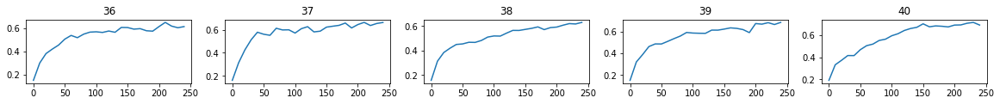

[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
[0.75822365, 0.7004602, 0.65641475, 0.7925209, 0.6814549, 0.72205234, 0.7838528, 0.74735165, 0.8109565, 0.83076125]
   >> EXP 41 / 100 -- last fitness: 0.83 | last twit score: 0.31 | last loss: 0.0028


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.49it/s]


[TWITTER RESULT] r:11  f:4 => r:0.733 f:0.267
   >> EXP 42 / 100 -- last fitness: 0.75 | last twit score: 0.27 | last loss: 0.0040


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.79it/s]


[TWITTER RESULT] r:11  f:2 => r:0.846 f:0.154
   >> EXP 43 / 100 -- last fitness: 0.73 | last twit score: 0.15 | last loss: 0.0031


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.40it/s]


[TWITTER RESULT] r:3  f:3 => r:0.500 f:0.500
   >> EXP 44 / 100 -- last fitness: 0.87 | last twit score: 0.50 | last loss: 0.0026


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.79it/s]


[TWITTER RESULT] r:3  f:4 => r:0.429 f:0.571
   >> EXP 45 / 100 -- last fitness: 0.88 | last twit score: 0.57 | last loss: 0.0025


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.77it/s]


SHOWING FITNESS GRAPHS


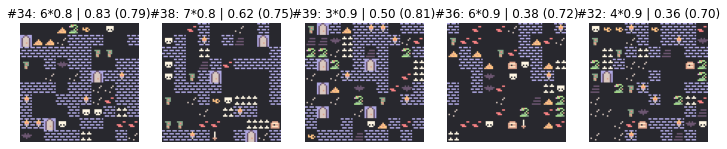

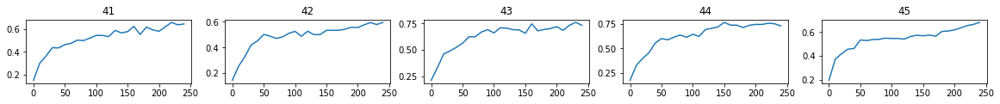

[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 46 / 100 -- last fitness: 0.81 | last twit score: 0.29 | last loss: 0.0021


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.19it/s]


[TWITTER RESULT] r:11  f:3 => r:0.786 f:0.214
   >> EXP 47 / 100 -- last fitness: 0.73 | last twit score: 0.21 | last loss: 0.0023


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.21it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 48 / 100 -- last fitness: 0.79 | last twit score: 0.22 | last loss: 0.0023


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.67it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 49 / 100 -- last fitness: 0.74 | last twit score: 0.31 | last loss: 0.0026


epoch: 250 - fit: 0.64 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.83it/s]


[TWITTER RESULT] r:7  f:4 => r:0.636 f:0.364
   >> EXP 50 / 100 -- last fitness: 0.64 | last twit score: 0.36 | last loss: 0.0047


epoch: 250 - fit: 0.72 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.56it/s]


SHOWING FITNESS GRAPHS


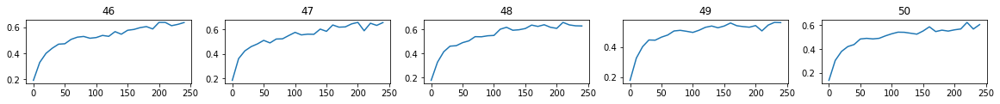

[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
[0.74655545, 0.73170274, 0.86765313, 0.88211524, 0.8139533, 0.7336273, 0.79245543, 0.74469304, 0.64083964, 0.7231163]
   >> EXP 51 / 100 -- last fitness: 0.72 | last twit score: 0.27 | last loss: 0.0023


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.42it/s]


[TWITTER RESULT] r:8  f:4 => r:0.667 f:0.333
   >> EXP 52 / 100 -- last fitness: 0.78 | last twit score: 0.33 | last loss: 0.0042


epoch: 250 - fit: 0.87 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.46it/s]


[TWITTER RESULT] r:-1  f:3 => r:0.0 f:1.0
   >> EXP 53 / 100 -- last fitness: 0.87 | last twit score: 1.00 | last loss: 0.0024


epoch: 250 - fit: 0.84 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.69it/s]


[TWITTER RESULT] r:8  f:5 => r:0.615 f:0.385
   >> EXP 54 / 100 -- last fitness: 0.84 | last twit score: 0.38 | last loss: 0.0021


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.61it/s]


[TWITTER RESULT] r:8  f:2 => r:0.800 f:0.200
   >> EXP 55 / 100 -- last fitness: 0.77 | last twit score: 0.20 | last loss: 0.0026


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.40it/s]


SHOWING FITNESS GRAPHS


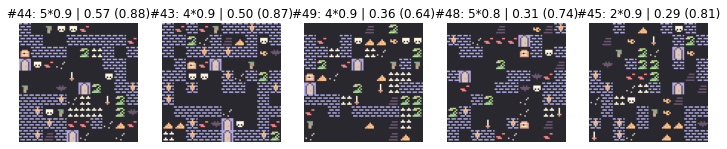

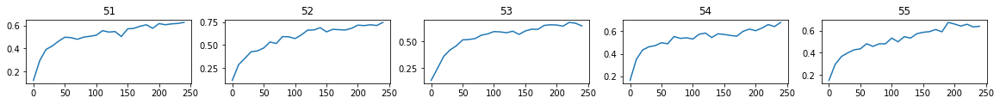

[TWITTER RESULT] r:7  f:4 => r:0.636 f:0.364
   >> EXP 56 / 100 -- last fitness: 0.81 | last twit score: 0.36 | last loss: 0.0025


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.39it/s]


[TWITTER RESULT] r:4  f:3 => r:0.571 f:0.429
   >> EXP 57 / 100 -- last fitness: 0.81 | last twit score: 0.43 | last loss: 0.0028


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.85it/s]


[TWITTER RESULT] r:6  f:4 => r:0.600 f:0.400
   >> EXP 58 / 100 -- last fitness: 0.83 | last twit score: 0.40 | last loss: 0.0036


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.99it/s]


[TWITTER RESULT] r:2  f:5 => r:0.286 f:0.714
   >> EXP 59 / 100 -- last fitness: 0.81 | last twit score: 0.71 | last loss: 0.0027


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.07it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 60 / 100 -- last fitness: 0.78 | last twit score: 0.31 | last loss: 0.0028


epoch: 250 - fit: 0.81 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.37it/s]


SHOWING FITNESS GRAPHS


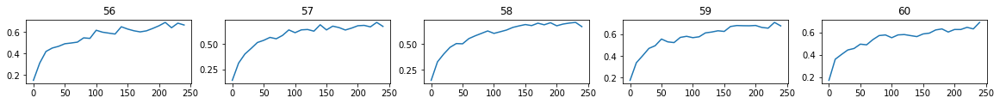

[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
[0.7770844, 0.8712327, 0.8367259, 0.76519454, 0.8094413, 0.80658937, 0.8342788, 0.8102788, 0.78433, 0.8117273]
   >> EXP 61 / 100 -- last fitness: 0.81 | last twit score: 0.33 | last loss: 0.0030


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.32it/s]


[TWITTER RESULT] r:10  f:3 => r:0.769 f:0.231
   >> EXP 62 / 100 -- last fitness: 0.69 | last twit score: 0.23 | last loss: 0.0026


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.74it/s]


[TWITTER RESULT] r:7  f:3 => r:0.700 f:0.300
   >> EXP 63 / 100 -- last fitness: 0.83 | last twit score: 0.30 | last loss: 0.0025


epoch: 250 - fit: 0.64 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.91it/s]


[TWITTER RESULT] r:5  f:4 => r:0.556 f:0.444
   >> EXP 64 / 100 -- last fitness: 0.64 | last twit score: 0.44 | last loss: 0.0027


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.37it/s]


[TWITTER RESULT] r:8  f:5 => r:0.615 f:0.385
   >> EXP 65 / 100 -- last fitness: 0.79 | last twit score: 0.38 | last loss: 0.0027


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.48it/s]


SHOWING FITNESS GRAPHS


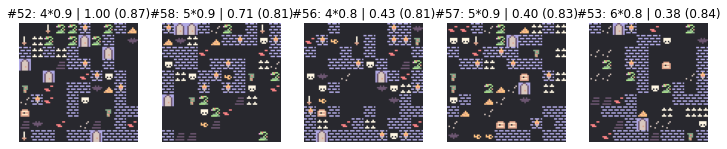

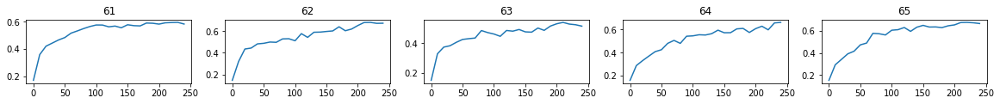

[TWITTER RESULT] r:11  f:5 => r:0.688 f:0.312
   >> EXP 66 / 100 -- last fitness: 0.78 | last twit score: 0.31 | last loss: 0.0032


epoch: 250 - fit: 0.88 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.22it/s]


[TWITTER RESULT] r:7  f:3 => r:0.700 f:0.300
   >> EXP 67 / 100 -- last fitness: 0.88 | last twit score: 0.30 | last loss: 0.0027


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.02it/s]


[TWITTER RESULT] r:3  f:4 => r:0.429 f:0.571
   >> EXP 68 / 100 -- last fitness: 0.83 | last twit score: 0.57 | last loss: 0.0024


epoch: 250 - fit: 0.69 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.05it/s]


[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
   >> EXP 69 / 100 -- last fitness: 0.69 | last twit score: 0.33 | last loss: 0.0030


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.04it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 70 / 100 -- last fitness: 0.80 | last twit score: 0.31 | last loss: 0.0023


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.27it/s]


SHOWING FITNESS GRAPHS


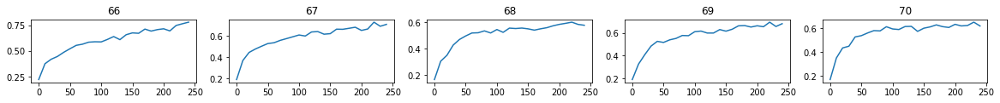

[TWITTER RESULT] r:5  f:3 => r:0.625 f:0.375
[0.6858764, 0.83096457, 0.6372946, 0.79429114, 0.7788969, 0.88335824, 0.8329594, 0.6897177, 0.7973502, 0.7439234]
   >> EXP 71 / 100 -- last fitness: 0.74 | last twit score: 0.38 | last loss: 0.0024


epoch: 250 - fit: 0.71 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.89it/s]


[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 72 / 100 -- last fitness: 0.71 | last twit score: 0.29 | last loss: 0.0022


epoch: 250 - fit: 0.63 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.40it/s]


[TWITTER RESULT] r:6  f:2 => r:0.750 f:0.250
   >> EXP 73 / 100 -- last fitness: 0.63 | last twit score: 0.25 | last loss: 0.0024


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.00it/s]


[TWITTER RESULT] r:11  f:4 => r:0.733 f:0.267
   >> EXP 74 / 100 -- last fitness: 0.77 | last twit score: 0.27 | last loss: 0.0032


epoch: 250 - fit: 0.89 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.32it/s]


[TWITTER RESULT] r:6  f:2 => r:0.750 f:0.250
   >> EXP 75 / 100 -- last fitness: 0.89 | last twit score: 0.25 | last loss: 0.0024


epoch: 250 - fit: 0.91 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.60it/s]


SHOWING FITNESS GRAPHS


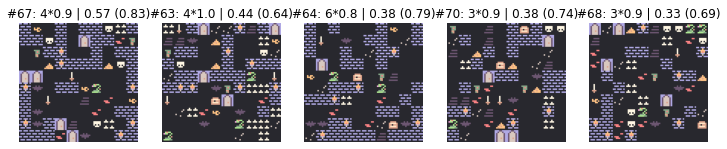

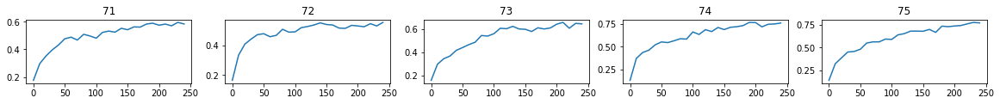

[TWITTER RESULT] r:6  f:4 => r:0.600 f:0.400
   >> EXP 76 / 100 -- last fitness: 0.91 | last twit score: 0.40 | last loss: 0.0025


epoch: 250 - fit: 0.75 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.59it/s]


[TWITTER RESULT] r:5  f:4 => r:0.556 f:0.444
   >> EXP 77 / 100 -- last fitness: 0.75 | last twit score: 0.44 | last loss: 0.0039


epoch: 250 - fit: 0.74 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.36it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 78 / 100 -- last fitness: 0.74 | last twit score: 0.31 | last loss: 0.0038


epoch: 250 - fit: 0.82 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.15it/s]


[TWITTER RESULT] r:7  f:5 => r:0.583 f:0.417
   >> EXP 79 / 100 -- last fitness: 0.82 | last twit score: 0.42 | last loss: 0.0041


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.05it/s]


[TWITTER RESULT] r:2  f:4 => r:0.333 f:0.667
   >> EXP 80 / 100 -- last fitness: 0.76 | last twit score: 0.67 | last loss: 0.0037


epoch: 250 - fit: 0.90 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.46it/s]


SHOWING FITNESS GRAPHS


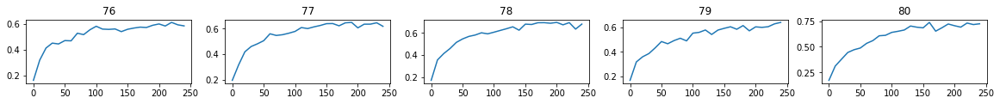

[TWITTER RESULT] r:6  f:3 => r:0.667 f:0.333
[0.7081984, 0.6293719, 0.76654303, 0.88917315, 0.9085895, 0.7465787, 0.7412863, 0.82057476, 0.75935626, 0.8957709]
   >> EXP 81 / 100 -- last fitness: 0.90 | last twit score: 0.33 | last loss: 0.0036


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.32it/s]


[TWITTER RESULT] r:4  f:3 => r:0.571 f:0.429
   >> EXP 82 / 100 -- last fitness: 0.68 | last twit score: 0.43 | last loss: 0.0055


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.32it/s]


[TWITTER RESULT] r:6  f:5 => r:0.545 f:0.455
   >> EXP 83 / 100 -- last fitness: 0.79 | last twit score: 0.45 | last loss: 0.0041


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.16it/s]


[TWITTER RESULT] r:9  f:5 => r:0.643 f:0.357
   >> EXP 84 / 100 -- last fitness: 0.80 | last twit score: 0.36 | last loss: 0.0037


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.94it/s]


[TWITTER RESULT] r:8  f:6 => r:0.571 f:0.429
   >> EXP 85 / 100 -- last fitness: 0.80 | last twit score: 0.43 | last loss: 0.0035


epoch: 250 - fit: 0.79 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.55it/s]


SHOWING FITNESS GRAPHS


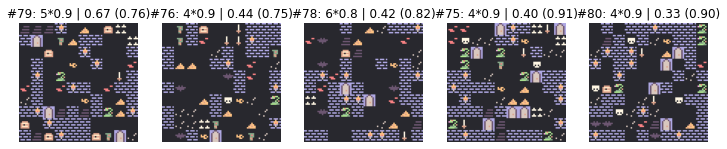

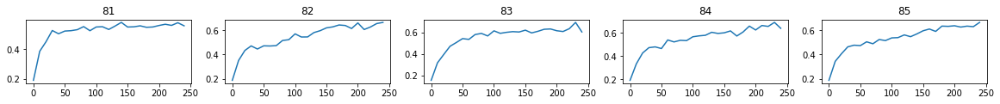

[TWITTER RESULT] r:7  f:3 => r:0.700 f:0.300
   >> EXP 86 / 100 -- last fitness: 0.79 | last twit score: 0.30 | last loss: 0.0031


epoch: 250 - fit: 0.77 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 29.98it/s]


[TWITTER RESULT] r:11  f:3 => r:0.786 f:0.214
   >> EXP 87 / 100 -- last fitness: 0.77 | last twit score: 0.21 | last loss: 0.0034


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.43it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 88 / 100 -- last fitness: 0.73 | last twit score: 0.22 | last loss: 0.0031


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.13it/s]


[TWITTER RESULT] r:4  f:5 => r:0.444 f:0.556
   >> EXP 89 / 100 -- last fitness: 0.73 | last twit score: 0.56 | last loss: 0.0033


epoch: 250 - fit: 0.80 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.45it/s]


[TWITTER RESULT] r:10  f:5 => r:0.667 f:0.333
   >> EXP 90 / 100 -- last fitness: 0.80 | last twit score: 0.33 | last loss: 0.0041


epoch: 250 - fit: 0.78 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.00it/s]


SHOWING FITNESS GRAPHS


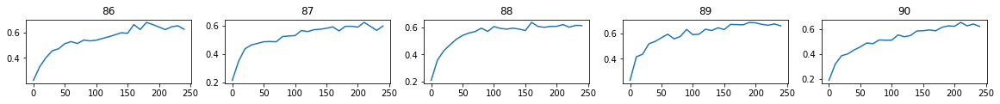

[TWITTER RESULT] r:6  f:5 => r:0.545 f:0.455
[0.67509943, 0.7904788, 0.80011237, 0.8025247, 0.785648, 0.7738838, 0.7286166, 0.72669166, 0.7964201, 0.7837065]
   >> EXP 91 / 100 -- last fitness: 0.78 | last twit score: 0.45 | last loss: 0.0035


epoch: 250 - fit: 0.68 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.42it/s]


[TWITTER RESULT] r:1  f:3 => r:0.250 f:0.750
   >> EXP 92 / 100 -- last fitness: 0.68 | last twit score: 0.75 | last loss: 0.0034


epoch: 250 - fit: 0.83 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.45it/s]


[TWITTER RESULT] r:7  f:1 => r:0.875 f:0.125
   >> EXP 93 / 100 -- last fitness: 0.83 | last twit score: 0.12 | last loss: 0.0043


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.53it/s]


[TWITTER RESULT] r:7  f:5 => r:0.583 f:0.417
   >> EXP 94 / 100 -- last fitness: 0.76 | last twit score: 0.42 | last loss: 0.0039


epoch: 250 - fit: 0.76 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 32.27it/s]


[TWITTER RESULT] r:9  f:4 => r:0.692 f:0.308
   >> EXP 95 / 100 -- last fitness: 0.76 | last twit score: 0.31 | last loss: 0.0040


epoch: 250 - fit: 0.70 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.86it/s]


SHOWING FITNESS GRAPHS


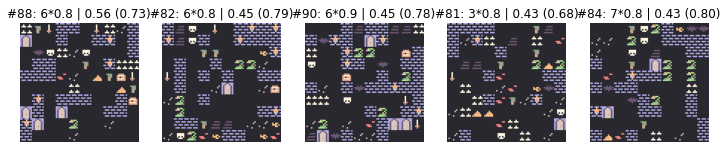

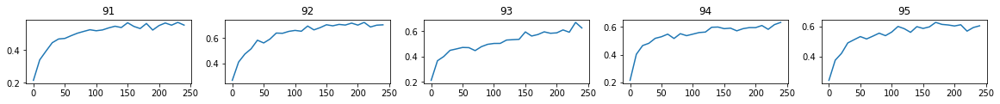

[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 96 / 100 -- last fitness: 0.70 | last twit score: 0.29 | last loss: 0.0036


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.69it/s]


[TWITTER RESULT] r:5  f:4 => r:0.556 f:0.444
   >> EXP 97 / 100 -- last fitness: 0.73 | last twit score: 0.44 | last loss: 0.0039


epoch: 250 - fit: 0.67 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.00it/s]


[TWITTER RESULT] r:7  f:2 => r:0.778 f:0.222
   >> EXP 98 / 100 -- last fitness: 0.67 | last twit score: 0.22 | last loss: 0.0043


epoch: 250 - fit: 0.71 - N: 10.00: 100%|██████████| 250/250 [00:07<00:00, 31.43it/s]


[TWITTER RESULT] r:5  f:2 => r:0.714 f:0.286
   >> EXP 99 / 100 -- last fitness: 0.71 | last twit score: 0.29 | last loss: 0.0039


epoch: 250 - fit: 0.94 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 31.19it/s]


[TWITTER RESULT] r:6  f:1 => r:0.857 f:0.143
   >> EXP 100 / 100 -- last fitness: 0.94 | last twit score: 0.14 | last loss: 0.0046


epoch: 250 - fit: 0.73 - N: 10.00: 100%|██████████| 250/250 [00:08<00:00, 30.25it/s]


SHOWING FITNESS GRAPHS


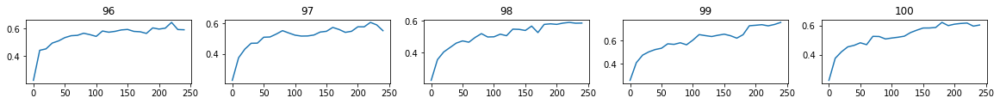

[TWITTER RESULT] r:8  f:3 => r:0.727 f:0.273
[0.6774444, 0.83095396, 0.75528026, 0.7594522, 0.7033915, 0.7283966, 0.67303944, 0.7130369, 0.9375042, 0.72969365]


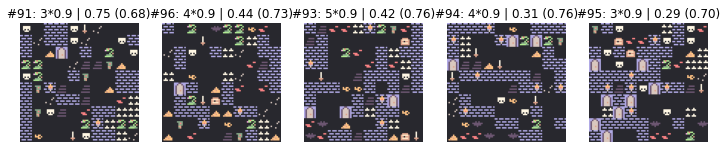

In [151]:
DEBUG = False

names = ["zelda","pokemon","amongus","pacman","dungeon"]

mu_acc = {}
mu_loss = {}
best_twit_map = {}
best_evo_fit = {}

SAMP_WEIGHT = 0.95           #P vs. Q WEIGHT FOR TPKL-DIV
TWIT_MULT = 1              #TWITTER SCORE MULTIPLIER FOR THE TPKL-DIV
TWIT_OFFSET = 0            #ADD TO THE SCORE TO MAKE MORE POSITIVE
TWIT_VAR = 3              #ADD TO THE REAL SCORE TO ADD VARIANCE


TRIALS = 1
EVO_EPOCHS = 250
ADD_EVO_EPOCHS = 50  #how much to increase the iterations by to get a good score
NN_EPOCHS = 10
EXP_ITERS = 100    #simulate 100 twitter polls
PRE_TRAIN_NN_EPOCHS = 100

POP_SIZE = 32
MUT_RATE = 0.03
MU_VALUE = 0.8
RANDOM_INIT = True
RANK_TP = True
BINARY = True

TRAIN_MAPS = USER_LEVELS_10

print(f" -- trials = {TRIALS}, evo epochs = {EVO_EPOCHS}, nn epochs = {NN_EPOCHS}, popsize = {POP_SIZE} --")

for name in names:
    TILE = name
    tt = TILESETS[TILE]
    print(f"> {TILE} tileset")

    mu_acc[TILE] = {}
    mu_loss[TILE] = {}
    best_evo_fit[TILE] = {}
    best_twit_map[TILE] = {}

    #get the twitter scores for the real maps
    all_real_scores = [round(twitterFit(m)*TWIT_MULT,2) for m in TRAIN_MAPS[TILE]]

    #repeat the experiment for the tileset X times
    for trial in range(TRIALS):
        print(f" ------- TRIAL #{trial+1} --------")

        #define the evalulator fitness bot
        nn_fitnessBot = FitnessCNN(tt,('binary' if BINARY else 'whole'))

        #pretrain for a bit
        prereal_maps = TRAIN_MAPS[TILE]
        prefake_maps = utils.makeRandomAscMaps(len(prereal_maps),10)

        # use twitter score differences (raw or percentage)
        rs = []
        fs = []
        for i in range(len(prereal_maps)):
            trs, tfs = twitterScore(prereal_maps[i],prefake_maps[i],BINARY)
            rs.append(trs)
            fs.append(tfs)

        print(" *** PRETRAINING FITNESS CNN ***")
        loss, acc = nn_fitnessBot.train(PRE_TRAIN_NN_EPOCHS,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})

        #SETUP STAT DATA
        mu_acc[TILE][trial] = []
        mu_loss[TILE][trial] = []
        best_evo_fit[TILE][trial] = []
        best_twit_map[TILE][trial] = {}


        #train the evaluator
        real_s = 0
        fake_s = 0
        last_loss = 0
        best_fit = 0

        #training data
        train_twit_maps = {'real':[], 'fake':[]}
        train_twit_scores = {'real':[], 'fake':[]}

        #stats
        evobot_fit = []
        evobot_epo = []
        pre_twit_maps = []
        raw_twit_votes = []
        pre_twit_scores = []
        pre_real_scores = []

        #####    RUN THE ENTIRE EXPERIMENT PIPELINE   #####

        for exp_i in range(EXP_ITERS):

            print(f"   >> EXP {exp_i+1} / {EXP_ITERS} -- last fitness: {best_fit:.2f} | last twit score: {fake_s:.2f} | last loss: {last_loss:.4f}")

            ###### EVOLVER STEP ######

            #define the bots
            straightBot = StraightBotTP(tt,POP_SIZE,MUT_RATE,EVO_PATT_2D[TILE],rank_tp_sel=RANK_TP,mu=MU_VALUE)

            #set the fitness for the evolver (straightbot)
            straightBot.user_fun = nn_fitnessBot.eval_map_population

            #train the evolver bot
            tot_evo_epochs = EVO_EPOCHS
#                 use_blank_map = (True if exp_i % 2 == 0 else False)
            straightBot.train(EVO_EPOCHS,RANDOM_INIT,False)

            #continue training if fitness still negative and able to improve
            iter_ct = 0
            while (straightBot.high_pop_fit() <= (0.5 if BINARY else 0)) and iter_ct < 10:
                straightBot.train(ADD_EVO_EPOCHS,False)
                tot_evo_epochs += ADD_EVO_EPOCHS
                iter_ct+=1


            #add fitness change graph
            evobot_fit.append(straightBot.changeFit)
            evobot_epo.append(range(tot_evo_epochs))

            #save the highest fitness
            best_evo_fit[TILE][trial].append(straightBot.high_pop_fit())


            #show the fitness change every 5th iteration
            if (exp_i+1)%5 == 0:
                print("SHOWING FITNESS GRAPHS")
                showFitnessGraphs2(evobot_fit,evobot_epo,range(exp_i-3,exp_i+2))
                evobot_fit = []
                evobot_epo = []


            #####   TWITTER STEP   #####


            #take the best sample from the population
            twitter_map = straightBot.best_map()
            twit_vote = round(twitterFit(twitter_map)*TWIT_MULT)

            #"evaluate" the map through twitter votes
            real_map = random.choice(TRAIN_MAPS[TILE])
            real_s, fake_s = twitterScore(real_map,twitter_map, BINARY)

            # > train on different sets 
#                 train_twit_maps = {"real":[], "fake":[]}
#                 train_twit_scores = {"real":[], "fake":[]}

#                 # (normal pair)
#                 train_twit_maps['real'].append(real_map)
#                 train_twit_maps['fake'].append(twitter_map)
#                 train_twit_scores['real'].append(real_s)
#                 train_twit_scores['fake'].append(fake_s)

#                 # (user to user)
#                 [realA_map, realB_map] = user_maps[TILE][random.choices(range(len(user_maps[TILE])),k=2)]
#                 realA_s, realB_s = twitterScore(realA_map,realB_map,BINARY)

#                 # (gen to gen)
#                 [genA_map, genB_map] = straightBot.population[random.choices(range(len(straightBot.population)),k=2)]
#                 genA_s, genB_s = twitterScore(genA_map, genB_map,BINARY)

#                 train_twit_maps['real'].append(realA_map)
#                 train_twit_scores['real'].append(realA_s)
#                 train_twit_maps['real'].append(realB_map)
#                 train_twit_scores['real'].append(realB_s)
#                 train_twit_maps['fake'].append(genA_map)
#                 train_twit_scores['fake'].append(genA_s)
#                 train_twit_maps['fake'].append(genB_map)
#                 train_twit_scores['fake'].append(genB_s)


            #  > train on new and old
            train_twit_maps['real'].append(real_map)
            train_twit_maps['fake'].append(twitter_map)
            train_twit_scores['real'].append(real_s)
            train_twit_scores['fake'].append(fake_s)


            #  > train only on new
#                 train_twit_maps = {'real':[real_map], 'fake':[twitter_map]}
#                 train_twit_scores = {'real':[real_s], 'fake':[fake_s]}

            #train the evaluator fitness bot on the scores
            loss, acc = nn_fitnessBot.train(NN_EPOCHS,train_twit_maps,train_twit_scores)


            #show the best 5 twitter maps every 10th iteration
            pre_twit_maps.append(twitter_map)
            pre_real_scores.append(real_s)
            raw_twit_votes.append(twit_vote)
            pre_twit_scores.append(fake_s)

            if (exp_i+1)%10 == 0:
                best5 = np.argsort(-np.array(pre_twit_scores))[:5]
                rec_best_evo_fit = best_evo_fit[TILE][trial][-10:]
                print(rec_best_evo_fit)
                if BINARY:
                    ind = [f"#{(x+(exp_i-8))}: {int(raw_twit_votes[x])}*{utils.entropy(pre_twit_maps[x]):.1f} | {pre_twit_scores[x]:.2f} ({rec_best_evo_fit[x]:.2f})" for x in best5]
                else:
                    ind = [f"#{(x+(exp_i-8))}: {int(raw_twit_votes[x])}*{utils.entropy(pre_twit_maps[x]):.1f} | {int(pre_twit_scores[x])} ({int(rec_best_evo_fit[x])})" for x in best5]
                best5_maps = np.array(pre_twit_maps)[best5]
                utils.showMultiMaps(best5_maps,TILE,'',ind)

                #show the map distribution as well
                #cur_real_score_pred = nn_fitnessBot.eval_map_population(TRAIN_MAPS[TILE])
                #cur_fake_score_pred = nn_fitnessBot.eval_map_population(pre_twit_maps)
                #showScoreDist(pre_real_scores,pre_twit_scores,cur_real_score_pred,cur_fake_score_pred,BINARY)

                pre_twit_maps = []
                pre_twit_scores = []
                pre_real_scores = []
                raw_twit_votes = []


            #GET THE STAT DATA
            mu_loss[TILE][trial].append(loss)
            mu_acc[TILE][trial].append(acc)

            last_loss = loss[-1]
            best_fit = best_evo_fit[TILE][trial][-1]




            #save current map final twitter map and score if applicable
            entropy_score = utils.entropy(twitter_map) #get the entropy for shits and giggles

            #get checks
            no_best = ('twitter_score' not in best_twit_map[TILE][trial])
            if not no_best:
                better_twit_score = (twit_vote > best_twit_map[TILE][trial]['twitter_score'])
                better_entropy = (entropy_score >= best_twit_map[TILE][trial]['entropy'])

            #replace current map
            if no_best or (better_twit_score and better_entropy):
                best_twit_map[TILE][trial]['map'] = twitter_map.copy()
                best_twit_map[TILE][trial]['twitter_score'] = twit_vote
                best_twit_map[TILE][trial]['evo_score'] = best_fit
                best_twit_map[TILE][trial]['index'] = exp_i
                best_twit_map[TILE][trial]['entropy'] = entropy_score


        #export the CNN
        nn_fitnessBot.exportModel("POST-cnn_models",f"{TILE}-{trial}-[{date.today().strftime('%b-%d-%y')}]")
                    

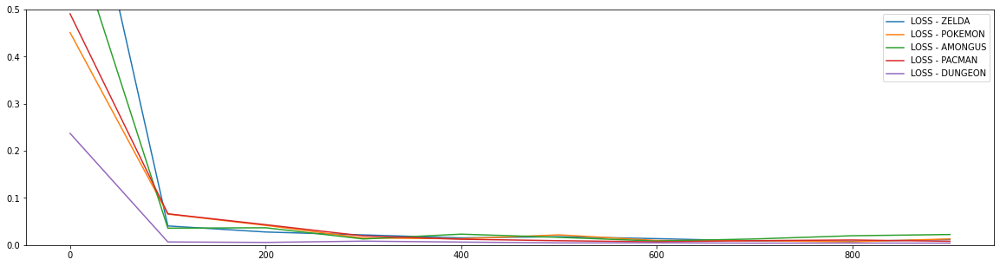

In [152]:
#show the loss across all tilesets
plt.figure(figsize=(20,5))
for t in names:
    TILE = t
    l = mu_loss[TILE][0]
    l2 = np.array(l).flatten()
    x = range(len(l2))
    plt.plot(x[::100],l2[::100],label=f"LOSS - {t.upper()}")
    if BINARY:
        plt.ylim(0,0.5)
    else:
        plt.ylim(0,200)
plt.legend()
plt.show()

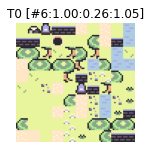

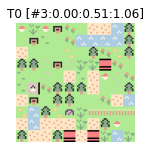

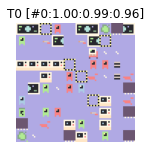

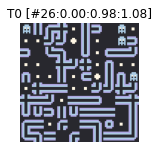

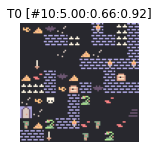

In [150]:
for t in names:
    TILE = t
    mapSet = []
    infoTxt = []
    for tr in range(TRIALS):
        twee =  best_twit_map[t][tr]
        mapSet.append(twee['map'])
        infoTxt.append(f"T{tr} [#{int(twee['index'])}:{twee['twitter_score']:.2f}:{twee['evo_score']:.2f}:{twee['entropy']:.2f}]")
    utils.showMultiMaps(mapSet,t,'',infoTxt)

---

### Direct comparison - OG Method vs. Post method

In [43]:
# external files
import level_gen_sql
import pair_gen_sql
import pair_EXT_gen_sql
import aesthetic_bot
import TPKLDiv
import utils

DEBUG = False

In [44]:
#1 import the pairings
MIN_VOTE_REQ = 3

# 1a. get all of the pairings saved to the database
all_pairIDs = pair_gen_sql.getAllPairIDs()
pairDataSet = {}

for pid in all_pairIDs:
    vr = pair_gen_sql.pair2Rating(pid)

    # pair not found
    if vr == None:
        print(f"** No valid pairing found for ID [ {pid} ] **")
        continue

    total = (abs(vr['real']['votes']) + abs(vr['fake']['votes']))
    # not enough votes
    if total < MIN_VOTE_REQ:
        print(f"** Not enough votes for ID [ {pid} ] ({total} < {MIN_VOTE_REQ})")        
        continue
    pairDataSet[str(pid)] = vr
    
# 1b. get all of the pairings saved to the database (EXT)
all_pairEXTIDs = pair_EXT_gen_sql.getAllPairIDs()
for pid in all_pairEXTIDs:
    vr = pair_EXT_gen_sql.pair2Rating(pid)

    # pair not found
    if vr == None:
        print(f"** No valid pairing found in [EXT] for ID [ {pid} ] **")
        continue

    total = (abs(vr['real']['votes']) + abs(vr['fake']['votes']))
    # not enough votes
    if total < MIN_VOTE_REQ:
        print(f"** Not enough votes for ID [ {pid} ] ({total} < {MIN_VOTE_REQ})")
        continue
    pairDataSet[f"{pid}_ext"] = vr

** Not enough votes for ID [ 53 ] (1 < 3)
** Not enough votes for ID [ 55 ] (1 < 3)
** Not enough votes for ID [ 56 ] (1 < 3)
** Not enough votes for ID [ 57 ] (1 < 3)
** Not enough votes for ID [ 58 ] (0 < 3)
** Not enough votes for ID [ 70 ] (1 < 3)
** Not enough votes for ID [ 71 ] (1 < 3)
** Not enough votes for ID [ 72 ] (0 < 3)
** Not enough votes for ID [ 74 ] (0 < 3)
** Not enough votes for ID [ 76 ] (1 < 3)
** Not enough votes for ID [ 77 ] (0 < 3)
** Not enough votes for ID [ 78 ] (0 < 3)
** Not enough votes for ID [ 79 ] (0 < 3)
** Not enough votes for ID [ 80 ] (0 < 3)
** Not enough votes for ID [ 81 ] (1 < 3)
** Not enough votes for ID [ 82 ] (0 < 3)
** Not enough votes for ID [ 83 ] (0 < 3)
** Not enough votes for ID [ 84 ] (0 < 3)
** Not enough votes for ID [ 85 ] (1 < 3)
** Not enough votes for ID [ 86 ] (0 < 3)
** Not enough votes for ID [ 87 ] (1 < 3)
** Not enough votes for ID [ 90 ] (0 < 3)
** Not enough votes for ID [ 91 ] (0 < 3)
** Not enough votes for ID [ 92 ] 

In [45]:

# separate by tileset and size of map
POLL_DATA = {}
EXTRA_SET = {}
for TILE in TILENAMES:
    POLL_DATA[TILE] = []
    EXTRA_SET[TILE] = []
#     POLL_DATA[TILE] = {"real_maps":[],"real_scores":[],"fake_maps":[],"fake_scores":[]}
    

    
for k,v in sorted(pairDataSet.items()):
    t = v['tileset']
    d = {}
    
    #add maps
    d['real_map'] = v['real']['level']
    d['fake_map'] = v['fake']['level']
    
    #resize for the post CNN
    rm = d['real_map']
#     if rm.shape[0] > MAP_SIZE:
#         d['real_map'] = shrinkMap(rm,MAP_SIZE)
#     elif rm.shape[0] < MAP_SIZE:
    if rm.shape[0] != MAP_SIZE:
        d['real_map'] = []
        rm = []
        #continue
        
    fm = d['fake_map']
#     if fm.shape[0] > MAP_SIZE:
#         d['fake_map'] = shrinkMap(fm,MAP_SIZE)
#     elif fm.shape[0] < MAP_SIZE:
    if fm.shape[0] != MAP_SIZE:
        d['fake_map'] = []
        fm = []
        #continue
    
    #add scores
    total = max((abs(v['real']['votes']) + abs(v['fake']['votes'])), 1)
    real_score = v['real']['votes'] / total
    fake_score = v['fake']['votes'] / total
    
    d['real_score'] = real_score
    d['fake_score'] = fake_score
    
    if len(rm) > 0:
        d['real_score'] = real_score
    else:
        d['real_score'] = None
    if len(fm) > 0:
        d['fake_score'] = fake_score
    else:
        d['fake_score'] = None
    
    
    if len(fm) > 0 or len(rm) > 0:
        POLL_DATA[t].append(d)
    #if len(fm) > 0 and len(rm) > 0:                 
        
    #else:
#     if len(fm) == 0 or len(rm) == 0:      
#         if len(fm) > 0:
#             EXTRA_SET[t].append({'map':shrinkMap(fm,MAP_SIZE),'score':fake_score})
#         elif len(rm) > 0:
#             EXTRA_SET[t].append({'map':shrinkMap(rm,MAP_SIZE),'score':real_score})
    
print(f"*** MAP SIZE = {MAP_SIZE} ***")
    
print("-- TRAIN --")
for k,v in POLL_DATA.items():
    print(f"{k}: {len(v)}")
    
print("\n-- EXTRA --")
for k,v in EXTRA_SET.items():
    print(f"{k}: {len(v)}")

*** MAP SIZE = 10 ***
-- TRAIN --
zelda: 96
pokemon: 96
pacman: 46
amongus: 23
dungeon: 76

-- EXTRA --
zelda: 0
pokemon: 0
pacman: 0
amongus: 0
dungeon: 0


In [25]:
#teach the original bot from scratch
OG_AESTHBOT_CNN = {}
for t in TILENAMES:
    botCNN = aesthetic_bot.FitnessCNN(TILESETS[t],"binary")
    OG_AESTHBOT_CNN[t] = botCNN
    
#setup the new bot from scratch as well
POST_AESTHBOT_CNN = {}
for t in TILENAMES:
    botCNN = FitnessCNN(TILESETS[t],"binary",MAP_SIZE)
    POST_AESTHBOT_CNN[t] = botCNN

In [26]:
#pre-train both against real and randomness for fairness
for TILE in TILENAMES:
    print(f"> {TILE}")
    prereal_maps = [shrinkMap(m,MAP_SIZE) for m in PROFILE_LEVELS[TILE] if m.shape[0] >= MAP_SIZE]
    prefake_maps = utils.makeRandomAscMaps(len(prereal_maps),MAP_SIZE)

    # assume the real will always win against the random
    rs = []
    fs = []
    for i in range(len(prereal_maps)):
        rs.append(1.0)  
        fs.append(0.0)

    print(" *** PRETRAINING OG FITNESS CNN ***")
    OG_AESTHBOT_CNN[TILE].train(50,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})
    print(" *** PRETRAINING POST FITNESS CNN ***")
    POST_AESTHBOT_CNN[TILE].train(50,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})

> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:72 / # fake:72 => 72
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:108 / # fake:108 => 108
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:72 / # fake:72 => 72
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:81 / # fake:81 => 81
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:72 / # fake:72 => 72
 *** PRETRAINING POST FITNESS CNN ***


In [27]:
# reserve a number for the testing
TEST_SET = {}
for TILE in TILENAMES:
    TEST_SET[TILE] = {'maps':[],'scores':[]}
    TEST_NUM = math.ceil(len(POLL_DATA[TILE])*0.1)
    print(f"{TILE} -> {TEST_NUM}")
    
    for i in range(TEST_NUM):
        #pull from extra set first
#         if len(EXTRA_SET[TILE]) > 0:
#             ei = EXTRA_SET[TILE].pop(random.choice(range(len(EXTRA_SET[TILE]))))
#             TEST_SET[TILE]['maps'].append(ei['map'])
#             TEST_SET[TILE]['scores'].append(ei['score'])
        #pull from random data point
        #elif len(POLL_DATA[TILE]) > 0:
        if len(POLL_DATA[TILE]) > 0:
            ti = POLL_DATA[TILE].pop(random.choice(range(len(POLL_DATA[TILE]))))
            if ti['real_score']:
                TEST_SET[TILE]['maps'].append(ti['real_map'])
                TEST_SET[TILE]['scores'].append(ti['real_score'])
            if ti['fake_score']:
                TEST_SET[TILE]['maps'].append(ti['fake_map'])
                TEST_SET[TILE]['scores'].append(ti['fake_score'])


zelda -> 6
pokemon -> 5
pacman -> 5
amongus -> 4
dungeon -> 4


In [28]:
#train on real results from twitter pollings
UPDATE_EPOCHS = 10

for TILE in TILENAMES:
    
    #concatenate new data every iteration
    train_set_maps = {'real':[],'fake':[]}
    train_set_scores = {'real':[],'fake':[]}
    
    #train on each additional datapoint added 
    with tqdm(total=len(POLL_DATA[TILE])) as tbar:
        tbar.set_description(f"-- Training on {TILE} tileset! --")
        for d in POLL_DATA[TILE]:
            if len(d['real_map']) > 0:
                train_set_maps['real'].append(d['real_map'])
                train_set_scores['real'].append(d['real_score'])
            if len(d['fake_map']) > 0:
                train_set_maps['fake'].append(d['fake_map'])
                train_set_scores['fake'].append(d['fake_score'])
                
            if len(train_set_maps['real']) == 0 or len(train_set_maps['fake']) == 0:
                continue
                

            #train both models on the updated data
            OG_AESTHBOT_CNN[TILE].train(UPDATE_EPOCHS,train_set_maps,train_set_scores)
            POST_AESTHBOT_CNN[TILE].train(UPDATE_EPOCHS,train_set_maps,train_set_scores)
            
            tbar.update(1)

-- Training on zelda tileset! --:   0%|          | 0/48 [00:00<?, ?it/s]

# real:9 / # fake:9 => 9


-- Training on zelda tileset! --:   2%|▏         | 1/48 [00:00<00:30,  1.56it/s]

# real:9 / # fake:18 => 18


-- Training on zelda tileset! --:   6%|▋         | 3/48 [00:01<00:16,  2.66it/s]

# real:9 / # fake:27 => 27
# real:9 / # fake:36 => 36


-- Training on zelda tileset! --:   8%|▊         | 4/48 [00:01<00:13,  3.32it/s]

# real:18 / # fake:45 => 45


-- Training on zelda tileset! --:  10%|█         | 5/48 [00:01<00:11,  3.73it/s]

# real:18 / # fake:54 => 54


-- Training on zelda tileset! --:  12%|█▎        | 6/48 [00:01<00:10,  3.99it/s]

# real:18 / # fake:63 => 63


-- Training on zelda tileset! --:  17%|█▋        | 8/48 [00:02<00:09,  4.31it/s]

# real:18 / # fake:72 => 72
# real:18 / # fake:81 => 81


-- Training on zelda tileset! --:  19%|█▉        | 9/48 [00:02<00:09,  4.07it/s]

# real:18 / # fake:90 => 90


-- Training on zelda tileset! --:  21%|██        | 10/48 [00:02<00:09,  3.90it/s]

# real:18 / # fake:99 => 99


-- Training on zelda tileset! --:  23%|██▎       | 11/48 [00:03<00:09,  3.78it/s]

# real:18 / # fake:108 => 108


-- Training on zelda tileset! --:  25%|██▌       | 12/48 [00:03<00:10,  3.57it/s]

# real:18 / # fake:117 => 117


-- Training on zelda tileset! --:  27%|██▋       | 13/48 [00:03<00:10,  3.36it/s]

# real:18 / # fake:126 => 126


-- Training on zelda tileset! --:  29%|██▉       | 14/48 [00:04<00:11,  2.95it/s]

# real:18 / # fake:135 => 135


-- Training on zelda tileset! --:  31%|███▏      | 15/48 [00:04<00:11,  2.85it/s]

# real:18 / # fake:144 => 144


-- Training on zelda tileset! --:  33%|███▎      | 16/48 [00:04<00:11,  2.91it/s]

# real:18 / # fake:153 => 153


-- Training on zelda tileset! --:  35%|███▌      | 17/48 [00:05<00:11,  2.66it/s]

# real:18 / # fake:162 => 162


-- Training on zelda tileset! --:  38%|███▊      | 18/48 [00:05<00:11,  2.54it/s]

# real:18 / # fake:171 => 171


-- Training on zelda tileset! --:  40%|███▉      | 19/48 [00:06<00:12,  2.42it/s]

# real:18 / # fake:180 => 180


-- Training on zelda tileset! --:  42%|████▏     | 20/48 [00:06<00:11,  2.37it/s]

# real:18 / # fake:189 => 189


-- Training on zelda tileset! --:  44%|████▍     | 21/48 [00:07<00:11,  2.31it/s]

# real:18 / # fake:198 => 198


-- Training on zelda tileset! --:  46%|████▌     | 22/48 [00:07<00:11,  2.25it/s]

# real:18 / # fake:207 => 207


-- Training on zelda tileset! --:  48%|████▊     | 23/48 [00:08<00:11,  2.19it/s]

# real:18 / # fake:216 => 216


-- Training on zelda tileset! --:  50%|█████     | 24/48 [00:08<00:10,  2.25it/s]

# real:18 / # fake:225 => 225


-- Training on zelda tileset! --:  52%|█████▏    | 25/48 [00:09<00:10,  2.13it/s]

# real:18 / # fake:234 => 234


-- Training on zelda tileset! --:  54%|█████▍    | 26/48 [00:09<00:10,  2.02it/s]

# real:18 / # fake:243 => 243


-- Training on zelda tileset! --:  56%|█████▋    | 27/48 [00:10<00:10,  1.95it/s]

# real:18 / # fake:252 => 252


-- Training on zelda tileset! --:  58%|█████▊    | 28/48 [00:10<00:10,  1.88it/s]

# real:27 / # fake:252 => 252


-- Training on zelda tileset! --:  60%|██████    | 29/48 [00:11<00:10,  1.82it/s]

# real:27 / # fake:261 => 261


-- Training on zelda tileset! --:  62%|██████▎   | 30/48 [00:12<00:10,  1.77it/s]

# real:27 / # fake:270 => 270


-- Training on zelda tileset! --:  65%|██████▍   | 31/48 [00:12<00:09,  1.71it/s]

# real:27 / # fake:279 => 279


-- Training on zelda tileset! --:  67%|██████▋   | 32/48 [00:13<00:09,  1.64it/s]

# real:27 / # fake:288 => 288


-- Training on zelda tileset! --:  69%|██████▉   | 33/48 [00:13<00:08,  1.70it/s]

# real:27 / # fake:297 => 297


-- Training on zelda tileset! --:  71%|███████   | 34/48 [00:14<00:08,  1.62it/s]

# real:36 / # fake:297 => 297


-- Training on zelda tileset! --:  73%|███████▎  | 35/48 [00:15<00:08,  1.55it/s]

# real:36 / # fake:306 => 306


-- Training on zelda tileset! --:  75%|███████▌  | 36/48 [00:15<00:07,  1.51it/s]

# real:36 / # fake:315 => 315


-- Training on zelda tileset! --:  77%|███████▋  | 37/48 [00:16<00:07,  1.47it/s]

# real:36 / # fake:324 => 324


-- Training on zelda tileset! --:  79%|███████▉  | 38/48 [00:17<00:07,  1.38it/s]

# real:36 / # fake:333 => 333


-- Training on zelda tileset! --:  81%|████████▏ | 39/48 [00:18<00:06,  1.34it/s]

# real:36 / # fake:342 => 342


-- Training on zelda tileset! --:  83%|████████▎ | 40/48 [00:19<00:06,  1.32it/s]

# real:36 / # fake:351 => 351


-- Training on zelda tileset! --:  85%|████████▌ | 41/48 [00:19<00:05,  1.26it/s]

# real:45 / # fake:351 => 351


-- Training on zelda tileset! --:  88%|████████▊ | 42/48 [00:20<00:04,  1.23it/s]

# real:45 / # fake:360 => 360


-- Training on zelda tileset! --:  90%|████████▉ | 43/48 [00:21<00:03,  1.28it/s]

# real:45 / # fake:369 => 369


-- Training on zelda tileset! --:  92%|█████████▏| 44/48 [00:22<00:03,  1.22it/s]

# real:45 / # fake:378 => 378


-- Training on zelda tileset! --:  94%|█████████▍| 45/48 [00:23<00:02,  1.22it/s]

# real:45 / # fake:387 => 387


-- Training on zelda tileset! --:  96%|█████████▌| 46/48 [00:24<00:01,  1.23it/s]

# real:45 / # fake:396 => 396


-- Training on zelda tileset! --:  98%|█████████▊| 47/48 [00:24<00:00,  1.18it/s]

# real:54 / # fake:396 => 396


-- Training on pokemon tileset! --:   0%|          | 0/42 [00:00<?, ?it/s]

# real:9 / # fake:180 => 180


-- Training on pokemon tileset! --:   2%|▏         | 1/42 [00:00<00:16,  2.56it/s]

# real:9 / # fake:189 => 189


-- Training on pokemon tileset! --:   5%|▍         | 2/42 [00:00<00:17,  2.24it/s]

# real:9 / # fake:198 => 198


-- Training on pokemon tileset! --:   7%|▋         | 3/42 [00:01<00:18,  2.09it/s]

# real:9 / # fake:207 => 207


-- Training on pokemon tileset! --:  10%|▉         | 4/42 [00:01<00:19,  2.00it/s]

# real:9 / # fake:216 => 216


-- Training on pokemon tileset! --:  12%|█▏        | 5/42 [00:02<00:24,  1.51it/s]

# real:9 / # fake:225 => 225


-- Training on pokemon tileset! --:  14%|█▍        | 6/42 [00:03<00:22,  1.63it/s]

# real:9 / # fake:234 => 234


-- Training on pokemon tileset! --:  17%|█▋        | 7/42 [00:03<00:20,  1.72it/s]

# real:18 / # fake:243 => 243


-- Training on pokemon tileset! --:  19%|█▉        | 8/42 [00:04<00:18,  1.81it/s]

# real:18 / # fake:252 => 252


-- Training on pokemon tileset! --:  21%|██▏       | 9/42 [00:04<00:17,  1.87it/s]

# real:18 / # fake:261 => 261


-- Training on pokemon tileset! --:  24%|██▍       | 10/42 [00:05<00:16,  1.93it/s]

# real:18 / # fake:270 => 270


-- Training on pokemon tileset! --:  26%|██▌       | 11/42 [00:06<00:18,  1.70it/s]

# real:27 / # fake:270 => 270


-- Training on pokemon tileset! --:  29%|██▊       | 12/42 [00:06<00:16,  1.77it/s]

# real:27 / # fake:279 => 279


-- Training on pokemon tileset! --:  31%|███       | 13/42 [00:07<00:16,  1.81it/s]

# real:36 / # fake:279 => 279


-- Training on pokemon tileset! --:  33%|███▎      | 14/42 [00:07<00:15,  1.83it/s]

# real:36 / # fake:288 => 288


-- Training on pokemon tileset! --:  36%|███▌      | 15/42 [00:08<00:15,  1.77it/s]

# real:36 / # fake:297 => 297


-- Training on pokemon tileset! --:  38%|███▊      | 16/42 [00:08<00:14,  1.78it/s]

# real:36 / # fake:306 => 306


-- Training on pokemon tileset! --:  40%|████      | 17/42 [00:09<00:15,  1.59it/s]

# real:36 / # fake:315 => 315


-- Training on pokemon tileset! --:  43%|████▎     | 18/42 [00:10<00:14,  1.63it/s]

# real:36 / # fake:324 => 324


-- Training on pokemon tileset! --:  45%|████▌     | 19/42 [00:10<00:14,  1.64it/s]

# real:36 / # fake:333 => 333


-- Training on pokemon tileset! --:  48%|████▊     | 20/42 [00:11<00:13,  1.64it/s]

# real:36 / # fake:342 => 342


-- Training on pokemon tileset! --:  50%|█████     | 21/42 [00:12<00:12,  1.65it/s]

# real:36 / # fake:351 => 351


-- Training on pokemon tileset! --:  52%|█████▏    | 22/42 [00:12<00:12,  1.63it/s]

# real:36 / # fake:360 => 360


-- Training on pacman tileset! --:   0%|          | 0/39 [00:00<?, ?it/s]

# real:9 / # fake:252 => 252


-- Training on pacman tileset! --:   3%|▎         | 1/39 [00:01<00:43,  1.13s/it]

# real:9 / # fake:261 => 261


-- Training on pacman tileset! --:   5%|▌         | 2/39 [00:01<00:30,  1.23it/s]

# real:9 / # fake:270 => 270


-- Training on pacman tileset! --:   8%|▊         | 3/39 [00:02<00:25,  1.40it/s]

# real:9 / # fake:279 => 279


-- Training on pacman tileset! --:  10%|█         | 4/39 [00:02<00:23,  1.50it/s]

# real:9 / # fake:288 => 288


-- Training on pacman tileset! --:  13%|█▎        | 5/39 [00:03<00:20,  1.63it/s]

# real:18 / # fake:288 => 288


-- Training on pacman tileset! --:  15%|█▌        | 6/39 [00:03<00:19,  1.73it/s]

# real:18 / # fake:297 => 297


-- Training on pacman tileset! --:  18%|█▊        | 7/39 [00:04<00:19,  1.60it/s]

# real:18 / # fake:306 => 306


-- Training on pacman tileset! --:  21%|██        | 8/39 [00:05<00:21,  1.45it/s]

# real:18 / # fake:315 => 315


-- Training on pacman tileset! --:  23%|██▎       | 9/39 [00:06<00:21,  1.40it/s]

# real:18 / # fake:324 => 324


-- Training on pacman tileset! --:  26%|██▌       | 10/39 [00:07<00:21,  1.35it/s]

# real:18 / # fake:333 => 333


-- Training on pacman tileset! --:  28%|██▊       | 11/39 [00:07<00:21,  1.33it/s]

# real:27 / # fake:342 => 342


-- Training on amongus tileset! --:   0%|          | 0/32 [00:00<?, ?it/s]

# real:9 / # fake:81 => 81


-- Training on amongus tileset! --:   3%|▎         | 1/32 [00:00<00:15,  2.07it/s]

# real:9 / # fake:90 => 90


-- Training on amongus tileset! --:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

# real:9 / # fake:99 => 99


-- Training on amongus tileset! --:   9%|▉         | 3/32 [00:01<00:11,  2.50it/s]

# real:9 / # fake:108 => 108


-- Training on amongus tileset! --:  12%|█▎        | 4/32 [00:01<00:09,  2.92it/s]

# real:18 / # fake:108 => 108


-- Training on amongus tileset! --:  16%|█▌        | 5/32 [00:01<00:08,  3.21it/s]

# real:27 / # fake:108 => 108


-- Training on amongus tileset! --:  19%|█▉        | 6/32 [00:02<00:07,  3.39it/s]

# real:27 / # fake:117 => 117


-- Training on amongus tileset! --:  22%|██▏       | 7/32 [00:02<00:07,  3.39it/s]

# real:27 / # fake:126 => 126


-- Training on amongus tileset! --:  25%|██▌       | 8/32 [00:02<00:07,  3.38it/s]

# real:27 / # fake:135 => 135


-- Training on amongus tileset! --:  28%|██▊       | 9/32 [00:02<00:06,  3.32it/s]

# real:27 / # fake:144 => 144


-- Training on amongus tileset! --:  31%|███▏      | 10/32 [00:03<00:08,  2.48it/s]

# real:27 / # fake:153 => 153


-- Training on amongus tileset! --:  34%|███▍      | 11/32 [00:03<00:08,  2.55it/s]

# real:36 / # fake:153 => 153


-- Training on amongus tileset! --:  38%|███▊      | 12/32 [00:04<00:07,  2.62it/s]

# real:36 / # fake:162 => 162


-- Training on amongus tileset! --:  41%|████      | 13/32 [00:04<00:07,  2.63it/s]

# real:36 / # fake:171 => 171


-- Training on amongus tileset! --:  44%|████▍     | 14/32 [00:05<00:06,  2.59it/s]

# real:36 / # fake:180 => 180


-- Training on amongus tileset! --:  47%|████▋     | 15/32 [00:05<00:06,  2.56it/s]

# real:45 / # fake:180 => 180


-- Training on amongus tileset! --:  50%|█████     | 16/32 [00:05<00:06,  2.39it/s]

# real:45 / # fake:189 => 189


-- Training on amongus tileset! --:  53%|█████▎    | 17/32 [00:06<00:06,  2.37it/s]

# real:45 / # fake:198 => 198


-- Training on amongus tileset! --:  56%|█████▋    | 18/32 [00:06<00:06,  2.33it/s]

# real:54 / # fake:207 => 207


-- Training on amongus tileset! --:  59%|█████▉    | 19/32 [00:07<00:05,  2.24it/s]

# real:63 / # fake:207 => 207


-- Training on amongus tileset! --:  62%|██████▎   | 20/32 [00:07<00:05,  2.20it/s]

# real:63 / # fake:216 => 216


-- Training on amongus tileset! --:  66%|██████▌   | 21/32 [00:08<00:05,  1.88it/s]

# real:63 / # fake:225 => 225


-- Training on amongus tileset! --:  69%|██████▉   | 22/32 [00:09<00:05,  1.83it/s]

# real:72 / # fake:234 => 234


-- Training on amongus tileset! --:  72%|███████▏  | 23/32 [00:09<00:04,  1.80it/s]

# real:81 / # fake:243 => 243


-- Training on dungeon tileset! --:   0%|          | 0/33 [00:00<?, ?it/s]

# real:9 / # fake:9 => 9


-- Training on dungeon tileset! --:   3%|▎         | 1/33 [00:00<00:26,  1.21it/s]

# real:9 / # fake:18 => 18


-- Training on dungeon tileset! --:   9%|▉         | 3/33 [00:01<00:12,  2.35it/s]

# real:9 / # fake:27 => 27
# real:9 / # fake:36 => 36


-- Training on dungeon tileset! --:  15%|█▌        | 5/33 [00:01<00:07,  3.57it/s]

# real:9 / # fake:45 => 45
# real:9 / # fake:54 => 54


-- Training on dungeon tileset! --:  18%|█▊        | 6/33 [00:02<00:06,  3.87it/s]

# real:9 / # fake:63 => 63


-- Training on dungeon tileset! --:  21%|██        | 7/33 [00:02<00:06,  3.81it/s]

# real:9 / # fake:72 => 72


-- Training on dungeon tileset! --:  24%|██▍       | 8/33 [00:02<00:06,  3.99it/s]

# real:9 / # fake:81 => 81


-- Training on dungeon tileset! --:  27%|██▋       | 9/33 [00:02<00:06,  3.90it/s]

# real:9 / # fake:90 => 90


-- Training on dungeon tileset! --:  30%|███       | 10/33 [00:03<00:06,  3.74it/s]

# real:9 / # fake:99 => 99


-- Training on dungeon tileset! --:  33%|███▎      | 11/33 [00:03<00:06,  3.49it/s]

# real:9 / # fake:108 => 108


-- Training on dungeon tileset! --:  36%|███▋      | 12/33 [00:03<00:07,  2.89it/s]

# real:9 / # fake:117 => 117


-- Training on dungeon tileset! --:  39%|███▉      | 13/33 [00:04<00:06,  2.89it/s]

# real:18 / # fake:126 => 126


-- Training on dungeon tileset! --:  42%|████▏     | 14/33 [00:04<00:06,  2.75it/s]

# real:18 / # fake:135 => 135


-- Training on dungeon tileset! --:  45%|████▌     | 15/33 [00:05<00:06,  2.63it/s]

# real:18 / # fake:144 => 144


-- Training on dungeon tileset! --:  48%|████▊     | 16/33 [00:05<00:06,  2.67it/s]

# real:18 / # fake:153 => 153


-- Training on dungeon tileset! --:  52%|█████▏    | 17/33 [00:05<00:06,  2.43it/s]

# real:18 / # fake:162 => 162


-- Training on dungeon tileset! --:  55%|█████▍    | 18/33 [00:06<00:06,  2.24it/s]

# real:18 / # fake:171 => 171


-- Training on dungeon tileset! --:  58%|█████▊    | 19/33 [00:07<00:06,  2.07it/s]

# real:18 / # fake:180 => 180


-- Training on dungeon tileset! --:  61%|██████    | 20/33 [00:07<00:06,  2.02it/s]

# real:18 / # fake:189 => 189


-- Training on dungeon tileset! --:  64%|██████▎   | 21/33 [00:08<00:07,  1.64it/s]

# real:18 / # fake:198 => 198


-- Training on dungeon tileset! --:  67%|██████▋   | 22/33 [00:09<00:06,  1.57it/s]

# real:18 / # fake:207 => 207


-- Training on dungeon tileset! --:  70%|██████▉   | 23/33 [00:09<00:06,  1.57it/s]

# real:18 / # fake:216 => 216


-- Training on dungeon tileset! --:  73%|███████▎  | 24/33 [00:10<00:06,  1.47it/s]

# real:18 / # fake:225 => 225


-- Training on dungeon tileset! --:  76%|███████▌  | 25/33 [00:11<00:05,  1.48it/s]

# real:18 / # fake:234 => 234


-- Training on dungeon tileset! --:  79%|███████▉  | 26/33 [00:11<00:04,  1.53it/s]

# real:27 / # fake:243 => 243


-- Training on dungeon tileset! --:  82%|████████▏ | 27/33 [00:12<00:03,  1.55it/s]

# real:27 / # fake:252 => 252


-- Training on dungeon tileset! --:  85%|████████▍ | 28/33 [00:13<00:03,  1.50it/s]

# real:27 / # fake:261 => 261


-- Training on dungeon tileset! --:  88%|████████▊ | 29/33 [00:13<00:02,  1.45it/s]

# real:27 / # fake:270 => 270


-- Training on dungeon tileset! --:  91%|█████████ | 30/33 [00:14<00:02,  1.37it/s]

# real:27 / # fake:279 => 279


-- Training on dungeon tileset! --:  94%|█████████▍| 31/33 [00:15<00:01,  1.38it/s]

# real:27 / # fake:288 => 288


-- Training on dungeon tileset! --:  97%|█████████▋| 32/33 [00:16<00:00,  2.00it/s]


KEY: (ACTUAL SCORE): [ORIGINAL CNN] | [POST CNN]


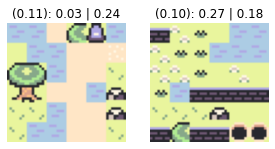

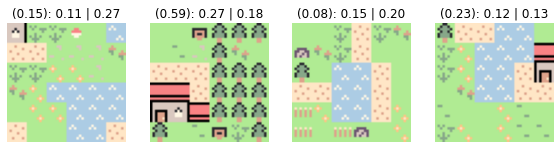

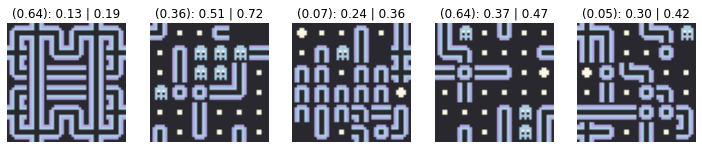

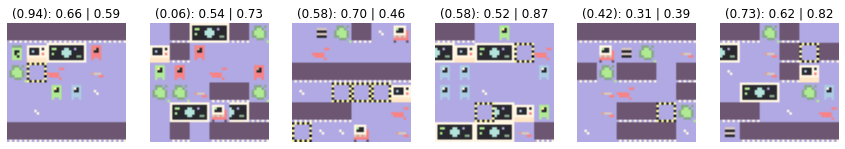

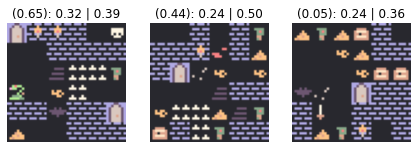

In [29]:
print("KEY: (ACTUAL SCORE): [ORIGINAL CNN] | [POST CNN]")
dat = {}

#show results on test data
for TILE in TILENAMES:
    og_scores = OG_AESTHBOT_CNN[TILE].eval_map_population(TEST_SET[TILE]['maps'])
    post_scores = np.array([POST_AESTHBOT_CNN[TILE].eval_map_population(TEST_SET[TILE]['maps'])]).flatten()
    
    
    labels = []
    for i in range(len(og_scores)):
        l = f"({TEST_SET[TILE]['scores'][i]:.2f}): {og_scores[i]:.2f} | {post_scores[i]:.2f}"
        labels.append(l)
        
    #get % error
    og_e = []
    post_e = []
    for i in range(len(og_scores)):
        actual = TEST_SET[TILE]['scores'][i]+1
        og_c = abs(og_scores[i]+1-actual)/actual
        og_e.append(og_c)
        po_c = abs(post_scores[i]+1-actual)/actual
        post_e.append(po_c)
        
    #print(f"{TILE} -> {og_e} | {post_e}")
    dat[TILE] = {'OG':np.average(og_e),'POST':np.average(post_e)}
    
    utils.showMultiMaps(TEST_SET[TILE]['maps'],TILE,'',labels)

In [30]:
#calculate percent error
import pandas as pd
print(pd.DataFrame.from_dict(dat))

for TILE in TILENAMES:
    #print(f"--- {TILE.upper()} ---")
    
    print("")

         zelda   pokemon    pacman   amongus   dungeon
OG    0.109414  0.097922  0.197419  0.142698  0.173283
POST  0.096789  0.137412  0.256387  0.194229  0.166309







#### Repeat above for multiple trials

In [46]:
TRIALS = 5
TRIAL_DAT = {}
for nn in ['OG','POST']:
    TRIAL_DAT[nn] = {}
    for TILE in TILENAMES:
        TRIAL_DAT[nn][TILE] = []
        
for TRI in range(TRIALS):
    print(f" ============ TRIAL #{TRI+1} =============")
    
    #teach the original bot from scratch
    OG_AESTHBOT_CNN = {}
    for t in TILENAMES:
        botCNN = aesthetic_bot.FitnessCNN(TILESETS[t],"binary")
        OG_AESTHBOT_CNN[t] = botCNN

    #setup the new bot from scratch as well
    POST_AESTHBOT_CNN = {}
    for t in TILENAMES:
        botCNN = FitnessCNN(TILESETS[t],"binary",MAP_SIZE)
        POST_AESTHBOT_CNN[t] = botCNN
        
    #pre-train both against real and randomness for fairness
    for TILE in TILENAMES:
        print(f"> {TILE}")
        prereal_maps = [shrinkMap(m,MAP_SIZE) for m in PROFILE_LEVELS[TILE] if m.shape[0] >= MAP_SIZE]
        prefake_maps = utils.makeRandomAscMaps(len(prereal_maps),MAP_SIZE)

        # assume the real will always win against the random
        rs = []
        fs = []
        for i in range(len(prereal_maps)):
            rs.append(1.0)  
            fs.append(0.0)

        print(" *** PRETRAINING OG FITNESS CNN ***")
        OG_AESTHBOT_CNN[TILE].train(50,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})
        print(" *** PRETRAINING POST FITNESS CNN ***")
        POST_AESTHBOT_CNN[TILE].train(50,{'real':prereal_maps,'fake':prefake_maps},{'real':rs,'fake':fs})
        
    # reserve a number for the testing
    TEST_SET = {}
    for TILE in TILENAMES:
        TEST_SET[TILE] = {'maps':[],'scores':[]}
        TEST_NUM = math.ceil(len(POLL_DATA[TILE])*0.1)
        print(f"{TILE} -> {TEST_NUM}")

        for i in range(TEST_NUM):
            if len(POLL_DATA[TILE]) > 0:
                ti = POLL_DATA[TILE].pop(random.choice(range(len(POLL_DATA[TILE]))))
                if ti['real_score']:
                    TEST_SET[TILE]['maps'].append(ti['real_map'])
                    TEST_SET[TILE]['scores'].append(ti['real_score'])
                if ti['fake_score']:
                    TEST_SET[TILE]['maps'].append(ti['fake_map'])
                    TEST_SET[TILE]['scores'].append(ti['fake_score'])
                    
    
    #train on real results from twitter pollings
    UPDATE_EPOCHS = 10

    for TILE in TILENAMES:

        #concatenate new data every iteration
        train_set_maps = {'real':[],'fake':[]}
        train_set_scores = {'real':[],'fake':[]}

        #train on each additional datapoint added 
        with tqdm(total=len(POLL_DATA[TILE])) as tbar:
            tbar.set_description(f"-- Training on {TILE} tileset! --")
            for d in POLL_DATA[TILE]:
                if len(d['real_map']) > 0:
                    train_set_maps['real'].append(d['real_map'])
                    train_set_scores['real'].append(d['real_score'])
                if len(d['fake_map']) > 0:
                    train_set_maps['fake'].append(d['fake_map'])
                    train_set_scores['fake'].append(d['fake_score'])

                if len(train_set_maps['real']) == 0 or len(train_set_maps['fake']) == 0:
                    continue


                #train both models on the updated data
                OG_AESTHBOT_CNN[TILE].train(UPDATE_EPOCHS,train_set_maps,train_set_scores)
                POST_AESTHBOT_CNN[TILE].train(UPDATE_EPOCHS,train_set_maps,train_set_scores)

                tbar.update(1)
                
#     print("KEY: (ACTUAL SCORE): [ORIGINAL CNN] | [POST CNN]")
    dat = {}

    #show results on test data
    for TILE in TILENAMES:
        og_scores = OG_AESTHBOT_CNN[TILE].eval_map_population(TEST_SET[TILE]['maps'])
        post_scores = np.array([POST_AESTHBOT_CNN[TILE].eval_map_population(TEST_SET[TILE]['maps'])]).flatten()


        labels = []
        for i in range(len(og_scores)):
            l = f"({TEST_SET[TILE]['scores'][i]:.2f}): {og_scores[i]:.2f} | {post_scores[i]:.2f}"
            labels.append(l)

        #get % error
        og_e = []
        post_e = []
        for i in range(len(og_scores)):
            actual = TEST_SET[TILE]['scores'][i]+1
            og_c = abs(og_scores[i]+1-actual)/actual
            og_e.append(og_c)
            po_c = abs(post_scores[i]+1-actual)/actual
            post_e.append(po_c)

        #print(f"{TILE} -> {og_e} | {post_e}")
        og_avg_e = np.average(og_e)
        post_avg_e = np.average(post_e)
        dat[TILE] = {'OG':og_avg_e,'POST':post_avg_e}
        
        #add data to trial dat
        TRIAL_DAT["OG"][TILE].append(og_avg_e)
        TRIAL_DAT["POST"][TILE].append(post_avg_e)

#         utils.showMultiMaps(TEST_SET[TILE]['maps'],TILE,'',labels)

 ============ TRIAL #1 =============
> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:147 / # fake:147 => 147
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:441 / # fake:441 => 441
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:245 / # fake:245 => 245
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
zelda -> 10
pokemon -> 10
pacman -> 5
amongus -> 3
dungeon -> 8


-- Training on zelda tileset! --:   0%|          | 0/86 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on zelda tileset! --:   1%|          | 1/86 [00:00<00:37,  2.25it/s]

# real:98 / # fake:49 => 98


-- Training on zelda tileset! --:   2%|▏         | 2/86 [00:01<00:43,  1.91it/s]

# real:147 / # fake:49 => 147


-- Training on zelda tileset! --:   3%|▎         | 3/86 [00:01<00:35,  2.31it/s]

# real:196 / # fake:49 => 196


-- Training on zelda tileset! --:   5%|▍         | 4/86 [00:01<00:34,  2.37it/s]

# real:245 / # fake:49 => 245


-- Training on zelda tileset! --:   6%|▌         | 5/86 [00:02<00:36,  2.20it/s]

# real:294 / # fake:49 => 294


-- Training on zelda tileset! --:   7%|▋         | 6/86 [00:02<00:38,  2.07it/s]

# real:343 / # fake:49 => 343


-- Training on zelda tileset! --:   8%|▊         | 7/86 [00:03<00:42,  1.86it/s]

# real:392 / # fake:49 => 392


-- Training on zelda tileset! --:   9%|▉         | 8/86 [00:04<00:55,  1.39it/s]

# real:441 / # fake:49 => 441


-- Training on zelda tileset! --:  10%|█         | 9/86 [00:05<00:58,  1.32it/s]

# real:490 / # fake:49 => 490


-- Training on zelda tileset! --:  12%|█▏        | 10/86 [00:06<01:01,  1.24it/s]

# real:539 / # fake:49 => 539


-- Training on zelda tileset! --:  13%|█▎        | 11/86 [00:07<01:02,  1.20it/s]

# real:588 / # fake:49 => 588


-- Training on zelda tileset! --:  14%|█▍        | 12/86 [00:08<01:04,  1.14it/s]

# real:637 / # fake:49 => 637


-- Training on zelda tileset! --:  15%|█▌        | 13/86 [00:09<01:07,  1.09it/s]

# real:686 / # fake:49 => 686


-- Training on zelda tileset! --:  16%|█▋        | 14/86 [00:10<01:10,  1.02it/s]

# real:735 / # fake:49 => 735


-- Training on zelda tileset! --:  17%|█▋        | 15/86 [00:11<01:13,  1.04s/it]

# real:784 / # fake:49 => 784


-- Training on zelda tileset! --:  19%|█▊        | 16/86 [00:12<01:21,  1.17s/it]

# real:833 / # fake:49 => 833


-- Training on zelda tileset! --:  20%|█▉        | 17/86 [00:14<01:23,  1.21s/it]

# real:882 / # fake:49 => 882


-- Training on zelda tileset! --:  21%|██        | 18/86 [00:15<01:26,  1.27s/it]

# real:931 / # fake:49 => 931


-- Training on zelda tileset! --:  22%|██▏       | 19/86 [00:17<01:29,  1.34s/it]

# real:980 / # fake:49 => 980


-- Training on zelda tileset! --:  23%|██▎       | 20/86 [00:18<01:31,  1.39s/it]

# real:1029 / # fake:49 => 1029


-- Training on zelda tileset! --:  24%|██▍       | 21/86 [00:20<01:34,  1.46s/it]

# real:1078 / # fake:49 => 1078


-- Training on zelda tileset! --:  26%|██▌       | 22/86 [00:22<01:39,  1.55s/it]

# real:1127 / # fake:49 => 1127


-- Training on zelda tileset! --:  27%|██▋       | 23/86 [00:23<01:42,  1.63s/it]

# real:1176 / # fake:49 => 1176


-- Training on zelda tileset! --:  28%|██▊       | 24/86 [00:25<01:49,  1.77s/it]

# real:1225 / # fake:49 => 1225


-- Training on zelda tileset! --:  29%|██▉       | 25/86 [00:27<01:49,  1.80s/it]

# real:1274 / # fake:49 => 1274


-- Training on zelda tileset! --:  30%|███       | 26/86 [00:29<01:49,  1.83s/it]

# real:1323 / # fake:49 => 1323


-- Training on zelda tileset! --:  31%|███▏      | 27/86 [00:31<01:51,  1.89s/it]

# real:1372 / # fake:49 => 1372


-- Training on zelda tileset! --:  33%|███▎      | 28/86 [00:34<01:55,  1.99s/it]

# real:1421 / # fake:49 => 1421


-- Training on zelda tileset! --:  34%|███▎      | 29/86 [00:36<02:00,  2.11s/it]

# real:1470 / # fake:49 => 1470


-- Training on zelda tileset! --:  35%|███▍      | 30/86 [00:38<02:01,  2.17s/it]

# real:1519 / # fake:98 => 1519


-- Training on zelda tileset! --:  36%|███▌      | 31/86 [00:41<02:02,  2.23s/it]

# real:1568 / # fake:98 => 1568


-- Training on zelda tileset! --:  37%|███▋      | 32/86 [00:43<02:11,  2.43s/it]

# real:1617 / # fake:98 => 1617


-- Training on zelda tileset! --:  38%|███▊      | 33/86 [00:46<02:13,  2.52s/it]

# real:1666 / # fake:98 => 1666


-- Training on zelda tileset! --:  40%|███▉      | 34/86 [00:49<02:15,  2.60s/it]

# real:1715 / # fake:98 => 1715


-- Training on zelda tileset! --:  41%|████      | 35/86 [00:52<02:13,  2.62s/it]

# real:1764 / # fake:98 => 1764


-- Training on zelda tileset! --:  42%|████▏     | 36/86 [00:54<02:13,  2.66s/it]

# real:1813 / # fake:98 => 1813


-- Training on zelda tileset! --:  43%|████▎     | 37/86 [00:58<02:16,  2.79s/it]

# real:1862 / # fake:98 => 1862


-- Training on zelda tileset! --:  44%|████▍     | 38/86 [01:01<02:17,  2.86s/it]

# real:1911 / # fake:98 => 1911


-- Training on zelda tileset! --:  45%|████▌     | 39/86 [01:03<02:15,  2.88s/it]

# real:1960 / # fake:147 => 1960


-- Training on zelda tileset! --:  47%|████▋     | 40/86 [01:07<02:23,  3.12s/it]

# real:2009 / # fake:147 => 2009


-- Training on zelda tileset! --:  48%|████▊     | 41/86 [01:11<02:32,  3.39s/it]

# real:2058 / # fake:147 => 2058


-- Training on zelda tileset! --:  49%|████▉     | 42/86 [01:15<02:39,  3.62s/it]

# real:2107 / # fake:147 => 2107


-- Training on zelda tileset! --:  50%|█████     | 43/86 [01:19<02:33,  3.57s/it]

# real:2156 / # fake:147 => 2156


-- Training on zelda tileset! --:  51%|█████     | 44/86 [01:22<02:28,  3.53s/it]

# real:2205 / # fake:147 => 2205


-- Training on zelda tileset! --:  52%|█████▏    | 45/86 [01:26<02:22,  3.47s/it]

# real:2254 / # fake:147 => 2254


-- Training on zelda tileset! --:  53%|█████▎    | 46/86 [01:29<02:18,  3.47s/it]

# real:2303 / # fake:147 => 2303


-- Training on zelda tileset! --:  55%|█████▍    | 47/86 [01:32<02:15,  3.47s/it]

# real:2352 / # fake:147 => 2352


-- Training on zelda tileset! --:  56%|█████▌    | 48/86 [01:37<02:20,  3.70s/it]

# real:2401 / # fake:147 => 2401


-- Training on zelda tileset! --:  57%|█████▋    | 49/86 [01:41<02:17,  3.73s/it]

# real:2450 / # fake:147 => 2450


-- Training on zelda tileset! --:  58%|█████▊    | 50/86 [01:44<02:15,  3.77s/it]

# real:2499 / # fake:196 => 2499


-- Training on zelda tileset! --:  59%|█████▉    | 51/86 [01:48<02:12,  3.78s/it]

# real:2548 / # fake:196 => 2548


-- Training on zelda tileset! --:  60%|██████    | 52/86 [01:52<02:08,  3.77s/it]

# real:2597 / # fake:196 => 2597


-- Training on zelda tileset! --:  62%|██████▏   | 53/86 [01:56<02:05,  3.81s/it]

# real:2646 / # fake:196 => 2646


-- Training on zelda tileset! --:  63%|██████▎   | 54/86 [02:00<02:04,  3.91s/it]

# real:2695 / # fake:196 => 2695


-- Training on zelda tileset! --:  64%|██████▍   | 55/86 [02:04<02:04,  4.03s/it]

# real:2695 / # fake:245 => 2695


-- Training on zelda tileset! --:  65%|██████▌   | 56/86 [02:08<02:02,  4.08s/it]

# real:2744 / # fake:245 => 2744


-- Training on zelda tileset! --:  66%|██████▋   | 57/86 [02:13<02:06,  4.35s/it]

# real:2793 / # fake:245 => 2793


-- Training on zelda tileset! --:  67%|██████▋   | 58/86 [02:18<02:01,  4.33s/it]

# real:2842 / # fake:245 => 2842


-- Training on zelda tileset! --:  69%|██████▊   | 59/86 [02:22<01:55,  4.29s/it]

# real:2891 / # fake:245 => 2891


-- Training on zelda tileset! --:  70%|██████▉   | 60/86 [02:26<01:51,  4.27s/it]

# real:2940 / # fake:245 => 2940


-- Training on zelda tileset! --:  71%|███████   | 61/86 [02:31<01:48,  4.33s/it]

# real:2989 / # fake:245 => 2989


-- Training on zelda tileset! --:  72%|███████▏  | 62/86 [02:35<01:45,  4.38s/it]

# real:3038 / # fake:245 => 3038


-- Training on zelda tileset! --:  73%|███████▎  | 63/86 [02:40<01:42,  4.44s/it]

# real:3087 / # fake:245 => 3087


-- Training on zelda tileset! --:  74%|███████▍  | 64/86 [02:45<01:40,  4.58s/it]

# real:3136 / # fake:245 => 3136


-- Training on zelda tileset! --:  76%|███████▌  | 65/86 [02:50<01:43,  4.92s/it]

# real:3185 / # fake:245 => 3185


-- Training on zelda tileset! --:  77%|███████▋  | 66/86 [02:56<01:45,  5.26s/it]

# real:3234 / # fake:245 => 3234


-- Training on zelda tileset! --:  78%|███████▊  | 67/86 [03:02<01:40,  5.30s/it]

# real:3283 / # fake:245 => 3283


-- Training on zelda tileset! --:  79%|███████▉  | 68/86 [03:07<01:35,  5.28s/it]

# real:3332 / # fake:245 => 3332


-- Training on zelda tileset! --:  80%|████████  | 69/86 [03:13<01:33,  5.52s/it]

# real:3381 / # fake:245 => 3381


-- Training on zelda tileset! --:  81%|████████▏ | 70/86 [03:18<01:25,  5.36s/it]

# real:3430 / # fake:245 => 3430


-- Training on zelda tileset! --:  83%|████████▎ | 71/86 [03:24<01:22,  5.49s/it]

# real:3479 / # fake:245 => 3479


-- Training on zelda tileset! --:  84%|████████▎ | 72/86 [03:30<01:18,  5.62s/it]

# real:3528 / # fake:245 => 3528


-- Training on zelda tileset! --:  85%|████████▍ | 73/86 [03:37<01:19,  6.12s/it]

# real:3577 / # fake:245 => 3577


-- Training on zelda tileset! --:  86%|████████▌ | 74/86 [03:43<01:12,  6.01s/it]

# real:3626 / # fake:245 => 3626


-- Training on zelda tileset! --:  87%|████████▋ | 75/86 [03:49<01:05,  5.99s/it]

# real:3675 / # fake:245 => 3675


-- Training on zelda tileset! --:  88%|████████▊ | 76/86 [03:55<01:00,  6.03s/it]

# real:3724 / # fake:245 => 3724


-- Training on zelda tileset! --:  90%|████████▉ | 77/86 [04:02<00:56,  6.31s/it]

# real:3773 / # fake:245 => 3773


-- Training on zelda tileset! --:  91%|█████████ | 78/86 [04:08<00:50,  6.33s/it]

# real:3822 / # fake:245 => 3822


-- Training on zelda tileset! --:  92%|█████████▏| 79/86 [04:15<00:44,  6.32s/it]

# real:3871 / # fake:245 => 3871


-- Training on zelda tileset! --:  93%|█████████▎| 80/86 [04:21<00:38,  6.45s/it]

# real:3920 / # fake:245 => 3920


-- Training on zelda tileset! --:  94%|█████████▍| 81/86 [04:29<00:34,  6.86s/it]

# real:3969 / # fake:245 => 3969


-- Training on zelda tileset! --:  95%|█████████▌| 82/86 [04:36<00:27,  6.79s/it]

# real:4018 / # fake:245 => 4018


-- Training on zelda tileset! --:  97%|█████████▋| 83/86 [04:44<00:21,  7.12s/it]

# real:4067 / # fake:245 => 4067


-- Training on zelda tileset! --:  98%|█████████▊| 84/86 [04:51<00:14,  7.13s/it]

# real:4116 / # fake:294 => 4116


-- Training on zelda tileset! --:  99%|█████████▉| 85/86 [04:58<00:07,  7.04s/it]

# real:4116 / # fake:343 => 4116


-- Training on pokemon tileset! --:   0%|          | 0/86 [00:00<?, ?it/s]

# real:490 / # fake:49 => 490


-- Training on pokemon tileset! --:   1%|          | 1/86 [00:01<01:48,  1.28s/it]

# real:539 / # fake:49 => 539


-- Training on pokemon tileset! --:   2%|▏         | 2/86 [00:02<01:53,  1.36s/it]

# real:588 / # fake:49 => 588


-- Training on pokemon tileset! --:   3%|▎         | 3/86 [00:04<02:03,  1.49s/it]

# real:637 / # fake:49 => 637


-- Training on pokemon tileset! --:   5%|▍         | 4/86 [00:05<02:00,  1.47s/it]

# real:686 / # fake:49 => 686


-- Training on pokemon tileset! --:   6%|▌         | 5/86 [00:06<01:51,  1.38s/it]

# real:735 / # fake:49 => 735


-- Training on pokemon tileset! --:   7%|▋         | 6/86 [00:08<01:48,  1.36s/it]

# real:784 / # fake:49 => 784


-- Training on pokemon tileset! --:   8%|▊         | 7/86 [00:10<02:03,  1.57s/it]

# real:833 / # fake:49 => 833


-- Training on pokemon tileset! --:   9%|▉         | 8/86 [00:11<02:03,  1.59s/it]

# real:882 / # fake:49 => 882


-- Training on pokemon tileset! --:  10%|█         | 9/86 [00:13<02:02,  1.59s/it]

# real:931 / # fake:49 => 931


-- Training on pokemon tileset! --:  12%|█▏        | 10/86 [00:15<02:04,  1.64s/it]

# real:980 / # fake:49 => 980


-- Training on pokemon tileset! --:  13%|█▎        | 11/86 [00:16<02:03,  1.64s/it]

# real:1029 / # fake:49 => 1029


-- Training on pokemon tileset! --:  14%|█▍        | 12/86 [00:18<02:04,  1.68s/it]

# real:1078 / # fake:49 => 1078


-- Training on pokemon tileset! --:  15%|█▌        | 13/86 [00:20<02:11,  1.80s/it]

# real:1127 / # fake:49 => 1127


-- Training on pokemon tileset! --:  16%|█▋        | 14/86 [00:22<02:14,  1.86s/it]

# real:1176 / # fake:49 => 1176


-- Training on pokemon tileset! --:  17%|█▋        | 15/86 [00:25<02:25,  2.05s/it]

# real:1225 / # fake:49 => 1225


-- Training on pokemon tileset! --:  19%|█▊        | 16/86 [00:27<02:25,  2.07s/it]

# real:1274 / # fake:49 => 1274


-- Training on pokemon tileset! --:  20%|█▉        | 17/86 [00:29<02:23,  2.08s/it]

# real:1323 / # fake:98 => 1323


-- Training on pokemon tileset! --:  21%|██        | 18/86 [00:31<02:22,  2.10s/it]

# real:1372 / # fake:98 => 1372


-- Training on pokemon tileset! --:  22%|██▏       | 19/86 [00:33<02:21,  2.11s/it]

# real:1421 / # fake:98 => 1421


-- Training on pokemon tileset! --:  23%|██▎       | 20/86 [00:35<02:21,  2.15s/it]

# real:1470 / # fake:98 => 1470


-- Training on pokemon tileset! --:  24%|██▍       | 21/86 [00:38<02:21,  2.18s/it]

# real:1519 / # fake:98 => 1519


-- Training on pokemon tileset! --:  26%|██▌       | 22/86 [00:40<02:23,  2.24s/it]

# real:1568 / # fake:98 => 1568


-- Training on pokemon tileset! --:  27%|██▋       | 23/86 [00:43<02:32,  2.42s/it]

# real:1617 / # fake:98 => 1617


-- Training on pokemon tileset! --:  28%|██▊       | 24/86 [00:45<02:31,  2.45s/it]

# real:1666 / # fake:147 => 1666


-- Training on pokemon tileset! --:  29%|██▉       | 25/86 [00:48<02:37,  2.59s/it]

# real:1715 / # fake:147 => 1715


-- Training on pokemon tileset! --:  30%|███       | 26/86 [00:51<02:42,  2.72s/it]

# real:1764 / # fake:147 => 1764


-- Training on pokemon tileset! --:  31%|███▏      | 27/86 [00:54<02:44,  2.79s/it]

# real:1813 / # fake:147 => 1813


-- Training on pokemon tileset! --:  33%|███▎      | 28/86 [00:57<02:43,  2.82s/it]

# real:1862 / # fake:196 => 1862


-- Training on pokemon tileset! --:  34%|███▎      | 29/86 [01:00<02:40,  2.81s/it]

# real:1911 / # fake:196 => 1911


-- Training on pokemon tileset! --:  35%|███▍      | 30/86 [01:03<02:37,  2.82s/it]

# real:1960 / # fake:196 => 1960


-- Training on pokemon tileset! --:  36%|███▌      | 31/86 [01:07<02:49,  3.07s/it]

# real:2009 / # fake:196 => 2009


-- Training on pokemon tileset! --:  37%|███▋      | 32/86 [01:10<02:51,  3.18s/it]

# real:2058 / # fake:196 => 2058


-- Training on pokemon tileset! --:  38%|███▊      | 33/86 [01:14<02:54,  3.29s/it]

# real:2107 / # fake:196 => 2107


-- Training on pokemon tileset! --:  40%|███▉      | 34/86 [01:17<02:56,  3.39s/it]

# real:2156 / # fake:196 => 2156


-- Training on pokemon tileset! --:  41%|████      | 35/86 [01:21<02:54,  3.42s/it]

# real:2205 / # fake:196 => 2205


-- Training on pokemon tileset! --:  42%|████▏     | 36/86 [01:24<02:51,  3.43s/it]

# real:2254 / # fake:196 => 2254


-- Training on pokemon tileset! --:  43%|████▎     | 37/86 [01:27<02:47,  3.42s/it]

# real:2303 / # fake:196 => 2303


-- Training on pokemon tileset! --:  44%|████▍     | 38/86 [01:31<02:44,  3.43s/it]

# real:2352 / # fake:196 => 2352


-- Training on pokemon tileset! --:  45%|████▌     | 39/86 [01:35<02:54,  3.70s/it]

# real:2401 / # fake:196 => 2401


-- Training on pokemon tileset! --:  47%|████▋     | 40/86 [01:39<02:50,  3.70s/it]

# real:2450 / # fake:245 => 2450


-- Training on pokemon tileset! --:  48%|████▊     | 41/86 [01:43<02:47,  3.72s/it]

# real:2499 / # fake:245 => 2499


-- Training on pokemon tileset! --:  49%|████▉     | 42/86 [01:47<02:46,  3.78s/it]

# real:2548 / # fake:245 => 2548


-- Training on pokemon tileset! --:  50%|█████     | 43/86 [01:51<02:46,  3.87s/it]

# real:2597 / # fake:245 => 2597


-- Training on pokemon tileset! --:  51%|█████     | 44/86 [01:55<02:48,  4.00s/it]

# real:2646 / # fake:245 => 2646


-- Training on pokemon tileset! --:  52%|█████▏    | 45/86 [01:59<02:48,  4.10s/it]

# real:2695 / # fake:245 => 2695


-- Training on pokemon tileset! --:  53%|█████▎    | 46/86 [02:04<02:53,  4.35s/it]

# real:2744 / # fake:245 => 2744


-- Training on pokemon tileset! --:  55%|█████▍    | 47/86 [02:10<03:10,  4.90s/it]

# real:2793 / # fake:245 => 2793


-- Training on pokemon tileset! --:  56%|█████▌    | 48/86 [02:15<03:01,  4.79s/it]

# real:2842 / # fake:245 => 2842


-- Training on pokemon tileset! --:  57%|█████▋    | 49/86 [02:20<03:02,  4.93s/it]

# real:2891 / # fake:245 => 2891


-- Training on pokemon tileset! --:  58%|█████▊    | 50/86 [02:25<03:00,  5.02s/it]

# real:2940 / # fake:294 => 2940


-- Training on pokemon tileset! --:  59%|█████▉    | 51/86 [02:30<02:55,  5.01s/it]

# real:2989 / # fake:294 => 2989


-- Training on pokemon tileset! --:  60%|██████    | 52/86 [02:35<02:45,  4.86s/it]

# real:3038 / # fake:294 => 3038


-- Training on pokemon tileset! --:  62%|██████▏   | 53/86 [02:40<02:38,  4.79s/it]

# real:3087 / # fake:294 => 3087


-- Training on pokemon tileset! --:  63%|██████▎   | 54/86 [02:45<02:35,  4.85s/it]

# real:3136 / # fake:294 => 3136


-- Training on pokemon tileset! --:  64%|██████▍   | 55/86 [02:51<02:40,  5.19s/it]

# real:3185 / # fake:294 => 3185


-- Training on pokemon tileset! --:  65%|██████▌   | 56/86 [02:56<02:34,  5.16s/it]

# real:3234 / # fake:294 => 3234


-- Training on pokemon tileset! --:  66%|██████▋   | 57/86 [03:01<02:28,  5.13s/it]

# real:3283 / # fake:294 => 3283


-- Training on pokemon tileset! --:  67%|██████▋   | 58/86 [03:06<02:22,  5.10s/it]

# real:3332 / # fake:294 => 3332


-- Training on pokemon tileset! --:  69%|██████▊   | 59/86 [03:11<02:16,  5.06s/it]

# real:3381 / # fake:294 => 3381


-- Training on pokemon tileset! --:  70%|██████▉   | 60/86 [03:16<02:10,  5.03s/it]

# real:3430 / # fake:294 => 3430


-- Training on pokemon tileset! --:  71%|███████   | 61/86 [03:21<02:07,  5.11s/it]

# real:3479 / # fake:294 => 3479


-- Training on pokemon tileset! --:  72%|███████▏  | 62/86 [03:26<02:04,  5.17s/it]

# real:3528 / # fake:294 => 3528


-- Training on pokemon tileset! --:  73%|███████▎  | 63/86 [03:33<02:08,  5.57s/it]

# real:3577 / # fake:294 => 3577


-- Training on pokemon tileset! --:  74%|███████▍  | 64/86 [03:38<02:02,  5.56s/it]

# real:3626 / # fake:294 => 3626


-- Training on pokemon tileset! --:  76%|███████▌  | 65/86 [03:44<01:59,  5.67s/it]

# real:3675 / # fake:294 => 3675


-- Training on pokemon tileset! --:  77%|███████▋  | 66/86 [03:51<01:57,  5.87s/it]

# real:3724 / # fake:294 => 3724


-- Training on pokemon tileset! --:  78%|███████▊  | 67/86 [03:56<01:48,  5.73s/it]

# real:3773 / # fake:294 => 3773


-- Training on pokemon tileset! --:  79%|███████▉  | 68/86 [04:02<01:45,  5.84s/it]

# real:3822 / # fake:294 => 3822


-- Training on pokemon tileset! --:  80%|████████  | 69/86 [04:10<01:47,  6.32s/it]

# real:3871 / # fake:294 => 3871


-- Training on pokemon tileset! --:  81%|████████▏ | 70/86 [04:16<01:40,  6.29s/it]

# real:3920 / # fake:294 => 3920


-- Training on pokemon tileset! --:  83%|████████▎ | 71/86 [04:24<01:41,  6.79s/it]

# real:3969 / # fake:294 => 3969


-- Training on pokemon tileset! --:  84%|████████▎ | 72/86 [04:31<01:35,  6.81s/it]

# real:4018 / # fake:343 => 4018


-- Training on pokemon tileset! --:  85%|████████▍ | 73/86 [04:38<01:29,  6.91s/it]

# real:4067 / # fake:392 => 4067


-- Training on pokemon tileset! --:  86%|████████▌ | 74/86 [04:45<01:23,  6.92s/it]

# real:4116 / # fake:392 => 4116


-- Training on pokemon tileset! --:  87%|████████▋ | 75/86 [04:52<01:18,  7.10s/it]

# real:4165 / # fake:392 => 4165


-- Training on pokemon tileset! --:  88%|████████▊ | 76/86 [04:59<01:10,  7.02s/it]

# real:4165 / # fake:441 => 4165


-- Training on pacman tileset! --:   0%|          | 0/41 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on pacman tileset! --:   2%|▏         | 1/41 [00:00<00:20,  1.91it/s]

# real:98 / # fake:49 => 98


-- Training on pacman tileset! --:   5%|▍         | 2/41 [00:01<00:22,  1.70it/s]

# real:98 / # fake:98 => 98


-- Training on pacman tileset! --:   7%|▋         | 3/41 [00:01<00:16,  2.27it/s]

# real:147 / # fake:98 => 147


-- Training on pacman tileset! --:  10%|▉         | 4/41 [00:01<00:15,  2.47it/s]

# real:196 / # fake:98 => 196


-- Training on pacman tileset! --:  12%|█▏        | 5/41 [00:02<00:14,  2.45it/s]

# real:245 / # fake:98 => 245


-- Training on pacman tileset! --:  15%|█▍        | 6/41 [00:02<00:15,  2.28it/s]

# real:294 / # fake:98 => 294


-- Training on pacman tileset! --:  17%|█▋        | 7/41 [00:03<00:16,  2.10it/s]

# real:343 / # fake:98 => 343


-- Training on pacman tileset! --:  20%|█▉        | 8/41 [00:03<00:17,  1.88it/s]

# real:392 / # fake:98 => 392


-- Training on pacman tileset! --:  22%|██▏       | 9/41 [00:05<00:23,  1.34it/s]

# real:441 / # fake:98 => 441


-- Training on pacman tileset! --:  24%|██▍       | 10/41 [00:05<00:23,  1.31it/s]

# real:490 / # fake:98 => 490


-- Training on pacman tileset! --:  27%|██▋       | 11/41 [00:06<00:23,  1.26it/s]

# real:539 / # fake:98 => 539


-- Training on pacman tileset! --:  29%|██▉       | 12/41 [00:07<00:24,  1.20it/s]

# real:588 / # fake:98 => 588


-- Training on pacman tileset! --:  32%|███▏      | 13/41 [00:08<00:24,  1.12it/s]

# real:637 / # fake:98 => 637


-- Training on pacman tileset! --:  34%|███▍      | 14/41 [00:09<00:25,  1.04it/s]

# real:686 / # fake:98 => 686


-- Training on pacman tileset! --:  37%|███▋      | 15/41 [00:11<00:27,  1.04s/it]

# real:735 / # fake:98 => 735


-- Training on pacman tileset! --:  39%|███▉      | 16/41 [00:12<00:27,  1.11s/it]

# real:784 / # fake:98 => 784


-- Training on pacman tileset! --:  41%|████▏     | 17/41 [00:13<00:30,  1.26s/it]

# real:833 / # fake:98 => 833


-- Training on pacman tileset! --:  44%|████▍     | 18/41 [00:15<00:30,  1.33s/it]

# real:882 / # fake:98 => 882


-- Training on pacman tileset! --:  46%|████▋     | 19/41 [00:16<00:30,  1.38s/it]

# real:931 / # fake:98 => 931


-- Training on pacman tileset! --:  49%|████▉     | 20/41 [00:18<00:31,  1.48s/it]

# real:980 / # fake:147 => 980


-- Training on pacman tileset! --:  51%|█████     | 21/41 [00:20<00:30,  1.54s/it]

# real:1029 / # fake:147 => 1029


-- Training on pacman tileset! --:  54%|█████▎    | 22/41 [00:22<00:31,  1.65s/it]

# real:1078 / # fake:147 => 1078


-- Training on pacman tileset! --:  56%|█████▌    | 23/41 [00:24<00:30,  1.69s/it]

# real:1127 / # fake:147 => 1127


-- Training on pacman tileset! --:  59%|█████▊    | 24/41 [00:25<00:29,  1.75s/it]

# real:1176 / # fake:147 => 1176


-- Training on pacman tileset! --:  61%|██████    | 25/41 [00:28<00:30,  1.90s/it]

# real:1225 / # fake:147 => 1225


-- Training on pacman tileset! --:  63%|██████▎   | 26/41 [00:30<00:28,  1.89s/it]

# real:1274 / # fake:147 => 1274


-- Training on pacman tileset! --:  66%|██████▌   | 27/41 [00:31<00:26,  1.89s/it]

# real:1323 / # fake:147 => 1323


-- Training on pacman tileset! --:  68%|██████▊   | 28/41 [00:33<00:25,  1.93s/it]

# real:1372 / # fake:147 => 1372


-- Training on pacman tileset! --:  71%|███████   | 29/41 [00:36<00:24,  2.01s/it]

# real:1421 / # fake:147 => 1421


-- Training on pacman tileset! --:  73%|███████▎  | 30/41 [00:38<00:22,  2.09s/it]

# real:1470 / # fake:147 => 1470


-- Training on pacman tileset! --:  76%|███████▌  | 31/41 [00:40<00:21,  2.18s/it]

# real:1519 / # fake:147 => 1519


-- Training on pacman tileset! --:  78%|███████▊  | 32/41 [00:43<00:20,  2.26s/it]

# real:1568 / # fake:147 => 1568


-- Training on pacman tileset! --:  80%|████████  | 33/41 [00:46<00:20,  2.52s/it]

# real:1617 / # fake:147 => 1617


-- Training on pacman tileset! --:  83%|████████▎ | 34/41 [00:49<00:17,  2.55s/it]

# real:1666 / # fake:147 => 1666


-- Training on pacman tileset! --:  85%|████████▌ | 35/41 [00:51<00:15,  2.58s/it]

# real:1715 / # fake:147 => 1715


-- Training on pacman tileset! --:  88%|████████▊ | 36/41 [00:54<00:13,  2.62s/it]

# real:1764 / # fake:147 => 1764


-- Training on pacman tileset! --:  90%|█████████ | 37/41 [00:57<00:10,  2.75s/it]

# real:1813 / # fake:147 => 1813


-- Training on pacman tileset! --:  93%|█████████▎| 38/41 [01:00<00:08,  2.95s/it]

# real:1862 / # fake:147 => 1862


-- Training on pacman tileset! --:  95%|█████████▌| 39/41 [01:04<00:06,  3.01s/it]

# real:1911 / # fake:196 => 1911


-- Training on amongus tileset! --:   0%|          | 0/20 [00:00<?, ?it/s]

# real:441 / # fake:49 => 441


-- Training on amongus tileset! --:   5%|▌         | 1/20 [00:01<00:21,  1.13s/it]

# real:490 / # fake:49 => 490


-- Training on amongus tileset! --:  10%|█         | 2/20 [00:02<00:20,  1.16s/it]

# real:539 / # fake:49 => 539


-- Training on amongus tileset! --:  15%|█▌        | 3/20 [00:03<00:17,  1.05s/it]

# real:588 / # fake:49 => 588


-- Training on amongus tileset! --:  20%|██        | 4/20 [00:04<00:16,  1.02s/it]

# real:637 / # fake:49 => 637


-- Training on amongus tileset! --:  25%|██▌       | 5/20 [00:05<00:15,  1.02s/it]

# real:686 / # fake:49 => 686


-- Training on amongus tileset! --:  30%|███       | 6/20 [00:06<00:15,  1.09s/it]

# real:735 / # fake:49 => 735


-- Training on amongus tileset! --:  35%|███▌      | 7/20 [00:07<00:14,  1.12s/it]

# real:784 / # fake:49 => 784


-- Training on amongus tileset! --:  40%|████      | 8/20 [00:09<00:16,  1.40s/it]

# real:833 / # fake:49 => 833


-- Training on amongus tileset! --:  45%|████▌     | 9/20 [00:10<00:15,  1.38s/it]

# real:882 / # fake:49 => 882


-- Training on amongus tileset! --:  50%|█████     | 10/20 [00:12<00:13,  1.40s/it]

# real:882 / # fake:98 => 882


-- Training on amongus tileset! --:  55%|█████▌    | 11/20 [00:13<00:12,  1.39s/it]

# real:931 / # fake:98 => 931


-- Training on dungeon tileset! --:   0%|          | 0/68 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on dungeon tileset! --:   1%|▏         | 1/68 [00:00<00:34,  1.95it/s]

# real:98 / # fake:49 => 98


-- Training on dungeon tileset! --:   3%|▎         | 2/68 [00:01<00:38,  1.72it/s]

# real:147 / # fake:49 => 147


-- Training on dungeon tileset! --:   4%|▍         | 3/68 [00:01<00:30,  2.15it/s]

# real:196 / # fake:49 => 196


-- Training on dungeon tileset! --:   6%|▌         | 4/68 [00:01<00:28,  2.21it/s]

# real:245 / # fake:49 => 245


-- Training on dungeon tileset! --:   7%|▋         | 5/68 [00:02<00:28,  2.18it/s]

# real:294 / # fake:49 => 294


-- Training on dungeon tileset! --:   9%|▉         | 6/68 [00:02<00:29,  2.08it/s]

# real:343 / # fake:49 => 343


-- Training on dungeon tileset! --:  10%|█         | 7/68 [00:03<00:32,  1.90it/s]

# real:392 / # fake:49 => 392


-- Training on dungeon tileset! --:  12%|█▏        | 8/68 [00:04<00:43,  1.39it/s]

# real:441 / # fake:49 => 441


-- Training on dungeon tileset! --:  13%|█▎        | 9/68 [00:05<00:43,  1.35it/s]

# real:490 / # fake:49 => 490


-- Training on dungeon tileset! --:  15%|█▍        | 10/68 [00:06<00:45,  1.29it/s]

# real:539 / # fake:49 => 539


-- Training on dungeon tileset! --:  16%|█▌        | 11/68 [00:07<00:46,  1.22it/s]

# real:588 / # fake:49 => 588


-- Training on dungeon tileset! --:  18%|█▊        | 12/68 [00:08<00:49,  1.14it/s]

# real:637 / # fake:49 => 637


-- Training on dungeon tileset! --:  19%|█▉        | 13/68 [00:09<00:51,  1.07it/s]

# real:686 / # fake:49 => 686


-- Training on dungeon tileset! --:  21%|██        | 14/68 [00:10<00:54,  1.01s/it]

# real:735 / # fake:49 => 735


-- Training on dungeon tileset! --:  22%|██▏       | 15/68 [00:11<00:57,  1.08s/it]

# real:784 / # fake:49 => 784


-- Training on dungeon tileset! --:  24%|██▎       | 16/68 [00:13<01:05,  1.26s/it]

# real:833 / # fake:49 => 833


-- Training on dungeon tileset! --:  25%|██▌       | 17/68 [00:14<01:06,  1.31s/it]

# real:882 / # fake:49 => 882


-- Training on dungeon tileset! --:  26%|██▋       | 18/68 [00:16<01:08,  1.36s/it]

# real:931 / # fake:49 => 931


-- Training on dungeon tileset! --:  28%|██▊       | 19/68 [00:17<01:10,  1.44s/it]

# real:980 / # fake:49 => 980


-- Training on dungeon tileset! --:  29%|██▉       | 20/68 [00:19<01:12,  1.51s/it]

# real:1029 / # fake:49 => 1029


-- Training on dungeon tileset! --:  31%|███       | 21/68 [00:21<01:14,  1.59s/it]

# real:1078 / # fake:49 => 1078


-- Training on dungeon tileset! --:  32%|███▏      | 22/68 [00:23<01:16,  1.65s/it]

# real:1127 / # fake:49 => 1127


-- Training on dungeon tileset! --:  34%|███▍      | 23/68 [00:25<01:28,  1.96s/it]

# real:1176 / # fake:49 => 1176


-- Training on dungeon tileset! --:  35%|███▌      | 24/68 [00:28<01:36,  2.20s/it]

# real:1225 / # fake:49 => 1225


-- Training on dungeon tileset! --:  37%|███▋      | 25/68 [00:31<01:45,  2.44s/it]

# real:1274 / # fake:49 => 1274


-- Training on dungeon tileset! --:  38%|███▊      | 26/68 [00:34<01:46,  2.54s/it]

# real:1323 / # fake:49 => 1323


-- Training on dungeon tileset! --:  40%|███▉      | 27/68 [00:37<01:55,  2.81s/it]

# real:1372 / # fake:49 => 1372


-- Training on dungeon tileset! --:  41%|████      | 28/68 [00:40<01:54,  2.86s/it]

# real:1421 / # fake:49 => 1421


-- Training on dungeon tileset! --:  43%|████▎     | 29/68 [00:43<01:47,  2.74s/it]

# real:1470 / # fake:49 => 1470


-- Training on dungeon tileset! --:  44%|████▍     | 30/68 [00:45<01:41,  2.66s/it]

# real:1519 / # fake:49 => 1519


-- Training on dungeon tileset! --:  46%|████▌     | 31/68 [00:48<01:36,  2.62s/it]

# real:1568 / # fake:49 => 1568


-- Training on dungeon tileset! --:  47%|████▋     | 32/68 [00:51<01:40,  2.79s/it]

# real:1617 / # fake:49 => 1617


-- Training on dungeon tileset! --:  49%|████▊     | 33/68 [00:54<01:38,  2.82s/it]

# real:1666 / # fake:49 => 1666


-- Training on dungeon tileset! --:  50%|█████     | 34/68 [00:57<01:35,  2.80s/it]

# real:1715 / # fake:49 => 1715


-- Training on dungeon tileset! --:  51%|█████▏    | 35/68 [00:59<01:31,  2.78s/it]

# real:1764 / # fake:49 => 1764


-- Training on dungeon tileset! --:  53%|█████▎    | 36/68 [01:02<01:29,  2.79s/it]

# real:1813 / # fake:49 => 1813


-- Training on dungeon tileset! --:  54%|█████▍    | 37/68 [01:05<01:25,  2.77s/it]

# real:1862 / # fake:49 => 1862


-- Training on dungeon tileset! --:  56%|█████▌    | 38/68 [01:08<01:24,  2.83s/it]

# real:1911 / # fake:49 => 1911


-- Training on dungeon tileset! --:  57%|█████▋    | 39/68 [01:11<01:23,  2.87s/it]

# real:1960 / # fake:49 => 1960


-- Training on dungeon tileset! --:  59%|█████▉    | 40/68 [01:14<01:27,  3.11s/it]

# real:2009 / # fake:49 => 2009


-- Training on dungeon tileset! --:  60%|██████    | 41/68 [01:18<01:28,  3.27s/it]

# real:2058 / # fake:49 => 2058


-- Training on dungeon tileset! --:  62%|██████▏   | 42/68 [01:22<01:28,  3.39s/it]

# real:2107 / # fake:49 => 2107


-- Training on dungeon tileset! --:  63%|██████▎   | 43/68 [01:25<01:26,  3.46s/it]

# real:2156 / # fake:49 => 2156


-- Training on dungeon tileset! --:  65%|██████▍   | 44/68 [01:29<01:23,  3.48s/it]

# real:2205 / # fake:49 => 2205


-- Training on dungeon tileset! --:  66%|██████▌   | 45/68 [01:32<01:20,  3.49s/it]

# real:2254 / # fake:49 => 2254


-- Training on dungeon tileset! --:  68%|██████▊   | 46/68 [01:36<01:19,  3.62s/it]

# real:2303 / # fake:49 => 2303


-- Training on dungeon tileset! --:  69%|██████▉   | 47/68 [01:40<01:18,  3.75s/it]

# real:2352 / # fake:49 => 2352


-- Training on dungeon tileset! --:  71%|███████   | 48/68 [01:46<01:23,  4.16s/it]

# real:2401 / # fake:49 => 2401


-- Training on dungeon tileset! --:  72%|███████▏  | 49/68 [01:50<01:19,  4.18s/it]

# real:2450 / # fake:49 => 2450


-- Training on dungeon tileset! --:  74%|███████▎  | 50/68 [01:55<01:22,  4.59s/it]

# real:2499 / # fake:49 => 2499


-- Training on dungeon tileset! --:  75%|███████▌  | 51/68 [02:00<01:18,  4.64s/it]

# real:2548 / # fake:49 => 2548


-- Training on dungeon tileset! --:  76%|███████▋  | 52/68 [02:05<01:13,  4.62s/it]

# real:2597 / # fake:49 => 2597


-- Training on dungeon tileset! --:  78%|███████▊  | 53/68 [02:09<01:10,  4.67s/it]

# real:2646 / # fake:49 => 2646


-- Training on dungeon tileset! --:  79%|███████▉  | 54/68 [02:14<01:04,  4.63s/it]

# real:2695 / # fake:49 => 2695


-- Training on dungeon tileset! --:  81%|████████  | 55/68 [02:19<01:00,  4.62s/it]

# real:2744 / # fake:49 => 2744


-- Training on dungeon tileset! --:  82%|████████▏ | 56/68 [02:24<00:58,  4.85s/it]

# real:2793 / # fake:49 => 2793


-- Training on dungeon tileset! --:  84%|████████▍ | 57/68 [02:28<00:51,  4.72s/it]

# real:2842 / # fake:49 => 2842


-- Training on dungeon tileset! --:  85%|████████▌ | 58/68 [02:33<00:46,  4.63s/it]

# real:2891 / # fake:49 => 2891


-- Training on dungeon tileset! --:  87%|████████▋ | 59/68 [02:37<00:41,  4.62s/it]

# real:2940 / # fake:49 => 2940


-- Training on dungeon tileset! --:  88%|████████▊ | 60/68 [02:42<00:37,  4.63s/it]

# real:2989 / # fake:49 => 2989


-- Training on dungeon tileset! --:  90%|████████▉ | 61/68 [02:47<00:32,  4.67s/it]

# real:2989 / # fake:98 => 2989


-- Training on dungeon tileset! --:  91%|█████████ | 62/68 [02:52<00:28,  4.71s/it]

# real:3038 / # fake:98 => 3038


-- Training on dungeon tileset! --:  93%|█████████▎| 63/68 [02:56<00:23,  4.74s/it]

# real:3087 / # fake:98 => 3087


-- Training on dungeon tileset! --:  94%|█████████▍| 64/68 [03:01<00:19,  4.83s/it]

# real:3136 / # fake:98 => 3136


-- Training on dungeon tileset! --:  96%|█████████▌| 65/68 [03:08<00:15,  5.26s/it]

# real:3185 / # fake:147 => 3185


-- Training on dungeon tileset! --:  97%|█████████▋| 66/68 [03:13<00:10,  5.21s/it]

# real:3234 / # fake:147 => 3234


-- Training on dungeon tileset! --:  99%|█████████▊| 67/68 [03:18<00:02,  2.96s/it]


 ============ TRIAL #2 =============
> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:147 / # fake:147 => 147
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:441 / # fake:441 => 441
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:245 / # fake:245 => 245
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
zelda -> 9
pokemon -> 9
pacman -> 5
amongus -> 2
dungeon -> 7


-- Training on zelda tileset! --:   0%|          | 0/77 [00:00<?, ?it/s]

# real:1470 / # fake:49 => 1470


-- Training on zelda tileset! --:   1%|▏         | 1/77 [00:03<04:06,  3.24s/it]

# real:1519 / # fake:49 => 1519


-- Training on zelda tileset! --:   3%|▎         | 2/77 [00:05<03:39,  2.93s/it]

# real:1568 / # fake:49 => 1568


-- Training on zelda tileset! --:   4%|▍         | 3/77 [00:09<04:05,  3.31s/it]

# real:1617 / # fake:49 => 1617


-- Training on zelda tileset! --:   5%|▌         | 4/77 [00:12<03:47,  3.12s/it]

# real:1666 / # fake:49 => 1666


-- Training on zelda tileset! --:   6%|▋         | 5/77 [00:15<03:41,  3.08s/it]

# real:1715 / # fake:49 => 1715


-- Training on zelda tileset! --:   8%|▊         | 6/77 [00:18<03:42,  3.13s/it]

# real:1764 / # fake:49 => 1764


-- Training on zelda tileset! --:   9%|▉         | 7/77 [00:21<03:39,  3.14s/it]

# real:1813 / # fake:98 => 1813


-- Training on zelda tileset! --:  10%|█         | 8/77 [00:25<03:37,  3.16s/it]

# real:1862 / # fake:98 => 1862


-- Training on zelda tileset! --:  12%|█▏        | 9/77 [00:28<03:34,  3.15s/it]

# real:1911 / # fake:98 => 1911


-- Training on zelda tileset! --:  13%|█▎        | 10/77 [00:31<03:26,  3.08s/it]

# real:1960 / # fake:98 => 1960


-- Training on zelda tileset! --:  14%|█▍        | 11/77 [00:34<03:36,  3.28s/it]

# real:2009 / # fake:98 => 2009


-- Training on zelda tileset! --:  16%|█▌        | 12/77 [00:37<03:28,  3.20s/it]

# real:2058 / # fake:98 => 2058


-- Training on zelda tileset! --:  17%|█▋        | 13/77 [00:40<03:21,  3.14s/it]

# real:2107 / # fake:98 => 2107


-- Training on zelda tileset! --:  18%|█▊        | 14/77 [00:44<03:17,  3.13s/it]

# real:2156 / # fake:98 => 2156


-- Training on zelda tileset! --:  19%|█▉        | 15/77 [00:47<03:14,  3.14s/it]

# real:2205 / # fake:98 => 2205


-- Training on zelda tileset! --:  21%|██        | 16/77 [00:50<03:16,  3.22s/it]

# real:2254 / # fake:98 => 2254


-- Training on zelda tileset! --:  22%|██▏       | 17/77 [00:53<03:15,  3.26s/it]

# real:2303 / # fake:147 => 2303


-- Training on zelda tileset! --:  23%|██▎       | 18/77 [00:57<03:15,  3.31s/it]

# real:2352 / # fake:147 => 2352


-- Training on zelda tileset! --:  25%|██▍       | 19/77 [01:01<03:28,  3.59s/it]

# real:2401 / # fake:147 => 2401


-- Training on zelda tileset! --:  26%|██▌       | 20/77 [01:05<03:25,  3.61s/it]

# real:2450 / # fake:147 => 2450


-- Training on zelda tileset! --:  27%|██▋       | 21/77 [01:09<03:27,  3.71s/it]

# real:2450 / # fake:196 => 2450


-- Training on zelda tileset! --:  29%|██▊       | 22/77 [01:13<03:24,  3.73s/it]

# real:2499 / # fake:196 => 2499


-- Training on zelda tileset! --:  30%|██▉       | 23/77 [01:16<03:23,  3.78s/it]

# real:2548 / # fake:196 => 2548


-- Training on zelda tileset! --:  31%|███       | 24/77 [01:20<03:21,  3.81s/it]

# real:2597 / # fake:196 => 2597


-- Training on zelda tileset! --:  32%|███▏      | 25/77 [01:25<03:27,  4.00s/it]

# real:2646 / # fake:196 => 2646


-- Training on zelda tileset! --:  34%|███▍      | 26/77 [01:29<03:32,  4.16s/it]

# real:2695 / # fake:196 => 2695


-- Training on zelda tileset! --:  35%|███▌      | 27/77 [01:34<03:34,  4.29s/it]

# real:2744 / # fake:196 => 2744


-- Training on zelda tileset! --:  36%|███▋      | 28/77 [01:39<03:46,  4.63s/it]

# real:2793 / # fake:196 => 2793


-- Training on zelda tileset! --:  38%|███▊      | 29/77 [01:44<03:41,  4.61s/it]

# real:2842 / # fake:196 => 2842


-- Training on zelda tileset! --:  39%|███▉      | 30/77 [01:48<03:36,  4.60s/it]

# real:2891 / # fake:196 => 2891


-- Training on zelda tileset! --:  40%|████      | 31/77 [01:53<03:33,  4.65s/it]

# real:2940 / # fake:196 => 2940


-- Training on zelda tileset! --:  42%|████▏     | 32/77 [01:58<03:32,  4.72s/it]

# real:2989 / # fake:196 => 2989


-- Training on zelda tileset! --:  43%|████▎     | 33/77 [02:04<03:37,  4.95s/it]

# real:3038 / # fake:196 => 3038


-- Training on zelda tileset! --:  44%|████▍     | 34/77 [02:08<03:30,  4.90s/it]

# real:3087 / # fake:196 => 3087


-- Training on zelda tileset! --:  45%|████▌     | 35/77 [02:13<03:23,  4.85s/it]

# real:3136 / # fake:196 => 3136


-- Training on zelda tileset! --:  47%|████▋     | 36/77 [02:19<03:29,  5.11s/it]

# real:3185 / # fake:196 => 3185


-- Training on zelda tileset! --:  48%|████▊     | 37/77 [02:24<03:19,  5.00s/it]

# real:3234 / # fake:196 => 3234


-- Training on zelda tileset! --:  49%|████▉     | 38/77 [02:29<03:15,  5.02s/it]

# real:3283 / # fake:196 => 3283


-- Training on zelda tileset! --:  51%|█████     | 39/77 [02:34<03:11,  5.04s/it]

# real:3332 / # fake:196 => 3332


-- Training on zelda tileset! --:  52%|█████▏    | 40/77 [02:39<03:04,  5.00s/it]

# real:3381 / # fake:196 => 3381


-- Training on zelda tileset! --:  53%|█████▎    | 41/77 [02:44<03:05,  5.15s/it]

# real:3430 / # fake:196 => 3430


-- Training on zelda tileset! --:  55%|█████▍    | 42/77 [02:50<03:05,  5.31s/it]

# real:3479 / # fake:196 => 3479


-- Training on zelda tileset! --:  56%|█████▌    | 43/77 [02:55<03:02,  5.37s/it]

# real:3528 / # fake:196 => 3528


-- Training on zelda tileset! --:  57%|█████▋    | 44/77 [03:02<03:12,  5.83s/it]

# real:3577 / # fake:196 => 3577


-- Training on zelda tileset! --:  58%|█████▊    | 45/77 [03:08<03:07,  5.86s/it]

# real:3626 / # fake:196 => 3626


-- Training on zelda tileset! --:  60%|█████▉    | 46/77 [03:14<03:02,  5.88s/it]

# real:3675 / # fake:245 => 3675


-- Training on zelda tileset! --:  61%|██████    | 47/77 [03:20<02:55,  5.84s/it]

# real:3675 / # fake:294 => 3675


-- Training on pokemon tileset! --:   0%|          | 0/77 [00:00<?, ?it/s]

# real:490 / # fake:49 => 490


-- Training on pokemon tileset! --:   1%|▏         | 1/77 [00:01<01:43,  1.36s/it]

# real:539 / # fake:49 => 539


-- Training on pokemon tileset! --:   3%|▎         | 2/77 [00:02<01:41,  1.36s/it]

# real:588 / # fake:49 => 588


-- Training on pokemon tileset! --:   4%|▍         | 3/77 [00:03<01:30,  1.22s/it]

# real:637 / # fake:49 => 637


-- Training on pokemon tileset! --:   5%|▌         | 4/77 [00:04<01:26,  1.18s/it]

# real:686 / # fake:49 => 686


-- Training on pokemon tileset! --:   6%|▋         | 5/77 [00:06<01:26,  1.21s/it]

# real:735 / # fake:49 => 735


-- Training on pokemon tileset! --:   8%|▊         | 6/77 [00:07<01:26,  1.21s/it]

# real:784 / # fake:49 => 784


-- Training on pokemon tileset! --:   9%|▉         | 7/77 [00:09<01:36,  1.38s/it]

# real:833 / # fake:49 => 833


-- Training on pokemon tileset! --:  10%|█         | 8/77 [00:10<01:34,  1.37s/it]

# real:882 / # fake:49 => 882


-- Training on pokemon tileset! --:  12%|█▏        | 9/77 [00:11<01:33,  1.37s/it]

# real:931 / # fake:49 => 931


-- Training on pokemon tileset! --:  13%|█▎        | 10/77 [00:13<01:37,  1.46s/it]

# real:980 / # fake:49 => 980


-- Training on pokemon tileset! --:  14%|█▍        | 11/77 [00:14<01:37,  1.48s/it]

# real:1029 / # fake:49 => 1029


-- Training on pokemon tileset! --:  16%|█▌        | 12/77 [00:16<01:38,  1.51s/it]

# real:1078 / # fake:49 => 1078


-- Training on pokemon tileset! --:  17%|█▋        | 13/77 [00:18<01:40,  1.56s/it]

# real:1127 / # fake:49 => 1127


-- Training on pokemon tileset! --:  18%|█▊        | 14/77 [00:20<01:44,  1.66s/it]

# real:1176 / # fake:49 => 1176


-- Training on pokemon tileset! --:  19%|█▉        | 15/77 [00:22<01:53,  1.83s/it]

# real:1225 / # fake:98 => 1225


-- Training on pokemon tileset! --:  21%|██        | 16/77 [00:24<01:54,  1.88s/it]

# real:1274 / # fake:98 => 1274


-- Training on pokemon tileset! --:  22%|██▏       | 17/77 [00:26<01:57,  1.95s/it]

# real:1323 / # fake:98 => 1323


-- Training on pokemon tileset! --:  23%|██▎       | 18/77 [00:28<01:57,  1.99s/it]

# real:1372 / # fake:98 => 1372


-- Training on pokemon tileset! --:  25%|██▍       | 19/77 [00:30<01:58,  2.04s/it]

# real:1421 / # fake:98 => 1421


-- Training on pokemon tileset! --:  26%|██▌       | 20/77 [00:33<02:01,  2.14s/it]

# real:1470 / # fake:98 => 1470


-- Training on pokemon tileset! --:  27%|██▋       | 21/77 [00:35<02:08,  2.29s/it]

# real:1519 / # fake:98 => 1519


-- Training on pokemon tileset! --:  29%|██▊       | 22/77 [00:38<02:10,  2.38s/it]

# real:1568 / # fake:147 => 1568


-- Training on pokemon tileset! --:  30%|██▉       | 23/77 [00:41<02:21,  2.62s/it]

# real:1617 / # fake:147 => 1617


-- Training on pokemon tileset! --:  31%|███       | 24/77 [00:44<02:20,  2.65s/it]

# real:1666 / # fake:147 => 1666


-- Training on pokemon tileset! --:  32%|███▏      | 25/77 [00:47<02:22,  2.74s/it]

# real:1715 / # fake:147 => 1715


-- Training on pokemon tileset! --:  34%|███▍      | 26/77 [00:50<02:23,  2.81s/it]

# real:1764 / # fake:196 => 1764


-- Training on pokemon tileset! --:  35%|███▌      | 27/77 [00:53<02:24,  2.90s/it]

# real:1813 / # fake:196 => 1813


-- Training on pokemon tileset! --:  36%|███▋      | 28/77 [00:56<02:23,  2.93s/it]

# real:1862 / # fake:196 => 1862


-- Training on pokemon tileset! --:  38%|███▊      | 29/77 [00:59<02:28,  3.10s/it]

# real:1911 / # fake:196 => 1911


-- Training on pokemon tileset! --:  39%|███▉      | 30/77 [01:03<02:36,  3.33s/it]

# real:1960 / # fake:196 => 1960


-- Training on pokemon tileset! --:  40%|████      | 31/77 [01:08<02:51,  3.73s/it]

# real:2009 / # fake:196 => 2009


-- Training on pokemon tileset! --:  42%|████▏     | 32/77 [01:11<02:47,  3.73s/it]

# real:2058 / # fake:196 => 2058


-- Training on pokemon tileset! --:  43%|████▎     | 33/77 [01:15<02:39,  3.63s/it]

# real:2107 / # fake:196 => 2107


-- Training on pokemon tileset! --:  44%|████▍     | 34/77 [01:18<02:33,  3.56s/it]

# real:2156 / # fake:196 => 2156


-- Training on pokemon tileset! --:  45%|████▌     | 35/77 [01:22<02:33,  3.64s/it]

# real:2205 / # fake:196 => 2205


-- Training on pokemon tileset! --:  47%|████▋     | 36/77 [01:27<02:40,  3.92s/it]

# real:2254 / # fake:196 => 2254


-- Training on pokemon tileset! --:  48%|████▊     | 37/77 [01:31<02:39,  3.98s/it]

# real:2303 / # fake:196 => 2303


-- Training on pokemon tileset! --:  49%|████▉     | 38/77 [01:36<02:45,  4.24s/it]

# real:2352 / # fake:245 => 2352


-- Training on pokemon tileset! --:  51%|█████     | 39/77 [01:40<02:45,  4.35s/it]

# real:2401 / # fake:245 => 2401


-- Training on pokemon tileset! --:  52%|█████▏    | 40/77 [01:44<02:35,  4.20s/it]

# real:2450 / # fake:245 => 2450


-- Training on pokemon tileset! --:  53%|█████▎    | 41/77 [01:48<02:24,  4.02s/it]

# real:2499 / # fake:245 => 2499


-- Training on pokemon tileset! --:  55%|█████▍    | 42/77 [01:51<02:17,  3.92s/it]

# real:2548 / # fake:245 => 2548


-- Training on pokemon tileset! --:  56%|█████▌    | 43/77 [01:55<02:11,  3.87s/it]

# real:2597 / # fake:245 => 2597


-- Training on pokemon tileset! --:  57%|█████▋    | 44/77 [01:59<02:09,  3.93s/it]

# real:2646 / # fake:245 => 2646


-- Training on pokemon tileset! --:  58%|█████▊    | 45/77 [02:04<02:14,  4.21s/it]

# real:2695 / # fake:245 => 2695


-- Training on pokemon tileset! --:  60%|█████▉    | 46/77 [02:09<02:16,  4.40s/it]

# real:2744 / # fake:294 => 2744


-- Training on pokemon tileset! --:  61%|██████    | 47/77 [02:14<02:15,  4.50s/it]

# real:2793 / # fake:294 => 2793


-- Training on pokemon tileset! --:  62%|██████▏   | 48/77 [02:18<02:06,  4.36s/it]

# real:2842 / # fake:294 => 2842


-- Training on pokemon tileset! --:  64%|██████▎   | 49/77 [02:22<02:00,  4.30s/it]

# real:2891 / # fake:294 => 2891


-- Training on pokemon tileset! --:  65%|██████▍   | 50/77 [02:26<01:55,  4.29s/it]

# real:2940 / # fake:294 => 2940


-- Training on pokemon tileset! --:  66%|██████▌   | 51/77 [02:30<01:52,  4.31s/it]

# real:2989 / # fake:294 => 2989


-- Training on pokemon tileset! --:  68%|██████▊   | 52/77 [02:35<01:52,  4.50s/it]

# real:3038 / # fake:294 => 3038


-- Training on pokemon tileset! --:  69%|██████▉   | 53/77 [02:40<01:49,  4.58s/it]

# real:3087 / # fake:294 => 3087


-- Training on pokemon tileset! --:  70%|███████   | 54/77 [02:45<01:45,  4.59s/it]

# real:3136 / # fake:294 => 3136


-- Training on pokemon tileset! --:  71%|███████▏  | 55/77 [02:50<01:47,  4.89s/it]

# real:3185 / # fake:294 => 3185


-- Training on pokemon tileset! --:  73%|███████▎  | 56/77 [02:55<01:41,  4.85s/it]

# real:3234 / # fake:294 => 3234


-- Training on pokemon tileset! --:  74%|███████▍  | 57/77 [03:00<01:36,  4.83s/it]

# real:3283 / # fake:294 => 3283


-- Training on pokemon tileset! --:  75%|███████▌  | 58/77 [03:05<01:32,  4.86s/it]

# real:3332 / # fake:294 => 3332


-- Training on pokemon tileset! --:  77%|███████▋  | 59/77 [03:10<01:29,  4.96s/it]

# real:3381 / # fake:294 => 3381


-- Training on pokemon tileset! --:  78%|███████▊  | 60/77 [03:16<01:27,  5.17s/it]

# real:3430 / # fake:294 => 3430


-- Training on pokemon tileset! --:  79%|███████▉  | 61/77 [03:22<01:27,  5.48s/it]

# real:3479 / # fake:294 => 3479


-- Training on pokemon tileset! --:  81%|████████  | 62/77 [03:33<01:45,  7.03s/it]

# real:3528 / # fake:294 => 3528


-- Training on pokemon tileset! --:  82%|████████▏ | 63/77 [03:40<01:38,  7.04s/it]

# real:3577 / # fake:294 => 3577


-- Training on pokemon tileset! --:  83%|████████▎ | 64/77 [03:46<01:29,  6.91s/it]

# real:3626 / # fake:343 => 3626


-- Training on pokemon tileset! --:  84%|████████▍ | 65/77 [03:53<01:22,  6.87s/it]

# real:3675 / # fake:392 => 3675


-- Training on pokemon tileset! --:  86%|████████▌ | 66/77 [03:59<01:12,  6.57s/it]

# real:3724 / # fake:392 => 3724


-- Training on pokemon tileset! --:  87%|████████▋ | 67/77 [04:06<01:06,  6.68s/it]

# real:3773 / # fake:392 => 3773


-- Training on pacman tileset! --:   0%|          | 0/36 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on pacman tileset! --:   3%|▎         | 1/36 [00:00<00:18,  1.86it/s]

# real:98 / # fake:49 => 98


-- Training on pacman tileset! --:   6%|▌         | 2/36 [00:01<00:20,  1.70it/s]

# real:98 / # fake:98 => 98


-- Training on pacman tileset! --:   8%|▊         | 3/36 [00:01<00:14,  2.23it/s]

# real:147 / # fake:98 => 147


-- Training on pacman tileset! --:  11%|█         | 4/36 [00:01<00:13,  2.43it/s]

# real:196 / # fake:98 => 196


-- Training on pacman tileset! --:  14%|█▍        | 5/36 [00:02<00:12,  2.41it/s]

# real:245 / # fake:98 => 245


-- Training on pacman tileset! --:  17%|█▋        | 6/36 [00:02<00:13,  2.29it/s]

# real:294 / # fake:98 => 294


-- Training on pacman tileset! --:  19%|█▉        | 7/36 [00:03<00:13,  2.10it/s]

# real:343 / # fake:98 => 343


-- Training on pacman tileset! --:  22%|██▏       | 8/36 [00:03<00:14,  1.87it/s]

# real:392 / # fake:98 => 392


-- Training on pacman tileset! --:  25%|██▌       | 9/36 [00:05<00:19,  1.40it/s]

# real:441 / # fake:98 => 441


-- Training on pacman tileset! --:  28%|██▊       | 10/36 [00:05<00:19,  1.34it/s]

# real:490 / # fake:98 => 490


-- Training on pacman tileset! --:  31%|███       | 11/36 [00:06<00:20,  1.25it/s]

# real:539 / # fake:98 => 539


-- Training on pacman tileset! --:  33%|███▎      | 12/36 [00:07<00:21,  1.11it/s]

# real:588 / # fake:98 => 588


-- Training on pacman tileset! --:  36%|███▌      | 13/36 [00:08<00:21,  1.07it/s]

# real:637 / # fake:98 => 637


-- Training on pacman tileset! --:  39%|███▉      | 14/36 [00:10<00:21,  1.01it/s]

# real:686 / # fake:98 => 686


-- Training on pacman tileset! --:  42%|████▏     | 15/36 [00:11<00:22,  1.06s/it]

# real:735 / # fake:98 => 735


-- Training on pacman tileset! --:  44%|████▍     | 16/36 [00:12<00:22,  1.13s/it]

# real:784 / # fake:98 => 784


-- Training on pacman tileset! --:  47%|████▋     | 17/36 [00:14<00:24,  1.29s/it]

# real:833 / # fake:98 => 833


-- Training on pacman tileset! --:  50%|█████     | 18/36 [00:15<00:24,  1.35s/it]

# real:882 / # fake:147 => 882


-- Training on pacman tileset! --:  53%|█████▎    | 19/36 [00:17<00:24,  1.44s/it]

# real:931 / # fake:147 => 931


-- Training on pacman tileset! --:  56%|█████▌    | 20/36 [00:19<00:24,  1.51s/it]

# real:980 / # fake:147 => 980


-- Training on pacman tileset! --:  58%|█████▊    | 21/36 [00:20<00:24,  1.64s/it]

# real:1029 / # fake:147 => 1029


-- Training on pacman tileset! --:  61%|██████    | 22/36 [00:22<00:23,  1.68s/it]

# real:1078 / # fake:147 => 1078


-- Training on pacman tileset! --:  64%|██████▍   | 23/36 [00:24<00:22,  1.73s/it]

# real:1127 / # fake:147 => 1127


-- Training on pacman tileset! --:  67%|██████▋   | 24/36 [00:26<00:21,  1.79s/it]

# real:1176 / # fake:147 => 1176


-- Training on pacman tileset! --:  69%|██████▉   | 25/36 [00:29<00:22,  2.04s/it]

# real:1225 / # fake:147 => 1225


-- Training on pacman tileset! --:  72%|███████▏  | 26/36 [00:31<00:20,  2.06s/it]

# real:1274 / # fake:147 => 1274


-- Training on pacman tileset! --:  75%|███████▌  | 27/36 [00:33<00:19,  2.12s/it]

# real:1323 / # fake:147 => 1323


-- Training on pacman tileset! --:  78%|███████▊  | 28/36 [00:36<00:17,  2.24s/it]

# real:1372 / # fake:147 => 1372


-- Training on pacman tileset! --:  81%|████████  | 29/36 [00:38<00:16,  2.34s/it]

# real:1421 / # fake:147 => 1421


-- Training on pacman tileset! --:  83%|████████▎ | 30/36 [00:41<00:14,  2.39s/it]

# real:1470 / # fake:147 => 1470


-- Training on pacman tileset! --:  86%|████████▌ | 31/36 [00:43<00:12,  2.43s/it]

# real:1519 / # fake:147 => 1519


-- Training on pacman tileset! --:  89%|████████▉ | 32/36 [00:46<00:09,  2.48s/it]

# real:1568 / # fake:147 => 1568


-- Training on pacman tileset! --:  92%|█████████▏| 33/36 [00:49<00:07,  2.66s/it]

# real:1617 / # fake:147 => 1617


-- Training on pacman tileset! --:  94%|█████████▍| 34/36 [00:52<00:05,  2.67s/it]

# real:1666 / # fake:196 => 1666


-- Training on amongus tileset! --:   0%|          | 0/18 [00:00<?, ?it/s]

# real:392 / # fake:49 => 392


-- Training on amongus tileset! --:   6%|▌         | 1/18 [00:01<00:24,  1.42s/it]

# real:441 / # fake:49 => 441


-- Training on amongus tileset! --:  11%|█         | 2/18 [00:02<00:19,  1.24s/it]

# real:490 / # fake:49 => 490


-- Training on amongus tileset! --:  17%|█▋        | 3/18 [00:03<00:15,  1.05s/it]

# real:539 / # fake:49 => 539


-- Training on amongus tileset! --:  22%|██▏       | 4/18 [00:04<00:14,  1.02s/it]

# real:588 / # fake:49 => 588


-- Training on amongus tileset! --:  28%|██▊       | 5/18 [00:05<00:13,  1.01s/it]

# real:637 / # fake:49 => 637


-- Training on amongus tileset! --:  33%|███▎      | 6/18 [00:06<00:12,  1.03s/it]

# real:686 / # fake:49 => 686


-- Training on amongus tileset! --:  39%|███▉      | 7/18 [00:07<00:11,  1.09s/it]

# real:735 / # fake:49 => 735


-- Training on amongus tileset! --:  44%|████▍     | 8/18 [00:08<00:11,  1.16s/it]

# real:784 / # fake:49 => 784


-- Training on amongus tileset! --:  50%|█████     | 9/18 [00:10<00:11,  1.27s/it]

# real:784 / # fake:98 => 784


-- Training on amongus tileset! --:  56%|█████▌    | 10/18 [00:11<00:10,  1.35s/it]

# real:833 / # fake:98 => 833


-- Training on dungeon tileset! --:   0%|          | 0/61 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on dungeon tileset! --:   2%|▏         | 1/61 [00:00<00:32,  1.82it/s]

# real:98 / # fake:49 => 98


-- Training on dungeon tileset! --:   3%|▎         | 2/61 [00:01<00:34,  1.69it/s]

# real:147 / # fake:49 => 147


-- Training on dungeon tileset! --:   5%|▍         | 3/61 [00:01<00:27,  2.09it/s]

# real:196 / # fake:49 => 196


-- Training on dungeon tileset! --:   7%|▋         | 4/61 [00:01<00:26,  2.17it/s]

# real:245 / # fake:49 => 245


-- Training on dungeon tileset! --:   8%|▊         | 5/61 [00:02<00:26,  2.12it/s]

# real:294 / # fake:49 => 294


-- Training on dungeon tileset! --:  10%|▉         | 6/61 [00:02<00:27,  1.99it/s]

# real:343 / # fake:49 => 343


-- Training on dungeon tileset! --:  11%|█▏        | 7/61 [00:03<00:28,  1.87it/s]

# real:392 / # fake:49 => 392


-- Training on dungeon tileset! --:  13%|█▎        | 8/61 [00:04<00:38,  1.38it/s]

# real:441 / # fake:49 => 441


-- Training on dungeon tileset! --:  15%|█▍        | 9/61 [00:05<00:38,  1.36it/s]

# real:490 / # fake:49 => 490


-- Training on dungeon tileset! --:  16%|█▋        | 10/61 [00:06<00:39,  1.30it/s]

# real:539 / # fake:49 => 539


-- Training on dungeon tileset! --:  18%|█▊        | 11/61 [00:07<00:40,  1.23it/s]

# real:588 / # fake:49 => 588


-- Training on dungeon tileset! --:  20%|█▉        | 12/61 [00:08<00:42,  1.16it/s]

# real:637 / # fake:49 => 637


-- Training on dungeon tileset! --:  21%|██▏       | 13/61 [00:09<00:44,  1.07it/s]

# real:686 / # fake:49 => 686


-- Training on dungeon tileset! --:  23%|██▎       | 14/61 [00:10<00:47,  1.01s/it]

# real:735 / # fake:49 => 735


-- Training on dungeon tileset! --:  25%|██▍       | 15/61 [00:11<00:50,  1.09s/it]

# real:784 / # fake:49 => 784


-- Training on dungeon tileset! --:  26%|██▌       | 16/61 [00:13<00:56,  1.26s/it]

# real:833 / # fake:49 => 833


-- Training on dungeon tileset! --:  28%|██▊       | 17/61 [00:14<00:58,  1.32s/it]

# real:882 / # fake:49 => 882


-- Training on dungeon tileset! --:  30%|██▉       | 18/61 [00:16<01:00,  1.40s/it]

# real:931 / # fake:49 => 931


-- Training on dungeon tileset! --:  31%|███       | 19/61 [00:18<01:00,  1.45s/it]

# real:980 / # fake:49 => 980


-- Training on dungeon tileset! --:  33%|███▎      | 20/61 [00:19<01:02,  1.53s/it]

# real:1029 / # fake:49 => 1029


-- Training on dungeon tileset! --:  34%|███▍      | 21/61 [00:21<01:03,  1.60s/it]

# real:1078 / # fake:49 => 1078


-- Training on dungeon tileset! --:  36%|███▌      | 22/61 [00:23<01:05,  1.67s/it]

# real:1127 / # fake:49 => 1127


-- Training on dungeon tileset! --:  38%|███▊      | 23/61 [00:25<01:05,  1.71s/it]

# real:1176 / # fake:49 => 1176


-- Training on dungeon tileset! --:  39%|███▉      | 24/61 [00:27<01:08,  1.85s/it]

# real:1225 / # fake:49 => 1225


-- Training on dungeon tileset! --:  41%|████      | 25/61 [00:29<01:06,  1.85s/it]

# real:1274 / # fake:49 => 1274


-- Training on dungeon tileset! --:  43%|████▎     | 26/61 [00:31<01:05,  1.87s/it]

# real:1323 / # fake:49 => 1323


-- Training on dungeon tileset! --:  44%|████▍     | 27/61 [00:33<01:05,  1.94s/it]

# real:1372 / # fake:49 => 1372


-- Training on dungeon tileset! --:  46%|████▌     | 28/61 [00:35<01:06,  2.02s/it]

# real:1421 / # fake:49 => 1421


-- Training on dungeon tileset! --:  48%|████▊     | 29/61 [00:37<01:08,  2.15s/it]

# real:1470 / # fake:49 => 1470


-- Training on dungeon tileset! --:  49%|████▉     | 30/61 [00:40<01:10,  2.27s/it]

# real:1519 / # fake:49 => 1519


-- Training on dungeon tileset! --:  51%|█████     | 31/61 [00:42<01:10,  2.34s/it]

# real:1568 / # fake:49 => 1568


-- Training on dungeon tileset! --:  52%|█████▏    | 32/61 [00:46<01:16,  2.65s/it]

# real:1617 / # fake:49 => 1617


-- Training on dungeon tileset! --:  54%|█████▍    | 33/61 [00:49<01:14,  2.68s/it]

# real:1666 / # fake:49 => 1666


-- Training on dungeon tileset! --:  56%|█████▌    | 34/61 [00:52<01:15,  2.78s/it]

# real:1715 / # fake:49 => 1715


-- Training on dungeon tileset! --:  57%|█████▋    | 35/61 [00:54<01:13,  2.82s/it]

# real:1764 / # fake:49 => 1764


-- Training on dungeon tileset! --:  59%|█████▉    | 36/61 [00:58<01:14,  2.96s/it]

# real:1813 / # fake:49 => 1813


-- Training on dungeon tileset! --:  61%|██████    | 37/61 [01:01<01:15,  3.13s/it]

# real:1862 / # fake:49 => 1862


-- Training on dungeon tileset! --:  62%|██████▏   | 38/61 [01:05<01:13,  3.19s/it]

# real:1911 / # fake:49 => 1911


-- Training on dungeon tileset! --:  64%|██████▍   | 39/61 [01:08<01:10,  3.21s/it]

# real:1960 / # fake:49 => 1960


-- Training on dungeon tileset! --:  66%|██████▌   | 40/61 [01:12<01:13,  3.49s/it]

# real:2009 / # fake:49 => 2009


-- Training on dungeon tileset! --:  67%|██████▋   | 41/61 [01:16<01:10,  3.52s/it]

# real:2058 / # fake:49 => 2058


-- Training on dungeon tileset! --:  69%|██████▉   | 42/61 [01:19<01:07,  3.55s/it]

# real:2107 / # fake:49 => 2107


-- Training on dungeon tileset! --:  70%|███████   | 43/61 [01:23<01:02,  3.47s/it]

# real:2156 / # fake:49 => 2156


-- Training on dungeon tileset! --:  72%|███████▏  | 44/61 [01:26<00:58,  3.45s/it]

# real:2205 / # fake:49 => 2205


-- Training on dungeon tileset! --:  74%|███████▍  | 45/61 [01:30<00:58,  3.63s/it]

# real:2254 / # fake:49 => 2254


-- Training on dungeon tileset! --:  75%|███████▌  | 46/61 [01:34<00:58,  3.87s/it]

# real:2303 / # fake:49 => 2303


-- Training on dungeon tileset! --:  77%|███████▋  | 47/61 [01:38<00:54,  3.86s/it]

# real:2352 / # fake:49 => 2352


-- Training on dungeon tileset! --:  79%|███████▊  | 48/61 [01:43<00:52,  4.04s/it]

# real:2401 / # fake:49 => 2401


-- Training on dungeon tileset! --:  80%|████████  | 49/61 [01:47<00:47,  3.99s/it]

# real:2450 / # fake:49 => 2450


-- Training on dungeon tileset! --:  82%|████████▏ | 50/61 [01:50<00:43,  3.95s/it]

# real:2499 / # fake:49 => 2499


-- Training on dungeon tileset! --:  84%|████████▎ | 51/61 [01:54<00:38,  3.88s/it]

# real:2548 / # fake:49 => 2548


-- Training on dungeon tileset! --:  85%|████████▌ | 52/61 [01:58<00:34,  3.88s/it]

# real:2597 / # fake:49 => 2597


-- Training on dungeon tileset! --:  87%|████████▋ | 53/61 [02:02<00:32,  4.00s/it]

# real:2646 / # fake:49 => 2646


-- Training on dungeon tileset! --:  89%|████████▊ | 54/61 [02:07<00:28,  4.09s/it]

# real:2695 / # fake:49 => 2695


-- Training on dungeon tileset! --:  90%|█████████ | 55/61 [02:11<00:25,  4.18s/it]

# real:2695 / # fake:98 => 2695


-- Training on dungeon tileset! --:  92%|█████████▏| 56/61 [02:15<00:21,  4.27s/it]

# real:2744 / # fake:98 => 2744


-- Training on dungeon tileset! --:  93%|█████████▎| 57/61 [02:21<00:18,  4.58s/it]

# real:2793 / # fake:98 => 2793


-- Training on dungeon tileset! --:  95%|█████████▌| 58/61 [02:25<00:13,  4.53s/it]

# real:2842 / # fake:147 => 2842


-- Training on dungeon tileset! --:  97%|█████████▋| 59/61 [02:30<00:09,  4.52s/it]

# real:2891 / # fake:147 => 2891


-- Training on dungeon tileset! --:  98%|█████████▊| 60/61 [02:34<00:02,  2.58s/it]


 ============ TRIAL #3 =============
> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:147 / # fake:147 => 147
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:441 / # fake:441 => 441
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:245 / # fake:245 => 245
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
zelda -> 8
pokemon -> 8
pacman -> 4
amongus -> 2
dungeon -> 7


-- Training on zelda tileset! --:   0%|          | 0/69 [00:00<?, ?it/s]

# real:1225 / # fake:49 => 1225


-- Training on zelda tileset! --:   1%|▏         | 1/69 [00:02<02:27,  2.17s/it]

# real:1274 / # fake:49 => 1274


-- Training on zelda tileset! --:   3%|▎         | 2/69 [00:04<02:16,  2.03s/it]

# real:1323 / # fake:49 => 1323


-- Training on zelda tileset! --:   4%|▍         | 3/69 [00:06<02:12,  2.01s/it]

# real:1372 / # fake:49 => 1372


-- Training on zelda tileset! --:   6%|▌         | 4/69 [00:08<02:13,  2.05s/it]

# real:1421 / # fake:49 => 1421


-- Training on zelda tileset! --:   7%|▋         | 5/69 [00:10<02:16,  2.13s/it]

# real:1470 / # fake:49 => 1470


-- Training on zelda tileset! --:   9%|▊         | 6/69 [00:12<02:18,  2.20s/it]

# real:1519 / # fake:49 => 1519


-- Training on zelda tileset! --:  10%|█         | 7/69 [00:15<02:21,  2.29s/it]

# real:1568 / # fake:98 => 1568


-- Training on zelda tileset! --:  12%|█▏        | 8/69 [00:18<02:42,  2.66s/it]

# real:1617 / # fake:98 => 1617


-- Training on zelda tileset! --:  13%|█▎        | 9/69 [00:22<02:52,  2.87s/it]

# real:1666 / # fake:98 => 1666


-- Training on zelda tileset! --:  14%|█▍        | 10/69 [00:25<03:01,  3.08s/it]

# real:1715 / # fake:98 => 1715


-- Training on zelda tileset! --:  16%|█▌        | 11/69 [00:29<03:10,  3.29s/it]

# real:1764 / # fake:98 => 1764


-- Training on zelda tileset! --:  17%|█▋        | 12/69 [00:32<03:12,  3.37s/it]

# real:1813 / # fake:98 => 1813


-- Training on zelda tileset! --:  19%|█▉        | 13/69 [00:36<03:08,  3.37s/it]

# real:1862 / # fake:98 => 1862


-- Training on zelda tileset! --:  20%|██        | 14/69 [00:39<03:00,  3.28s/it]

# real:1911 / # fake:98 => 1911


-- Training on zelda tileset! --:  22%|██▏       | 15/69 [00:42<02:50,  3.15s/it]

# real:1960 / # fake:98 => 1960


-- Training on zelda tileset! --:  23%|██▎       | 16/69 [00:46<02:58,  3.37s/it]

# real:2009 / # fake:147 => 2009


-- Training on zelda tileset! --:  25%|██▍       | 17/69 [00:49<02:54,  3.37s/it]

# real:2058 / # fake:147 => 2058


-- Training on zelda tileset! --:  26%|██▌       | 18/69 [00:53<02:54,  3.42s/it]

# real:2107 / # fake:147 => 2107


-- Training on zelda tileset! --:  28%|██▊       | 19/69 [00:56<02:51,  3.43s/it]

# real:2156 / # fake:147 => 2156


-- Training on zelda tileset! --:  29%|██▉       | 20/69 [01:00<02:51,  3.49s/it]

# real:2156 / # fake:196 => 2156


-- Training on zelda tileset! --:  30%|███       | 21/69 [01:03<02:44,  3.44s/it]

# real:2205 / # fake:196 => 2205


-- Training on zelda tileset! --:  32%|███▏      | 22/69 [01:06<02:38,  3.38s/it]

# real:2254 / # fake:196 => 2254


-- Training on zelda tileset! --:  33%|███▎      | 23/69 [01:10<02:39,  3.47s/it]

# real:2303 / # fake:196 => 2303


-- Training on zelda tileset! --:  35%|███▍      | 24/69 [01:13<02:38,  3.52s/it]

# real:2352 / # fake:196 => 2352


-- Training on zelda tileset! --:  36%|███▌      | 25/69 [01:18<02:45,  3.76s/it]

# real:2401 / # fake:196 => 2401


-- Training on zelda tileset! --:  38%|███▊      | 26/69 [01:21<02:38,  3.69s/it]

# real:2450 / # fake:196 => 2450


-- Training on zelda tileset! --:  39%|███▉      | 27/69 [01:25<02:40,  3.82s/it]

# real:2499 / # fake:196 => 2499


-- Training on zelda tileset! --:  41%|████      | 28/69 [01:30<02:40,  3.91s/it]

# real:2548 / # fake:196 => 2548


-- Training on zelda tileset! --:  42%|████▏     | 29/69 [01:34<02:38,  3.97s/it]

# real:2597 / # fake:196 => 2597


-- Training on zelda tileset! --:  43%|████▎     | 30/69 [01:38<02:35,  4.00s/it]

# real:2646 / # fake:196 => 2646


-- Training on zelda tileset! --:  45%|████▍     | 31/69 [01:42<02:34,  4.06s/it]

# real:2695 / # fake:196 => 2695


-- Training on zelda tileset! --:  46%|████▋     | 32/69 [01:47<02:36,  4.22s/it]

# real:2744 / # fake:196 => 2744


-- Training on zelda tileset! --:  48%|████▊     | 33/69 [01:52<02:45,  4.59s/it]

# real:2793 / # fake:196 => 2793


-- Training on zelda tileset! --:  49%|████▉     | 34/69 [01:56<02:37,  4.51s/it]

# real:2842 / # fake:196 => 2842


-- Training on zelda tileset! --:  51%|█████     | 35/69 [02:00<02:29,  4.40s/it]

# real:2891 / # fake:196 => 2891


-- Training on zelda tileset! --:  52%|█████▏    | 36/69 [02:05<02:23,  4.33s/it]

# real:2940 / # fake:196 => 2940


-- Training on zelda tileset! --:  54%|█████▎    | 37/69 [02:09<02:19,  4.35s/it]

# real:2989 / # fake:196 => 2989


-- Training on zelda tileset! --:  55%|█████▌    | 38/69 [02:14<02:19,  4.51s/it]

# real:3038 / # fake:196 => 3038


-- Training on zelda tileset! --:  57%|█████▋    | 39/69 [02:19<02:24,  4.82s/it]

# real:3087 / # fake:196 => 3087


-- Training on zelda tileset! --:  58%|█████▊    | 40/69 [02:25<02:29,  5.17s/it]

# real:3136 / # fake:196 => 3136


-- Training on zelda tileset! --:  59%|█████▉    | 41/69 [02:32<02:36,  5.58s/it]

# real:3185 / # fake:196 => 3185


-- Training on zelda tileset! --:  61%|██████    | 42/69 [02:37<02:28,  5.50s/it]

# real:3234 / # fake:196 => 3234


-- Training on zelda tileset! --:  62%|██████▏   | 43/69 [02:43<02:25,  5.60s/it]

# real:3283 / # fake:245 => 3283


-- Training on zelda tileset! --:  64%|██████▍   | 44/69 [02:49<02:20,  5.61s/it]

# real:3283 / # fake:294 => 3283


-- Training on pokemon tileset! --:   0%|          | 0/69 [00:00<?, ?it/s]

# real:441 / # fake:49 => 441


-- Training on pokemon tileset! --:   1%|▏         | 1/69 [00:01<01:23,  1.23s/it]

# real:490 / # fake:49 => 490


-- Training on pokemon tileset! --:   3%|▎         | 2/69 [00:02<01:25,  1.28s/it]

# real:539 / # fake:49 => 539


-- Training on pokemon tileset! --:   4%|▍         | 3/69 [00:03<01:14,  1.13s/it]

# real:588 / # fake:49 => 588


-- Training on pokemon tileset! --:   6%|▌         | 4/69 [00:04<01:17,  1.20s/it]

# real:637 / # fake:49 => 637


-- Training on pokemon tileset! --:   7%|▋         | 5/69 [00:05<01:14,  1.16s/it]

# real:686 / # fake:49 => 686


-- Training on pokemon tileset! --:   9%|▊         | 6/69 [00:07<01:14,  1.19s/it]

# real:735 / # fake:49 => 735


-- Training on pokemon tileset! --:  10%|█         | 7/69 [00:08<01:17,  1.25s/it]

# real:784 / # fake:49 => 784


-- Training on pokemon tileset! --:  12%|█▏        | 8/69 [00:10<01:29,  1.47s/it]

# real:833 / # fake:49 => 833


-- Training on pokemon tileset! --:  13%|█▎        | 9/69 [00:11<01:27,  1.46s/it]

# real:882 / # fake:49 => 882


-- Training on pokemon tileset! --:  14%|█▍        | 10/69 [00:13<01:27,  1.48s/it]

# real:931 / # fake:49 => 931


-- Training on pokemon tileset! --:  16%|█▌        | 11/69 [00:14<01:26,  1.50s/it]

# real:980 / # fake:49 => 980


-- Training on pokemon tileset! --:  17%|█▋        | 12/69 [00:16<01:25,  1.50s/it]

# real:1029 / # fake:49 => 1029


-- Training on pokemon tileset! --:  19%|█▉        | 13/69 [00:18<01:25,  1.53s/it]

# real:1078 / # fake:49 => 1078


-- Training on pokemon tileset! --:  20%|██        | 14/69 [00:19<01:25,  1.56s/it]

# real:1127 / # fake:49 => 1127


-- Training on pokemon tileset! --:  22%|██▏       | 15/69 [00:21<01:26,  1.61s/it]

# real:1176 / # fake:49 => 1176


-- Training on pokemon tileset! --:  23%|██▎       | 16/69 [00:23<01:33,  1.77s/it]

# real:1225 / # fake:49 => 1225


-- Training on pokemon tileset! --:  25%|██▍       | 17/69 [00:25<01:33,  1.80s/it]

# real:1274 / # fake:98 => 1274


-- Training on pokemon tileset! --:  26%|██▌       | 18/69 [00:27<01:35,  1.86s/it]

# real:1323 / # fake:98 => 1323


-- Training on pokemon tileset! --:  28%|██▊       | 19/69 [00:29<01:35,  1.90s/it]

# real:1372 / # fake:98 => 1372


-- Training on pokemon tileset! --:  29%|██▉       | 20/69 [00:31<01:34,  1.94s/it]

# real:1421 / # fake:98 => 1421


-- Training on pokemon tileset! --:  30%|███       | 21/69 [00:33<01:35,  1.99s/it]

# real:1470 / # fake:147 => 1470


-- Training on pokemon tileset! --:  32%|███▏      | 22/69 [00:35<01:37,  2.08s/it]

# real:1519 / # fake:147 => 1519


-- Training on pokemon tileset! --:  33%|███▎      | 23/69 [00:38<01:39,  2.16s/it]

# real:1568 / # fake:147 => 1568


-- Training on pokemon tileset! --:  35%|███▍      | 24/69 [00:41<01:46,  2.37s/it]

# real:1617 / # fake:147 => 1617


-- Training on pokemon tileset! --:  36%|███▌      | 25/69 [00:43<01:46,  2.43s/it]

# real:1666 / # fake:147 => 1666


-- Training on pokemon tileset! --:  38%|███▊      | 26/69 [00:46<01:45,  2.45s/it]

# real:1715 / # fake:147 => 1715


-- Training on pokemon tileset! --:  39%|███▉      | 27/69 [00:48<01:45,  2.50s/it]

# real:1764 / # fake:147 => 1764


-- Training on pokemon tileset! --:  41%|████      | 28/69 [00:51<01:46,  2.60s/it]

# real:1813 / # fake:147 => 1813


-- Training on pokemon tileset! --:  42%|████▏     | 29/69 [00:54<01:47,  2.69s/it]

# real:1862 / # fake:147 => 1862


-- Training on pokemon tileset! --:  43%|████▎     | 30/69 [00:57<01:49,  2.80s/it]

# real:1911 / # fake:147 => 1911


-- Training on pokemon tileset! --:  45%|████▍     | 31/69 [01:00<01:49,  2.89s/it]

# real:1960 / # fake:147 => 1960


-- Training on pokemon tileset! --:  46%|████▋     | 32/69 [01:04<01:57,  3.18s/it]

# real:2009 / # fake:147 => 2009


-- Training on pokemon tileset! --:  48%|████▊     | 33/69 [01:07<01:54,  3.18s/it]

# real:2058 / # fake:196 => 2058


-- Training on pokemon tileset! --:  49%|████▉     | 34/69 [01:11<01:53,  3.24s/it]

# real:2107 / # fake:196 => 2107


-- Training on pokemon tileset! --:  51%|█████     | 35/69 [01:14<01:53,  3.33s/it]

# real:2156 / # fake:196 => 2156


-- Training on pokemon tileset! --:  52%|█████▏    | 36/69 [01:18<01:54,  3.46s/it]

# real:2205 / # fake:196 => 2205


-- Training on pokemon tileset! --:  54%|█████▎    | 37/69 [01:22<01:53,  3.55s/it]

# real:2254 / # fake:196 => 2254


-- Training on pokemon tileset! --:  55%|█████▌    | 38/69 [01:26<01:56,  3.75s/it]

# real:2303 / # fake:196 => 2303


-- Training on pokemon tileset! --:  57%|█████▋    | 39/69 [01:30<01:59,  3.99s/it]

# real:2352 / # fake:196 => 2352


-- Training on pokemon tileset! --:  58%|█████▊    | 40/69 [01:36<02:05,  4.33s/it]

# real:2401 / # fake:245 => 2401


-- Training on pokemon tileset! --:  59%|█████▉    | 41/69 [01:39<01:58,  4.23s/it]

# real:2450 / # fake:245 => 2450


-- Training on pokemon tileset! --:  61%|██████    | 42/69 [01:44<01:54,  4.25s/it]

# real:2499 / # fake:245 => 2499


-- Training on pokemon tileset! --:  62%|██████▏   | 43/69 [01:48<01:50,  4.27s/it]

# real:2548 / # fake:245 => 2548


-- Training on pokemon tileset! --:  64%|██████▍   | 44/69 [01:52<01:46,  4.25s/it]

# real:2597 / # fake:245 => 2597


-- Training on pokemon tileset! --:  65%|██████▌   | 45/69 [01:56<01:41,  4.21s/it]

# real:2646 / # fake:245 => 2646


-- Training on pokemon tileset! --:  67%|██████▋   | 46/69 [02:01<01:37,  4.25s/it]

# real:2695 / # fake:245 => 2695


-- Training on pokemon tileset! --:  68%|██████▊   | 47/69 [02:05<01:33,  4.27s/it]

# real:2744 / # fake:245 => 2744


-- Training on pokemon tileset! --:  70%|██████▉   | 48/69 [02:10<01:36,  4.58s/it]

# real:2793 / # fake:245 => 2793


-- Training on pokemon tileset! --:  71%|███████   | 49/69 [02:15<01:31,  4.58s/it]

# real:2842 / # fake:245 => 2842


-- Training on pokemon tileset! --:  72%|███████▏  | 50/69 [02:20<01:27,  4.61s/it]

# real:2891 / # fake:245 => 2891


-- Training on pokemon tileset! --:  74%|███████▍  | 51/69 [02:25<01:24,  4.71s/it]

# real:2940 / # fake:245 => 2940


-- Training on pokemon tileset! --:  75%|███████▌  | 52/69 [02:30<01:21,  4.82s/it]

# real:2989 / # fake:245 => 2989


-- Training on pokemon tileset! --:  77%|███████▋  | 53/69 [02:35<01:20,  5.01s/it]

# real:3038 / # fake:245 => 3038


-- Training on pokemon tileset! --:  78%|███████▊  | 54/69 [02:41<01:16,  5.13s/it]

# real:3087 / # fake:245 => 3087


-- Training on pokemon tileset! --:  80%|███████▉  | 55/69 [02:46<01:12,  5.20s/it]

# real:3136 / # fake:245 => 3136


-- Training on pokemon tileset! --:  81%|████████  | 56/69 [02:52<01:10,  5.44s/it]

# real:3185 / # fake:245 => 3185


-- Training on pokemon tileset! --:  83%|████████▎ | 57/69 [02:57<01:03,  5.30s/it]

# real:3234 / # fake:294 => 3234


-- Training on pokemon tileset! --:  84%|████████▍ | 58/69 [03:02<00:58,  5.28s/it]

# real:3283 / # fake:343 => 3283


-- Training on pokemon tileset! --:  86%|████████▌ | 59/69 [03:07<00:52,  5.30s/it]

# real:3332 / # fake:343 => 3332


-- Training on pokemon tileset! --:  87%|████████▋ | 60/69 [03:13<00:47,  5.30s/it]

# real:3381 / # fake:343 => 3381


-- Training on pacman tileset! --:   0%|          | 0/32 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on pacman tileset! --:   3%|▎         | 1/32 [00:00<00:16,  1.85it/s]

# real:98 / # fake:49 => 98


-- Training on pacman tileset! --:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

# real:98 / # fake:98 => 98


-- Training on pacman tileset! --:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

# real:147 / # fake:98 => 147


-- Training on pacman tileset! --:  12%|█▎        | 4/32 [00:01<00:12,  2.23it/s]

# real:196 / # fake:98 => 196


-- Training on pacman tileset! --:  16%|█▌        | 5/32 [00:02<00:12,  2.23it/s]

# real:245 / # fake:98 => 245


-- Training on pacman tileset! --:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

# real:294 / # fake:98 => 294


-- Training on pacman tileset! --:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

# real:343 / # fake:98 => 343


-- Training on pacman tileset! --:  25%|██▌       | 8/32 [00:04<00:14,  1.65it/s]

# real:392 / # fake:98 => 392


-- Training on pacman tileset! --:  28%|██▊       | 9/32 [00:05<00:19,  1.16it/s]

# real:441 / # fake:98 => 441


-- Training on pacman tileset! --:  31%|███▏      | 10/32 [00:06<00:20,  1.07it/s]

# real:490 / # fake:98 => 490


-- Training on pacman tileset! --:  34%|███▍      | 11/32 [00:07<00:20,  1.04it/s]

# real:539 / # fake:98 => 539


-- Training on pacman tileset! --:  38%|███▊      | 12/32 [00:09<00:20,  1.02s/it]

# real:588 / # fake:98 => 588


-- Training on pacman tileset! --:  41%|████      | 13/32 [00:10<00:20,  1.05s/it]

# real:637 / # fake:98 => 637


-- Training on pacman tileset! --:  44%|████▍     | 14/32 [00:11<00:19,  1.10s/it]

# real:686 / # fake:98 => 686


-- Training on pacman tileset! --:  47%|████▋     | 15/32 [00:12<00:19,  1.16s/it]

# real:735 / # fake:98 => 735


-- Training on pacman tileset! --:  50%|█████     | 16/32 [00:14<00:19,  1.22s/it]

# real:784 / # fake:147 => 784


-- Training on pacman tileset! --:  53%|█████▎    | 17/32 [00:15<00:21,  1.43s/it]

# real:833 / # fake:147 => 833


-- Training on pacman tileset! --:  56%|█████▋    | 18/32 [00:17<00:20,  1.48s/it]

# real:882 / # fake:147 => 882


-- Training on pacman tileset! --:  59%|█████▉    | 19/32 [00:19<00:19,  1.52s/it]

# real:931 / # fake:147 => 931


-- Training on pacman tileset! --:  62%|██████▎   | 20/32 [00:21<00:20,  1.74s/it]

# real:980 / # fake:147 => 980


-- Training on pacman tileset! --:  66%|██████▌   | 21/32 [00:23<00:20,  1.88s/it]

# real:1029 / # fake:147 => 1029


-- Training on pacman tileset! --:  69%|██████▉   | 22/32 [00:25<00:18,  1.88s/it]

# real:1078 / # fake:147 => 1078


-- Training on pacman tileset! --:  72%|███████▏  | 23/32 [00:27<00:16,  1.87s/it]

# real:1127 / # fake:147 => 1127


-- Training on pacman tileset! --:  75%|███████▌  | 24/32 [00:29<00:14,  1.85s/it]

# real:1176 / # fake:147 => 1176


-- Training on pacman tileset! --:  78%|███████▊  | 25/32 [00:31<00:13,  1.96s/it]

# real:1225 / # fake:147 => 1225


-- Training on pacman tileset! --:  81%|████████▏ | 26/32 [00:33<00:11,  1.98s/it]

# real:1274 / # fake:147 => 1274


-- Training on pacman tileset! --:  84%|████████▍ | 27/32 [00:35<00:10,  2.03s/it]

# real:1323 / # fake:147 => 1323


-- Training on pacman tileset! --:  88%|████████▊ | 28/32 [00:40<00:11,  2.83s/it]

# real:1372 / # fake:147 => 1372


-- Training on pacman tileset! --:  91%|█████████ | 29/32 [00:43<00:09,  3.01s/it]

# real:1421 / # fake:147 => 1421


-- Training on pacman tileset! --:  94%|█████████▍| 30/32 [00:48<00:06,  3.41s/it]

# real:1470 / # fake:196 => 1470


-- Training on amongus tileset! --:   0%|          | 0/16 [00:00<?, ?it/s]

# real:392 / # fake:49 => 392


-- Training on amongus tileset! --:   6%|▋         | 1/16 [00:01<00:25,  1.72s/it]

# real:441 / # fake:49 => 441


-- Training on amongus tileset! --:  12%|█▎        | 2/16 [00:02<00:19,  1.41s/it]

# real:490 / # fake:49 => 490


-- Training on amongus tileset! --:  19%|█▉        | 3/16 [00:03<00:15,  1.17s/it]

# real:539 / # fake:49 => 539


-- Training on amongus tileset! --:  25%|██▌       | 4/16 [00:05<00:14,  1.23s/it]

# real:588 / # fake:49 => 588


-- Training on amongus tileset! --:  31%|███▏      | 5/16 [00:06<00:13,  1.23s/it]

# real:637 / # fake:49 => 637


-- Training on amongus tileset! --:  38%|███▊      | 6/16 [00:07<00:13,  1.31s/it]

# real:686 / # fake:49 => 686


-- Training on amongus tileset! --:  44%|████▍     | 7/16 [00:09<00:11,  1.32s/it]

# real:735 / # fake:49 => 735


-- Training on amongus tileset! --:  50%|█████     | 8/16 [00:10<00:10,  1.34s/it]

# real:735 / # fake:98 => 735


-- Training on dungeon tileset! --:   0%|          | 0/54 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on dungeon tileset! --:   2%|▏         | 1/54 [00:00<00:31,  1.67it/s]

# real:98 / # fake:49 => 98


-- Training on dungeon tileset! --:   4%|▎         | 2/54 [00:01<00:33,  1.53it/s]

# real:147 / # fake:49 => 147


-- Training on dungeon tileset! --:   6%|▌         | 3/54 [00:01<00:26,  1.93it/s]

# real:196 / # fake:49 => 196


-- Training on dungeon tileset! --:   7%|▋         | 4/54 [00:02<00:24,  2.01it/s]

# real:245 / # fake:49 => 245


-- Training on dungeon tileset! --:   9%|▉         | 5/54 [00:02<00:24,  1.99it/s]

# real:294 / # fake:49 => 294


-- Training on dungeon tileset! --:  11%|█         | 6/54 [00:03<00:25,  1.89it/s]

# real:343 / # fake:49 => 343


-- Training on dungeon tileset! --:  13%|█▎        | 7/54 [00:03<00:27,  1.73it/s]

# real:392 / # fake:49 => 392


-- Training on dungeon tileset! --:  15%|█▍        | 8/54 [00:05<00:35,  1.29it/s]

# real:441 / # fake:49 => 441


-- Training on dungeon tileset! --:  17%|█▋        | 9/54 [00:05<00:34,  1.29it/s]

# real:490 / # fake:49 => 490


-- Training on dungeon tileset! --:  19%|█▊        | 10/54 [00:06<00:35,  1.26it/s]

# real:539 / # fake:49 => 539


-- Training on dungeon tileset! --:  20%|██        | 11/54 [00:07<00:36,  1.17it/s]

# real:588 / # fake:49 => 588


-- Training on dungeon tileset! --:  22%|██▏       | 12/54 [00:08<00:38,  1.08it/s]

# real:637 / # fake:49 => 637


-- Training on dungeon tileset! --:  24%|██▍       | 13/54 [00:09<00:40,  1.01it/s]

# real:686 / # fake:49 => 686


-- Training on dungeon tileset! --:  26%|██▌       | 14/54 [00:11<00:42,  1.06s/it]

# real:735 / # fake:49 => 735


-- Training on dungeon tileset! --:  28%|██▊       | 15/54 [00:12<00:43,  1.11s/it]

# real:784 / # fake:49 => 784


-- Training on dungeon tileset! --:  30%|██▉       | 16/54 [00:13<00:47,  1.25s/it]

# real:833 / # fake:49 => 833


-- Training on dungeon tileset! --:  31%|███▏      | 17/54 [00:15<00:48,  1.31s/it]

# real:882 / # fake:49 => 882


-- Training on dungeon tileset! --:  33%|███▎      | 18/54 [00:16<00:49,  1.38s/it]

# real:931 / # fake:49 => 931


-- Training on dungeon tileset! --:  35%|███▌      | 19/54 [00:18<00:50,  1.44s/it]

# real:980 / # fake:49 => 980


-- Training on dungeon tileset! --:  37%|███▋      | 20/54 [00:20<00:51,  1.52s/it]

# real:1029 / # fake:49 => 1029


-- Training on dungeon tileset! --:  39%|███▉      | 21/54 [00:22<00:54,  1.64s/it]

# real:1078 / # fake:49 => 1078


-- Training on dungeon tileset! --:  41%|████      | 22/54 [00:24<00:55,  1.73s/it]

# real:1127 / # fake:49 => 1127


-- Training on dungeon tileset! --:  43%|████▎     | 23/54 [00:26<00:58,  1.90s/it]

# real:1176 / # fake:49 => 1176


-- Training on dungeon tileset! --:  44%|████▍     | 24/54 [00:29<01:06,  2.21s/it]

# real:1225 / # fake:49 => 1225


-- Training on dungeon tileset! --:  46%|████▋     | 25/54 [00:31<01:04,  2.22s/it]

# real:1274 / # fake:49 => 1274


-- Training on dungeon tileset! --:  48%|████▊     | 26/54 [00:33<01:03,  2.26s/it]

# real:1323 / # fake:49 => 1323


-- Training on dungeon tileset! --:  50%|█████     | 27/54 [00:36<01:00,  2.25s/it]

# real:1372 / # fake:49 => 1372


-- Training on dungeon tileset! --:  52%|█████▏    | 28/54 [00:38<00:58,  2.26s/it]

# real:1421 / # fake:49 => 1421


-- Training on dungeon tileset! --:  54%|█████▎    | 29/54 [00:40<00:56,  2.27s/it]

# real:1470 / # fake:49 => 1470


-- Training on dungeon tileset! --:  56%|█████▌    | 30/54 [00:43<00:54,  2.28s/it]

# real:1519 / # fake:49 => 1519


-- Training on dungeon tileset! --:  57%|█████▋    | 31/54 [00:45<00:52,  2.30s/it]

# real:1568 / # fake:49 => 1568


-- Training on dungeon tileset! --:  59%|█████▉    | 32/54 [00:48<00:55,  2.53s/it]

# real:1617 / # fake:49 => 1617


-- Training on dungeon tileset! --:  61%|██████    | 33/54 [00:51<00:54,  2.60s/it]

# real:1666 / # fake:49 => 1666


-- Training on dungeon tileset! --:  63%|██████▎   | 34/54 [00:54<00:54,  2.73s/it]

# real:1715 / # fake:49 => 1715


-- Training on dungeon tileset! --:  65%|██████▍   | 35/54 [00:57<00:53,  2.83s/it]

# real:1764 / # fake:49 => 1764


-- Training on dungeon tileset! --:  67%|██████▋   | 36/54 [01:01<00:55,  3.11s/it]

# real:1813 / # fake:49 => 1813


-- Training on dungeon tileset! --:  69%|██████▊   | 37/54 [01:04<00:56,  3.32s/it]

# real:1862 / # fake:49 => 1862


-- Training on dungeon tileset! --:  70%|███████   | 38/54 [01:08<00:54,  3.43s/it]

# real:1911 / # fake:49 => 1911


-- Training on dungeon tileset! --:  72%|███████▏  | 39/54 [01:12<00:52,  3.49s/it]

# real:1960 / # fake:49 => 1960


-- Training on dungeon tileset! --:  74%|███████▍  | 40/54 [01:16<00:50,  3.62s/it]

# real:2009 / # fake:49 => 2009


-- Training on dungeon tileset! --:  76%|███████▌  | 41/54 [01:21<00:53,  4.15s/it]

# real:2058 / # fake:49 => 2058


-- Training on dungeon tileset! --:  78%|███████▊  | 42/54 [01:24<00:47,  3.93s/it]

# real:2107 / # fake:49 => 2107


-- Training on dungeon tileset! --:  80%|███████▉  | 43/54 [01:28<00:41,  3.81s/it]

# real:2156 / # fake:49 => 2156


-- Training on dungeon tileset! --:  81%|████████▏ | 44/54 [01:31<00:36,  3.67s/it]

# real:2205 / # fake:49 => 2205


-- Training on dungeon tileset! --:  83%|████████▎ | 45/54 [01:35<00:32,  3.64s/it]

# real:2254 / # fake:49 => 2254


-- Training on dungeon tileset! --:  85%|████████▌ | 46/54 [01:39<00:29,  3.68s/it]

# real:2303 / # fake:49 => 2303


-- Training on dungeon tileset! --:  87%|████████▋ | 47/54 [01:43<00:26,  3.74s/it]

# real:2352 / # fake:49 => 2352


-- Training on dungeon tileset! --:  89%|████████▉ | 48/54 [01:47<00:24,  4.07s/it]

# real:2401 / # fake:49 => 2401


-- Training on dungeon tileset! --:  91%|█████████ | 49/54 [01:51<00:20,  4.04s/it]

# real:2450 / # fake:49 => 2450


-- Training on dungeon tileset! --:  93%|█████████▎| 50/54 [01:55<00:16,  4.07s/it]

# real:2499 / # fake:49 => 2499


-- Training on dungeon tileset! --:  94%|█████████▍| 51/54 [01:59<00:12,  4.06s/it]

# real:2548 / # fake:49 => 2548


-- Training on dungeon tileset! --:  96%|█████████▋| 52/54 [02:04<00:08,  4.12s/it]

# real:2597 / # fake:98 => 2597


-- Training on dungeon tileset! --:  98%|█████████▊| 53/54 [02:08<00:02,  2.42s/it]


 ============ TRIAL #4 =============
> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:147 / # fake:147 => 147
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:441 / # fake:441 => 441
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:245 / # fake:245 => 245
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
zelda -> 7
pokemon -> 7
pacman -> 4
amongus -> 2
dungeon -> 6


-- Training on zelda tileset! --:   0%|          | 0/62 [00:00<?, ?it/s]

# real:1078 / # fake:49 => 1078


-- Training on zelda tileset! --:   2%|▏         | 1/62 [00:02<02:12,  2.18s/it]

# real:1127 / # fake:49 => 1127


-- Training on zelda tileset! --:   3%|▎         | 2/62 [00:04<02:05,  2.09s/it]

# real:1176 / # fake:49 => 1176


-- Training on zelda tileset! --:   5%|▍         | 3/62 [00:07<02:30,  2.56s/it]

# real:1225 / # fake:49 => 1225


-- Training on zelda tileset! --:   6%|▋         | 4/62 [00:09<02:22,  2.46s/it]

# real:1274 / # fake:49 => 1274


-- Training on zelda tileset! --:   8%|▊         | 5/62 [00:11<02:17,  2.41s/it]

# real:1323 / # fake:49 => 1323


-- Training on zelda tileset! --:  10%|▉         | 6/62 [00:14<02:12,  2.36s/it]

# real:1372 / # fake:49 => 1372


-- Training on zelda tileset! --:  11%|█▏        | 7/62 [00:16<02:09,  2.35s/it]

# real:1421 / # fake:98 => 1421


-- Training on zelda tileset! --:  13%|█▎        | 8/62 [00:18<02:08,  2.38s/it]

# real:1470 / # fake:98 => 1470


-- Training on zelda tileset! --:  15%|█▍        | 9/62 [00:21<02:09,  2.44s/it]

# real:1519 / # fake:98 => 1519


-- Training on zelda tileset! --:  16%|█▌        | 10/62 [00:24<02:14,  2.58s/it]

# real:1568 / # fake:98 => 1568


-- Training on zelda tileset! --:  18%|█▊        | 11/62 [00:27<02:24,  2.83s/it]

# real:1617 / # fake:98 => 1617


-- Training on zelda tileset! --:  19%|█▉        | 12/62 [00:30<02:22,  2.86s/it]

# real:1666 / # fake:98 => 1666


-- Training on zelda tileset! --:  21%|██        | 13/62 [00:33<02:19,  2.85s/it]

# real:1715 / # fake:147 => 1715


-- Training on zelda tileset! --:  23%|██▎       | 14/62 [00:36<02:21,  2.94s/it]

# real:1764 / # fake:147 => 1764


-- Training on zelda tileset! --:  24%|██▍       | 15/62 [00:40<02:23,  3.05s/it]

# real:1813 / # fake:147 => 1813


-- Training on zelda tileset! --:  26%|██▌       | 16/62 [00:43<02:19,  3.04s/it]

# real:1862 / # fake:147 => 1862


-- Training on zelda tileset! --:  27%|██▋       | 17/62 [00:45<02:14,  2.98s/it]

# real:1862 / # fake:196 => 1862


-- Training on zelda tileset! --:  29%|██▉       | 18/62 [00:48<02:10,  2.96s/it]

# real:1911 / # fake:196 => 1911


-- Training on zelda tileset! --:  31%|███       | 19/62 [00:51<02:06,  2.93s/it]

# real:1960 / # fake:196 => 1960


-- Training on zelda tileset! --:  32%|███▏      | 20/62 [00:55<02:09,  3.08s/it]

# real:2009 / # fake:196 => 2009


-- Training on zelda tileset! --:  34%|███▍      | 21/62 [00:58<02:07,  3.11s/it]

# real:2058 / # fake:196 => 2058


-- Training on zelda tileset! --:  35%|███▌      | 22/62 [01:01<02:06,  3.17s/it]

# real:2107 / # fake:196 => 2107


-- Training on zelda tileset! --:  37%|███▋      | 23/62 [01:04<02:05,  3.23s/it]

# real:2156 / # fake:196 => 2156


-- Training on zelda tileset! --:  39%|███▊      | 24/62 [01:08<02:04,  3.26s/it]

# real:2205 / # fake:196 => 2205


-- Training on zelda tileset! --:  40%|████      | 25/62 [01:11<02:03,  3.34s/it]

# real:2254 / # fake:196 => 2254


-- Training on zelda tileset! --:  42%|████▏     | 26/62 [01:15<02:05,  3.49s/it]

# real:2303 / # fake:196 => 2303


-- Training on zelda tileset! --:  44%|████▎     | 27/62 [01:19<02:07,  3.64s/it]

# real:2352 / # fake:196 => 2352


-- Training on zelda tileset! --:  45%|████▌     | 28/62 [01:24<02:15,  3.98s/it]

# real:2401 / # fake:196 => 2401


-- Training on zelda tileset! --:  47%|████▋     | 29/62 [01:28<02:10,  3.96s/it]

# real:2450 / # fake:196 => 2450


-- Training on zelda tileset! --:  48%|████▊     | 30/62 [01:32<02:05,  3.93s/it]

# real:2499 / # fake:196 => 2499


-- Training on zelda tileset! --:  50%|█████     | 31/62 [01:36<02:02,  3.94s/it]

# real:2548 / # fake:196 => 2548


-- Training on zelda tileset! --:  52%|█████▏    | 32/62 [01:40<02:03,  4.11s/it]

# real:2597 / # fake:196 => 2597


-- Training on zelda tileset! --:  53%|█████▎    | 33/62 [01:45<02:02,  4.24s/it]

# real:2646 / # fake:196 => 2646


-- Training on zelda tileset! --:  55%|█████▍    | 34/62 [01:49<01:59,  4.28s/it]

# real:2695 / # fake:196 => 2695


-- Training on zelda tileset! --:  56%|█████▋    | 35/62 [01:54<01:57,  4.34s/it]

# real:2744 / # fake:196 => 2744


-- Training on zelda tileset! --:  58%|█████▊    | 36/62 [01:59<02:00,  4.63s/it]

# real:2793 / # fake:196 => 2793


-- Training on zelda tileset! --:  60%|█████▉    | 37/62 [02:03<01:53,  4.53s/it]

# real:2842 / # fake:196 => 2842


-- Training on zelda tileset! --:  61%|██████▏   | 38/62 [02:08<01:47,  4.49s/it]

# real:2891 / # fake:196 => 2891


-- Training on zelda tileset! --:  63%|██████▎   | 39/62 [02:12<01:43,  4.50s/it]

# real:2940 / # fake:245 => 2940


-- Training on zelda tileset! --:  65%|██████▍   | 40/62 [02:17<01:41,  4.60s/it]

# real:2940 / # fake:294 => 2940


-- Training on pokemon tileset! --:   0%|          | 0/62 [00:00<?, ?it/s]

# real:294 / # fake:49 => 294


-- Training on pokemon tileset! --:   2%|▏         | 1/62 [00:01<01:07,  1.11s/it]

# real:343 / # fake:49 => 343


-- Training on pokemon tileset! --:   3%|▎         | 2/62 [00:02<01:24,  1.40s/it]

# real:392 / # fake:49 => 392


-- Training on pokemon tileset! --:   5%|▍         | 3/62 [00:04<01:19,  1.35s/it]

# real:441 / # fake:49 => 441


-- Training on pokemon tileset! --:   6%|▋         | 4/62 [00:04<01:07,  1.17s/it]

# real:490 / # fake:49 => 490


-- Training on pokemon tileset! --:   8%|▊         | 5/62 [00:05<01:04,  1.12s/it]

# real:539 / # fake:49 => 539


-- Training on pokemon tileset! --:  10%|▉         | 6/62 [00:07<01:08,  1.22s/it]

# real:588 / # fake:49 => 588


-- Training on pokemon tileset! --:  11%|█▏        | 7/62 [00:08<01:06,  1.21s/it]

# real:637 / # fake:49 => 637


-- Training on pokemon tileset! --:  13%|█▎        | 8/62 [00:10<01:10,  1.31s/it]

# real:686 / # fake:49 => 686


-- Training on pokemon tileset! --:  15%|█▍        | 9/62 [00:11<01:10,  1.33s/it]

# real:735 / # fake:49 => 735


-- Training on pokemon tileset! --:  16%|█▌        | 10/62 [00:12<01:09,  1.34s/it]

# real:784 / # fake:49 => 784


-- Training on pokemon tileset! --:  18%|█▊        | 11/62 [00:14<01:18,  1.54s/it]

# real:833 / # fake:49 => 833


-- Training on pokemon tileset! --:  19%|█▉        | 12/62 [00:16<01:18,  1.57s/it]

# real:882 / # fake:49 => 882


-- Training on pokemon tileset! --:  21%|██        | 13/62 [00:18<01:18,  1.60s/it]

# real:931 / # fake:49 => 931


-- Training on pokemon tileset! --:  23%|██▎       | 14/62 [00:19<01:18,  1.63s/it]

# real:980 / # fake:49 => 980


-- Training on pokemon tileset! --:  24%|██▍       | 15/62 [00:21<01:18,  1.67s/it]

# real:1029 / # fake:49 => 1029


-- Training on pokemon tileset! --:  26%|██▌       | 16/62 [00:23<01:23,  1.81s/it]

# real:1078 / # fake:98 => 1078


-- Training on pokemon tileset! --:  27%|██▋       | 17/62 [00:25<01:24,  1.88s/it]

# real:1127 / # fake:98 => 1127


-- Training on pokemon tileset! --:  29%|██▉       | 18/62 [00:27<01:24,  1.92s/it]

# real:1176 / # fake:98 => 1176


-- Training on pokemon tileset! --:  31%|███       | 19/62 [00:30<01:32,  2.14s/it]

# real:1225 / # fake:98 => 1225


-- Training on pokemon tileset! --:  32%|███▏      | 20/62 [00:32<01:33,  2.23s/it]

# real:1274 / # fake:147 => 1274


-- Training on pokemon tileset! --:  34%|███▍      | 21/62 [00:35<01:31,  2.23s/it]

# real:1323 / # fake:147 => 1323


-- Training on pokemon tileset! --:  35%|███▌      | 22/62 [00:37<01:30,  2.27s/it]

# real:1372 / # fake:147 => 1372


-- Training on pokemon tileset! --:  37%|███▋      | 23/62 [00:39<01:29,  2.29s/it]

# real:1421 / # fake:147 => 1421


-- Training on pokemon tileset! --:  39%|███▊      | 24/62 [00:42<01:28,  2.33s/it]

# real:1470 / # fake:147 => 1470


-- Training on pokemon tileset! --:  40%|████      | 25/62 [00:45<01:32,  2.50s/it]

# real:1519 / # fake:147 => 1519


-- Training on pokemon tileset! --:  42%|████▏     | 26/62 [00:47<01:31,  2.55s/it]

# real:1568 / # fake:147 => 1568


-- Training on pokemon tileset! --:  44%|████▎     | 27/62 [00:50<01:35,  2.74s/it]

# real:1617 / # fake:147 => 1617


-- Training on pokemon tileset! --:  45%|████▌     | 28/62 [00:53<01:33,  2.76s/it]

# real:1666 / # fake:147 => 1666


-- Training on pokemon tileset! --:  47%|████▋     | 29/62 [00:56<01:29,  2.70s/it]

# real:1715 / # fake:147 => 1715


-- Training on pokemon tileset! --:  48%|████▊     | 30/62 [00:58<01:25,  2.68s/it]

# real:1764 / # fake:147 => 1764


-- Training on pokemon tileset! --:  50%|█████     | 31/62 [01:01<01:24,  2.72s/it]

# real:1813 / # fake:196 => 1813


-- Training on pokemon tileset! --:  52%|█████▏    | 32/62 [01:04<01:24,  2.83s/it]

# real:1862 / # fake:196 => 1862


-- Training on pokemon tileset! --:  53%|█████▎    | 33/62 [01:08<01:25,  2.94s/it]

# real:1911 / # fake:196 => 1911


-- Training on pokemon tileset! --:  55%|█████▍    | 34/62 [01:11<01:25,  3.07s/it]

# real:1960 / # fake:196 => 1960


-- Training on pokemon tileset! --:  56%|█████▋    | 35/62 [01:15<01:30,  3.35s/it]

# real:2009 / # fake:196 => 2009


-- Training on pokemon tileset! --:  58%|█████▊    | 36/62 [01:18<01:26,  3.31s/it]

# real:2058 / # fake:196 => 2058


-- Training on pokemon tileset! --:  60%|█████▉    | 37/62 [01:21<01:21,  3.27s/it]

# real:2107 / # fake:196 => 2107


-- Training on pokemon tileset! --:  61%|██████▏   | 38/62 [01:25<01:19,  3.30s/it]

# real:2156 / # fake:245 => 2156


-- Training on pokemon tileset! --:  63%|██████▎   | 39/62 [01:28<01:18,  3.40s/it]

# real:2205 / # fake:245 => 2205


-- Training on pokemon tileset! --:  65%|██████▍   | 40/62 [01:32<01:16,  3.48s/it]

# real:2254 / # fake:245 => 2254


-- Training on pokemon tileset! --:  66%|██████▌   | 41/62 [01:36<01:15,  3.58s/it]

# real:2303 / # fake:245 => 2303


-- Training on pokemon tileset! --:  68%|██████▊   | 42/62 [01:40<01:13,  3.68s/it]

# real:2352 / # fake:245 => 2352


-- Training on pokemon tileset! --:  69%|██████▉   | 43/62 [01:45<01:16,  4.01s/it]

# real:2401 / # fake:245 => 2401


-- Training on pokemon tileset! --:  71%|███████   | 44/62 [01:49<01:14,  4.12s/it]

# real:2450 / # fake:245 => 2450


-- Training on pokemon tileset! --:  73%|███████▎  | 45/62 [01:53<01:10,  4.15s/it]

# real:2499 / # fake:245 => 2499


-- Training on pokemon tileset! --:  74%|███████▍  | 46/62 [01:57<01:05,  4.07s/it]

# real:2548 / # fake:245 => 2548


-- Training on pokemon tileset! --:  76%|███████▌  | 47/62 [02:01<01:00,  4.03s/it]

# real:2597 / # fake:245 => 2597


-- Training on pokemon tileset! --:  77%|███████▋  | 48/62 [02:05<00:56,  4.03s/it]

# real:2646 / # fake:245 => 2646


-- Training on pokemon tileset! --:  79%|███████▉  | 49/62 [02:09<00:52,  4.04s/it]

# real:2695 / # fake:245 => 2695


-- Training on pokemon tileset! --:  81%|████████  | 50/62 [02:13<00:49,  4.14s/it]

# real:2744 / # fake:245 => 2744


-- Training on pokemon tileset! --:  82%|████████▏ | 51/62 [02:20<00:54,  4.96s/it]

# real:2793 / # fake:245 => 2793


-- Training on pokemon tileset! --:  84%|████████▍ | 52/62 [02:25<00:49,  4.99s/it]

# real:2842 / # fake:245 => 2842


-- Training on pokemon tileset! --:  85%|████████▌ | 53/62 [02:30<00:43,  4.82s/it]

# real:2891 / # fake:294 => 2891


-- Training on pokemon tileset! --:  87%|████████▋ | 54/62 [02:34<00:38,  4.79s/it]

# real:2940 / # fake:343 => 2940


-- Training on pokemon tileset! --:  89%|████████▊ | 55/62 [02:39<00:33,  4.76s/it]

# real:2989 / # fake:343 => 2989


-- Training on pokemon tileset! --:  90%|█████████ | 56/62 [02:44<00:29,  4.83s/it]

# real:3038 / # fake:343 => 3038


-- Training on pacman tileset! --:   0%|          | 0/28 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on pacman tileset! --:   4%|▎         | 1/28 [00:00<00:13,  2.01it/s]

# real:98 / # fake:49 => 98


-- Training on pacman tileset! --:   7%|▋         | 2/28 [00:01<00:14,  1.74it/s]

# real:98 / # fake:98 => 98


-- Training on pacman tileset! --:  11%|█         | 3/28 [00:01<00:10,  2.32it/s]

# real:147 / # fake:98 => 147


-- Training on pacman tileset! --:  14%|█▍        | 4/28 [00:01<00:09,  2.54it/s]

# real:196 / # fake:98 => 196


-- Training on pacman tileset! --:  18%|█▊        | 5/28 [00:02<00:09,  2.40it/s]

# real:245 / # fake:98 => 245


-- Training on pacman tileset! --:  21%|██▏       | 6/28 [00:02<00:09,  2.30it/s]

# real:294 / # fake:98 => 294


-- Training on pacman tileset! --:  25%|██▌       | 7/28 [00:03<00:09,  2.14it/s]

# real:343 / # fake:98 => 343


-- Training on pacman tileset! --:  29%|██▊       | 8/28 [00:03<00:10,  1.92it/s]

# real:392 / # fake:98 => 392


-- Training on pacman tileset! --:  32%|███▏      | 9/28 [00:05<00:13,  1.37it/s]

# real:441 / # fake:98 => 441


-- Training on pacman tileset! --:  36%|███▌      | 10/28 [00:05<00:13,  1.30it/s]

# real:490 / # fake:98 => 490


-- Training on pacman tileset! --:  39%|███▉      | 11/28 [00:06<00:14,  1.21it/s]

# real:539 / # fake:98 => 539


-- Training on pacman tileset! --:  43%|████▎     | 12/28 [00:07<00:14,  1.12it/s]

# real:588 / # fake:98 => 588


-- Training on pacman tileset! --:  46%|████▋     | 13/28 [00:09<00:15,  1.01s/it]

# real:637 / # fake:147 => 637


-- Training on pacman tileset! --:  50%|█████     | 14/28 [00:10<00:15,  1.11s/it]

# real:686 / # fake:147 => 686


-- Training on pacman tileset! --:  54%|█████▎    | 15/28 [00:11<00:15,  1.17s/it]

# real:735 / # fake:147 => 735


-- Training on pacman tileset! --:  57%|█████▋    | 16/28 [00:13<00:15,  1.27s/it]

# real:784 / # fake:147 => 784


-- Training on pacman tileset! --:  61%|██████    | 17/28 [00:15<00:15,  1.45s/it]

# real:833 / # fake:147 => 833


-- Training on pacman tileset! --:  64%|██████▍   | 18/28 [00:16<00:14,  1.46s/it]

# real:882 / # fake:147 => 882


-- Training on pacman tileset! --:  68%|██████▊   | 19/28 [00:18<00:13,  1.52s/it]

# real:931 / # fake:147 => 931


-- Training on pacman tileset! --:  71%|███████▏  | 20/28 [00:20<00:12,  1.59s/it]

# real:980 / # fake:147 => 980


-- Training on pacman tileset! --:  75%|███████▌  | 21/28 [00:21<00:11,  1.64s/it]

# real:1029 / # fake:147 => 1029


-- Training on pacman tileset! --:  79%|███████▊  | 22/28 [00:23<00:10,  1.72s/it]

# real:1078 / # fake:147 => 1078


-- Training on pacman tileset! --:  82%|████████▏ | 23/28 [00:25<00:08,  1.78s/it]

# real:1127 / # fake:147 => 1127


-- Training on pacman tileset! --:  86%|████████▌ | 24/28 [00:27<00:07,  1.91s/it]

# real:1176 / # fake:147 => 1176


-- Training on pacman tileset! --:  89%|████████▉ | 25/28 [00:30<00:06,  2.11s/it]

# real:1225 / # fake:147 => 1225


-- Training on pacman tileset! --:  93%|█████████▎| 26/28 [00:32<00:04,  2.14s/it]

# real:1274 / # fake:196 => 1274


-- Training on amongus tileset! --:   0%|          | 0/14 [00:00<?, ?it/s]

# real:294 / # fake:49 => 294


-- Training on amongus tileset! --:   7%|▋         | 1/14 [00:00<00:11,  1.12it/s]

# real:343 / # fake:49 => 343


-- Training on amongus tileset! --:  14%|█▍        | 2/14 [00:01<00:08,  1.36it/s]

# real:392 / # fake:49 => 392


-- Training on amongus tileset! --:  21%|██▏       | 3/14 [00:02<00:11,  1.07s/it]

# real:441 / # fake:49 => 441


-- Training on amongus tileset! --:  29%|██▊       | 4/14 [00:03<00:09,  1.05it/s]

# real:490 / # fake:49 => 490


-- Training on amongus tileset! --:  36%|███▌      | 5/14 [00:04<00:08,  1.08it/s]

# real:539 / # fake:49 => 539


-- Training on amongus tileset! --:  43%|████▎     | 6/14 [00:05<00:07,  1.09it/s]

# real:588 / # fake:49 => 588


-- Training on amongus tileset! --:  50%|█████     | 7/14 [00:06<00:06,  1.06it/s]

# real:637 / # fake:49 => 637


-- Training on amongus tileset! --:  57%|█████▋    | 8/14 [00:07<00:05,  1.02it/s]

# real:637 / # fake:98 => 637


-- Training on dungeon tileset! --:   0%|          | 0/48 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on dungeon tileset! --:   2%|▏         | 1/48 [00:00<00:23,  2.02it/s]

# real:98 / # fake:49 => 98


-- Training on dungeon tileset! --:   4%|▍         | 2/48 [00:01<00:25,  1.78it/s]

# real:147 / # fake:49 => 147


-- Training on dungeon tileset! --:   6%|▋         | 3/48 [00:01<00:20,  2.19it/s]

# real:196 / # fake:49 => 196


-- Training on dungeon tileset! --:   8%|▊         | 4/48 [00:01<00:19,  2.31it/s]

# real:245 / # fake:49 => 245


-- Training on dungeon tileset! --:  10%|█         | 5/48 [00:02<00:19,  2.24it/s]

# real:294 / # fake:49 => 294


-- Training on dungeon tileset! --:  12%|█▎        | 6/48 [00:02<00:20,  2.09it/s]

# real:343 / # fake:49 => 343


-- Training on dungeon tileset! --:  15%|█▍        | 7/48 [00:03<00:21,  1.89it/s]

# real:392 / # fake:49 => 392


-- Training on dungeon tileset! --:  17%|█▋        | 8/48 [00:04<00:28,  1.38it/s]

# real:441 / # fake:49 => 441


-- Training on dungeon tileset! --:  19%|█▉        | 9/48 [00:05<00:28,  1.35it/s]

# real:490 / # fake:49 => 490


-- Training on dungeon tileset! --:  21%|██        | 10/48 [00:06<00:29,  1.29it/s]

# real:539 / # fake:49 => 539


-- Training on dungeon tileset! --:  23%|██▎       | 11/48 [00:07<00:30,  1.20it/s]

# real:588 / # fake:49 => 588


-- Training on dungeon tileset! --:  25%|██▌       | 12/48 [00:08<00:31,  1.13it/s]

# real:637 / # fake:49 => 637


-- Training on dungeon tileset! --:  27%|██▋       | 13/48 [00:09<00:32,  1.06it/s]

# real:686 / # fake:49 => 686


-- Training on dungeon tileset! --:  29%|██▉       | 14/48 [00:10<00:33,  1.00it/s]

# real:735 / # fake:49 => 735


-- Training on dungeon tileset! --:  31%|███▏      | 15/48 [00:11<00:34,  1.05s/it]

# real:784 / # fake:49 => 784


-- Training on dungeon tileset! --:  33%|███▎      | 16/48 [00:13<00:37,  1.18s/it]

# real:833 / # fake:49 => 833


-- Training on dungeon tileset! --:  35%|███▌      | 17/48 [00:14<00:39,  1.28s/it]

# real:882 / # fake:49 => 882


-- Training on dungeon tileset! --:  38%|███▊      | 18/48 [00:16<00:40,  1.36s/it]

# real:931 / # fake:49 => 931


-- Training on dungeon tileset! --:  40%|███▉      | 19/48 [00:17<00:41,  1.42s/it]

# real:980 / # fake:49 => 980


-- Training on dungeon tileset! --:  42%|████▏     | 20/48 [00:19<00:41,  1.49s/it]

# real:1029 / # fake:49 => 1029


-- Training on dungeon tileset! --:  44%|████▍     | 21/48 [00:21<00:42,  1.56s/it]

# real:1078 / # fake:49 => 1078


-- Training on dungeon tileset! --:  46%|████▌     | 22/48 [00:22<00:43,  1.67s/it]

# real:1127 / # fake:49 => 1127


-- Training on dungeon tileset! --:  48%|████▊     | 23/48 [00:25<00:44,  1.78s/it]

# real:1176 / # fake:49 => 1176


-- Training on dungeon tileset! --:  50%|█████     | 24/48 [00:27<00:47,  1.99s/it]

# real:1225 / # fake:49 => 1225


-- Training on dungeon tileset! --:  52%|█████▏    | 25/48 [00:29<00:48,  2.09s/it]

# real:1274 / # fake:49 => 1274


-- Training on dungeon tileset! --:  54%|█████▍    | 26/48 [00:32<00:47,  2.18s/it]

# real:1323 / # fake:49 => 1323


-- Training on dungeon tileset! --:  56%|█████▋    | 27/48 [00:34<00:47,  2.25s/it]

# real:1372 / # fake:49 => 1372


-- Training on dungeon tileset! --:  58%|█████▊    | 28/48 [00:37<00:46,  2.32s/it]

# real:1421 / # fake:49 => 1421


-- Training on dungeon tileset! --:  60%|██████    | 29/48 [00:39<00:45,  2.38s/it]

# real:1470 / # fake:49 => 1470


-- Training on dungeon tileset! --:  62%|██████▎   | 30/48 [00:42<00:44,  2.47s/it]

# real:1519 / # fake:49 => 1519


-- Training on dungeon tileset! --:  65%|██████▍   | 31/48 [00:45<00:43,  2.58s/it]

# real:1568 / # fake:49 => 1568


-- Training on dungeon tileset! --:  67%|██████▋   | 32/48 [00:48<00:45,  2.83s/it]

# real:1617 / # fake:49 => 1617


-- Training on dungeon tileset! --:  69%|██████▉   | 33/48 [00:51<00:43,  2.92s/it]

# real:1666 / # fake:49 => 1666


-- Training on dungeon tileset! --:  71%|███████   | 34/48 [00:54<00:42,  3.03s/it]

# real:1715 / # fake:49 => 1715


-- Training on dungeon tileset! --:  73%|███████▎  | 35/48 [00:59<00:43,  3.37s/it]

# real:1764 / # fake:49 => 1764


-- Training on dungeon tileset! --:  75%|███████▌  | 36/48 [01:02<00:41,  3.47s/it]

# real:1813 / # fake:49 => 1813


-- Training on dungeon tileset! --:  77%|███████▋  | 37/48 [01:06<00:38,  3.51s/it]

# real:1862 / # fake:49 => 1862


-- Training on dungeon tileset! --:  79%|███████▉  | 38/48 [01:09<00:34,  3.41s/it]

# real:1911 / # fake:49 => 1911


-- Training on dungeon tileset! --:  81%|████████▏ | 39/48 [01:13<00:30,  3.44s/it]

# real:1960 / # fake:49 => 1960


-- Training on dungeon tileset! --:  83%|████████▎ | 40/48 [01:17<00:30,  3.75s/it]

# real:2009 / # fake:49 => 2009


-- Training on dungeon tileset! --:  85%|████████▌ | 41/48 [01:20<00:25,  3.64s/it]

# real:2058 / # fake:49 => 2058


-- Training on dungeon tileset! --:  88%|████████▊ | 42/48 [01:24<00:21,  3.55s/it]

# real:2107 / # fake:49 => 2107


-- Training on dungeon tileset! --:  90%|████████▉ | 43/48 [01:27<00:17,  3.44s/it]

# real:2156 / # fake:49 => 2156


-- Training on dungeon tileset! --:  92%|█████████▏| 44/48 [01:30<00:13,  3.39s/it]

# real:2205 / # fake:49 => 2205


-- Training on dungeon tileset! --:  94%|█████████▍| 45/48 [01:34<00:10,  3.41s/it]

# real:2254 / # fake:49 => 2254


-- Training on dungeon tileset! --:  96%|█████████▌| 46/48 [01:37<00:06,  3.48s/it]

# real:2303 / # fake:98 => 2303


-- Training on dungeon tileset! --:  98%|█████████▊| 47/48 [01:41<00:02,  2.16s/it]


 ============ TRIAL #5 =============
> zelda
 *** PRETRAINING OG FITNESS CNN ***
# real:147 / # fake:147 => 147
 *** PRETRAINING POST FITNESS CNN ***
> pokemon
 *** PRETRAINING OG FITNESS CNN ***
# real:441 / # fake:441 => 441
 *** PRETRAINING POST FITNESS CNN ***
> pacman
 *** PRETRAINING OG FITNESS CNN ***
# real:245 / # fake:245 => 245
 *** PRETRAINING POST FITNESS CNN ***
> amongus
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
> dungeon
 *** PRETRAINING OG FITNESS CNN ***
# real:196 / # fake:196 => 196
 *** PRETRAINING POST FITNESS CNN ***
zelda -> 7
pokemon -> 7
pacman -> 3
amongus -> 2
dungeon -> 5


-- Training on zelda tileset! --:   0%|          | 0/55 [00:00<?, ?it/s]

# real:1323 / # fake:49 => 1323


-- Training on zelda tileset! --:   2%|▏         | 1/55 [00:03<03:03,  3.40s/it]

# real:1372 / # fake:49 => 1372


-- Training on zelda tileset! --:   4%|▎         | 2/55 [00:07<03:16,  3.72s/it]

# real:1421 / # fake:49 => 1421


-- Training on zelda tileset! --:   5%|▌         | 3/55 [00:11<03:16,  3.77s/it]

# real:1470 / # fake:49 => 1470


-- Training on zelda tileset! --:   7%|▋         | 4/55 [00:14<02:59,  3.52s/it]

# real:1519 / # fake:49 => 1519


-- Training on zelda tileset! --:   9%|▉         | 5/55 [00:17<02:44,  3.29s/it]

# real:1568 / # fake:98 => 1568


-- Training on zelda tileset! --:  11%|█         | 6/55 [00:20<02:47,  3.42s/it]

# real:1617 / # fake:98 => 1617


-- Training on zelda tileset! --:  13%|█▎        | 7/55 [00:23<02:31,  3.17s/it]

# real:1666 / # fake:98 => 1666


-- Training on zelda tileset! --:  15%|█▍        | 8/55 [00:26<02:26,  3.11s/it]

# real:1715 / # fake:98 => 1715


-- Training on zelda tileset! --:  16%|█▋        | 9/55 [00:30<02:28,  3.24s/it]

# real:1715 / # fake:147 => 1715


-- Training on zelda tileset! --:  18%|█▊        | 10/55 [00:33<02:29,  3.33s/it]

# real:1764 / # fake:147 => 1764


-- Training on zelda tileset! --:  20%|██        | 11/55 [00:36<02:24,  3.29s/it]

# real:1813 / # fake:147 => 1813


-- Training on zelda tileset! --:  22%|██▏       | 12/55 [00:39<02:16,  3.17s/it]

# real:1862 / # fake:147 => 1862


-- Training on zelda tileset! --:  24%|██▎       | 13/55 [00:43<02:17,  3.28s/it]

# real:1911 / # fake:147 => 1911


-- Training on zelda tileset! --:  25%|██▌       | 14/55 [00:46<02:18,  3.37s/it]

# real:1960 / # fake:147 => 1960


-- Training on zelda tileset! --:  27%|██▋       | 15/55 [00:51<02:28,  3.71s/it]

# real:2009 / # fake:147 => 2009


-- Training on zelda tileset! --:  29%|██▉       | 16/55 [00:54<02:24,  3.71s/it]

# real:2058 / # fake:147 => 2058


-- Training on zelda tileset! --:  31%|███       | 17/55 [00:58<02:21,  3.72s/it]

# real:2107 / # fake:147 => 2107


-- Training on zelda tileset! --:  33%|███▎      | 18/55 [01:02<02:22,  3.86s/it]

# real:2156 / # fake:147 => 2156


-- Training on zelda tileset! --:  35%|███▍      | 19/55 [01:06<02:20,  3.92s/it]

# real:2205 / # fake:147 => 2205


-- Training on zelda tileset! --:  36%|███▋      | 20/55 [01:10<02:18,  3.96s/it]

# real:2254 / # fake:147 => 2254


-- Training on zelda tileset! --:  38%|███▊      | 21/55 [01:14<02:14,  3.95s/it]

# real:2303 / # fake:147 => 2303


-- Training on zelda tileset! --:  40%|████      | 22/55 [01:18<02:10,  3.95s/it]

# real:2352 / # fake:147 => 2352


-- Training on zelda tileset! --:  42%|████▏     | 23/55 [01:23<02:12,  4.15s/it]

# real:2401 / # fake:147 => 2401


-- Training on zelda tileset! --:  44%|████▎     | 24/55 [01:27<02:06,  4.08s/it]

# real:2450 / # fake:147 => 2450


-- Training on zelda tileset! --:  45%|████▌     | 25/55 [01:31<02:02,  4.10s/it]

# real:2499 / # fake:147 => 2499


-- Training on zelda tileset! --:  47%|████▋     | 26/55 [01:35<02:00,  4.16s/it]

# real:2548 / # fake:147 => 2548


-- Training on zelda tileset! --:  49%|████▉     | 27/55 [01:40<01:59,  4.28s/it]

# real:2597 / # fake:147 => 2597


-- Training on zelda tileset! --:  51%|█████     | 28/55 [01:44<01:57,  4.37s/it]

# real:2597 / # fake:196 => 2597


-- Training on pokemon tileset! --:   0%|          | 0/55 [00:00<?, ?it/s]

# real:245 / # fake:49 => 245


-- Training on pokemon tileset! --:   2%|▏         | 1/55 [00:00<00:48,  1.12it/s]

# real:294 / # fake:49 => 294


-- Training on pokemon tileset! --:   4%|▎         | 2/55 [00:01<00:51,  1.03it/s]

# real:343 / # fake:49 => 343


-- Training on pokemon tileset! --:   5%|▌         | 3/55 [00:02<00:43,  1.20it/s]

# real:392 / # fake:49 => 392


-- Training on pokemon tileset! --:   7%|▋         | 4/55 [00:03<00:48,  1.05it/s]

# real:441 / # fake:49 => 441


-- Training on pokemon tileset! --:   9%|▉         | 5/55 [00:04<00:44,  1.12it/s]

# real:490 / # fake:49 => 490


-- Training on pokemon tileset! --:  11%|█         | 6/55 [00:05<00:42,  1.15it/s]

# real:539 / # fake:49 => 539


-- Training on pokemon tileset! --:  13%|█▎        | 7/55 [00:06<00:41,  1.15it/s]

# real:588 / # fake:49 => 588


-- Training on pokemon tileset! --:  15%|█▍        | 8/55 [00:07<00:42,  1.12it/s]

# real:637 / # fake:49 => 637


-- Training on pokemon tileset! --:  16%|█▋        | 9/55 [00:08<00:43,  1.07it/s]

# real:686 / # fake:49 => 686


-- Training on pokemon tileset! --:  18%|█▊        | 10/55 [00:09<00:44,  1.01it/s]

# real:735 / # fake:49 => 735


-- Training on pokemon tileset! --:  20%|██        | 11/55 [00:10<00:45,  1.04s/it]

# real:784 / # fake:49 => 784


-- Training on pokemon tileset! --:  22%|██▏       | 12/55 [00:11<00:50,  1.17s/it]

# real:833 / # fake:49 => 833


-- Training on pokemon tileset! --:  24%|██▎       | 13/55 [00:13<00:51,  1.22s/it]

# real:882 / # fake:49 => 882


-- Training on pokemon tileset! --:  25%|██▌       | 14/55 [00:14<00:52,  1.27s/it]

# real:931 / # fake:98 => 931


-- Training on pokemon tileset! --:  27%|██▋       | 15/55 [00:16<00:52,  1.32s/it]

# real:980 / # fake:98 => 980


-- Training on pokemon tileset! --:  29%|██▉       | 16/55 [00:17<00:54,  1.39s/it]

# real:1029 / # fake:98 => 1029


-- Training on pokemon tileset! --:  31%|███       | 17/55 [00:19<00:55,  1.46s/it]

# real:1078 / # fake:98 => 1078


-- Training on pokemon tileset! --:  33%|███▎      | 18/55 [00:20<00:57,  1.55s/it]

# real:1127 / # fake:147 => 1127


-- Training on pokemon tileset! --:  35%|███▍      | 19/55 [00:22<00:58,  1.62s/it]

# real:1176 / # fake:147 => 1176


-- Training on pokemon tileset! --:  36%|███▋      | 20/55 [00:25<01:03,  1.81s/it]

# real:1225 / # fake:147 => 1225


-- Training on pokemon tileset! --:  38%|███▊      | 21/55 [00:27<01:04,  1.91s/it]

# real:1274 / # fake:147 => 1274


-- Training on pokemon tileset! --:  40%|████      | 22/55 [00:29<01:05,  1.99s/it]

# real:1323 / # fake:147 => 1323


-- Training on pokemon tileset! --:  42%|████▏     | 23/55 [00:31<01:06,  2.08s/it]

# real:1372 / # fake:147 => 1372


-- Training on pokemon tileset! --:  44%|████▎     | 24/55 [00:33<01:06,  2.15s/it]

# real:1421 / # fake:147 => 1421


-- Training on pokemon tileset! --:  45%|████▌     | 25/55 [00:36<01:10,  2.35s/it]

# real:1470 / # fake:147 => 1470


-- Training on pokemon tileset! --:  47%|████▋     | 26/55 [00:39<01:13,  2.53s/it]

# real:1519 / # fake:147 => 1519


-- Training on pokemon tileset! --:  49%|████▉     | 27/55 [00:42<01:13,  2.61s/it]

# real:1568 / # fake:147 => 1568


-- Training on pokemon tileset! --:  51%|█████     | 28/55 [00:45<01:16,  2.84s/it]

# real:1617 / # fake:196 => 1617


-- Training on pokemon tileset! --:  53%|█████▎    | 29/55 [00:48<01:13,  2.84s/it]

# real:1666 / # fake:196 => 1666


-- Training on pokemon tileset! --:  55%|█████▍    | 30/55 [00:52<01:18,  3.12s/it]

# real:1715 / # fake:196 => 1715


-- Training on pokemon tileset! --:  56%|█████▋    | 31/55 [00:56<01:18,  3.29s/it]

# real:1764 / # fake:196 => 1764


-- Training on pokemon tileset! --:  58%|█████▊    | 32/55 [00:59<01:16,  3.33s/it]

# real:1813 / # fake:196 => 1813


-- Training on pokemon tileset! --:  60%|██████    | 33/55 [01:03<01:15,  3.41s/it]

# real:1862 / # fake:196 => 1862


-- Training on pokemon tileset! --:  62%|██████▏   | 34/55 [01:06<01:11,  3.42s/it]

# real:1911 / # fake:245 => 1911


-- Training on pokemon tileset! --:  64%|██████▎   | 35/55 [01:10<01:08,  3.41s/it]

# real:1960 / # fake:245 => 1960


-- Training on pokemon tileset! --:  65%|██████▌   | 36/55 [01:14<01:08,  3.61s/it]

# real:2009 / # fake:245 => 2009


-- Training on pokemon tileset! --:  67%|██████▋   | 37/55 [01:17<01:03,  3.54s/it]

# real:2058 / # fake:245 => 2058


-- Training on pokemon tileset! --:  69%|██████▉   | 38/55 [01:20<00:58,  3.47s/it]

# real:2107 / # fake:245 => 2107


-- Training on pokemon tileset! --:  71%|███████   | 39/55 [01:24<00:55,  3.44s/it]

# real:2156 / # fake:245 => 2156


-- Training on pokemon tileset! --:  73%|███████▎  | 40/55 [01:27<00:51,  3.43s/it]

# real:2205 / # fake:245 => 2205


-- Training on pokemon tileset! --:  75%|███████▍  | 41/55 [01:31<00:50,  3.61s/it]

# real:2254 / # fake:245 => 2254


-- Training on pokemon tileset! --:  76%|███████▋  | 42/55 [01:35<00:48,  3.70s/it]

# real:2303 / # fake:245 => 2303


-- Training on pokemon tileset! --:  78%|███████▊  | 43/55 [01:39<00:44,  3.68s/it]

# real:2352 / # fake:245 => 2352


-- Training on pokemon tileset! --:  80%|████████  | 44/55 [01:44<00:45,  4.12s/it]

# real:2401 / # fake:245 => 2401


-- Training on pokemon tileset! --:  82%|████████▏ | 45/55 [01:48<00:41,  4.15s/it]

# real:2450 / # fake:245 => 2450


-- Training on pokemon tileset! --:  84%|████████▎ | 46/55 [01:53<00:38,  4.25s/it]

# real:2499 / # fake:245 => 2499


-- Training on pokemon tileset! --:  85%|████████▌ | 47/55 [01:57<00:34,  4.29s/it]

# real:2548 / # fake:294 => 2548


-- Training on pokemon tileset! --:  87%|████████▋ | 48/55 [02:01<00:30,  4.35s/it]

# real:2597 / # fake:343 => 2597


-- Training on pokemon tileset! --:  89%|████████▉ | 49/55 [02:06<00:26,  4.44s/it]

# real:2646 / # fake:343 => 2646


-- Training on pokemon tileset! --:  91%|█████████ | 50/55 [02:11<00:22,  4.48s/it]

# real:2695 / # fake:343 => 2695


-- Training on pacman tileset! --:   0%|          | 0/25 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on pacman tileset! --:   4%|▍         | 1/25 [00:00<00:13,  1.80it/s]

# real:98 / # fake:49 => 98


-- Training on pacman tileset! --:   8%|▊         | 2/25 [00:01<00:14,  1.59it/s]

# real:98 / # fake:98 => 98


-- Training on pacman tileset! --:  12%|█▏        | 3/25 [00:01<00:10,  2.13it/s]

# real:147 / # fake:98 => 147


-- Training on pacman tileset! --:  16%|█▌        | 4/25 [00:01<00:09,  2.33it/s]

# real:196 / # fake:98 => 196


-- Training on pacman tileset! --:  20%|██        | 5/25 [00:02<00:08,  2.29it/s]

# real:245 / # fake:98 => 245


-- Training on pacman tileset! --:  24%|██▍       | 6/25 [00:02<00:08,  2.13it/s]

# real:294 / # fake:98 => 294


-- Training on pacman tileset! --:  28%|██▊       | 7/25 [00:03<00:09,  1.95it/s]

# real:343 / # fake:98 => 343


-- Training on pacman tileset! --:  32%|███▏      | 8/25 [00:04<00:09,  1.75it/s]

# real:392 / # fake:98 => 392


-- Training on pacman tileset! --:  36%|███▌      | 9/25 [00:05<00:12,  1.30it/s]

# real:441 / # fake:98 => 441


-- Training on pacman tileset! --:  40%|████      | 10/25 [00:06<00:12,  1.20it/s]

# real:490 / # fake:98 => 490


-- Training on pacman tileset! --:  44%|████▍     | 11/25 [00:07<00:12,  1.15it/s]

# real:539 / # fake:147 => 539


-- Training on pacman tileset! --:  48%|████▊     | 12/25 [00:08<00:11,  1.10it/s]

# real:588 / # fake:147 => 588


-- Training on pacman tileset! --:  52%|█████▏    | 13/25 [00:09<00:11,  1.06it/s]

# real:637 / # fake:147 => 637


-- Training on pacman tileset! --:  56%|█████▌    | 14/25 [00:10<00:10,  1.01it/s]

# real:686 / # fake:147 => 686


-- Training on pacman tileset! --:  60%|██████    | 15/25 [00:11<00:10,  1.04s/it]

# real:735 / # fake:147 => 735


-- Training on pacman tileset! --:  64%|██████▍   | 16/25 [00:12<00:10,  1.13s/it]

# real:784 / # fake:147 => 784


-- Training on pacman tileset! --:  68%|██████▊   | 17/25 [00:14<00:10,  1.28s/it]

# real:833 / # fake:147 => 833


-- Training on pacman tileset! --:  72%|███████▏  | 18/25 [00:16<00:09,  1.34s/it]

# real:882 / # fake:147 => 882


-- Training on pacman tileset! --:  76%|███████▌  | 19/25 [00:17<00:08,  1.45s/it]

# real:931 / # fake:147 => 931


-- Training on pacman tileset! --:  80%|████████  | 20/25 [00:19<00:07,  1.56s/it]

# real:980 / # fake:147 => 980


-- Training on pacman tileset! --:  84%|████████▍ | 21/25 [00:21<00:06,  1.66s/it]

# real:1029 / # fake:147 => 1029


-- Training on pacman tileset! --:  88%|████████▊ | 22/25 [00:23<00:05,  1.76s/it]

# real:1078 / # fake:147 => 1078


-- Training on pacman tileset! --:  92%|█████████▏| 23/25 [00:25<00:03,  1.85s/it]

# real:1127 / # fake:147 => 1127


-- Training on amongus tileset! --:   0%|          | 0/12 [00:00<?, ?it/s]

# real:245 / # fake:49 => 245


-- Training on amongus tileset! --:   8%|▊         | 1/12 [00:00<00:10,  1.09it/s]

# real:294 / # fake:49 => 294


-- Training on amongus tileset! --:  17%|█▋        | 2/12 [00:01<00:09,  1.03it/s]

# real:343 / # fake:49 => 343


-- Training on amongus tileset! --:  25%|██▌       | 3/12 [00:02<00:07,  1.20it/s]

# real:392 / # fake:49 => 392


-- Training on amongus tileset! --:  33%|███▎      | 4/12 [00:03<00:07,  1.01it/s]

# real:441 / # fake:49 => 441


-- Training on amongus tileset! --:  42%|████▏     | 5/12 [00:04<00:06,  1.06it/s]

# real:490 / # fake:49 => 490


-- Training on amongus tileset! --:  50%|█████     | 6/12 [00:05<00:05,  1.06it/s]

# real:539 / # fake:49 => 539


-- Training on amongus tileset! --:  58%|█████▊    | 7/12 [00:06<00:04,  1.04it/s]

# real:539 / # fake:98 => 539


-- Training on dungeon tileset! --:   0%|          | 0/43 [00:00<?, ?it/s]

# real:49 / # fake:49 => 49


-- Training on dungeon tileset! --:   2%|▏         | 1/43 [00:00<00:24,  1.72it/s]

# real:98 / # fake:49 => 98


-- Training on dungeon tileset! --:   5%|▍         | 2/43 [00:01<00:27,  1.51it/s]

# real:147 / # fake:49 => 147


-- Training on dungeon tileset! --:   7%|▋         | 3/43 [00:01<00:22,  1.79it/s]

# real:196 / # fake:49 => 196


-- Training on dungeon tileset! --:   9%|▉         | 4/43 [00:02<00:20,  1.86it/s]

# real:245 / # fake:49 => 245


-- Training on dungeon tileset! --:  12%|█▏        | 5/43 [00:02<00:21,  1.80it/s]

# real:294 / # fake:49 => 294


-- Training on dungeon tileset! --:  14%|█▍        | 6/43 [00:03<00:21,  1.70it/s]

# real:343 / # fake:49 => 343


-- Training on dungeon tileset! --:  16%|█▋        | 7/43 [00:04<00:23,  1.56it/s]

# real:392 / # fake:49 => 392


-- Training on dungeon tileset! --:  19%|█▊        | 8/43 [00:05<00:29,  1.17it/s]

# real:441 / # fake:49 => 441


-- Training on dungeon tileset! --:  21%|██        | 9/43 [00:06<00:29,  1.15it/s]

# real:490 / # fake:49 => 490


-- Training on dungeon tileset! --:  23%|██▎       | 10/43 [00:07<00:30,  1.09it/s]

# real:539 / # fake:49 => 539


-- Training on dungeon tileset! --:  26%|██▌       | 11/43 [00:08<00:31,  1.02it/s]

# real:588 / # fake:49 => 588


-- Training on dungeon tileset! --:  28%|██▊       | 12/43 [00:09<00:33,  1.07s/it]

# real:637 / # fake:49 => 637


-- Training on dungeon tileset! --:  30%|███       | 13/43 [00:11<00:35,  1.19s/it]

# real:686 / # fake:49 => 686


-- Training on dungeon tileset! --:  33%|███▎      | 14/43 [00:13<00:40,  1.40s/it]

# real:735 / # fake:49 => 735


-- Training on dungeon tileset! --:  35%|███▍      | 15/43 [00:14<00:41,  1.47s/it]

# real:784 / # fake:49 => 784


-- Training on dungeon tileset! --:  37%|███▋      | 16/43 [00:17<00:46,  1.72s/it]

# real:833 / # fake:49 => 833


-- Training on dungeon tileset! --:  40%|███▉      | 17/43 [00:18<00:44,  1.71s/it]

# real:882 / # fake:49 => 882


-- Training on dungeon tileset! --:  42%|████▏     | 18/43 [00:20<00:43,  1.75s/it]

# real:931 / # fake:49 => 931


-- Training on dungeon tileset! --:  44%|████▍     | 19/43 [00:22<00:42,  1.75s/it]

# real:980 / # fake:49 => 980


-- Training on dungeon tileset! --:  47%|████▋     | 20/43 [00:24<00:40,  1.76s/it]

# real:1029 / # fake:49 => 1029


-- Training on dungeon tileset! --:  49%|████▉     | 21/43 [00:26<00:38,  1.77s/it]

# real:1078 / # fake:49 => 1078


-- Training on dungeon tileset! --:  51%|█████     | 22/43 [00:27<00:38,  1.81s/it]

# real:1127 / # fake:49 => 1127


-- Training on dungeon tileset! --:  53%|█████▎    | 23/43 [00:29<00:36,  1.83s/it]

# real:1176 / # fake:49 => 1176


-- Training on dungeon tileset! --:  56%|█████▌    | 24/43 [00:32<00:37,  1.97s/it]

# real:1225 / # fake:49 => 1225


-- Training on dungeon tileset! --:  58%|█████▊    | 25/43 [00:34<00:36,  2.00s/it]

# real:1274 / # fake:49 => 1274


-- Training on dungeon tileset! --:  60%|██████    | 26/43 [00:36<00:34,  2.05s/it]

# real:1323 / # fake:49 => 1323


-- Training on dungeon tileset! --:  63%|██████▎   | 27/43 [00:38<00:33,  2.08s/it]

# real:1372 / # fake:49 => 1372


-- Training on dungeon tileset! --:  65%|██████▌   | 28/43 [00:40<00:32,  2.14s/it]

# real:1421 / # fake:49 => 1421


-- Training on dungeon tileset! --:  67%|██████▋   | 29/43 [00:43<00:31,  2.25s/it]

# real:1470 / # fake:49 => 1470


-- Training on dungeon tileset! --:  70%|██████▉   | 30/43 [00:45<00:30,  2.33s/it]

# real:1519 / # fake:49 => 1519


-- Training on dungeon tileset! --:  72%|███████▏  | 31/43 [00:48<00:29,  2.43s/it]

# real:1568 / # fake:49 => 1568


-- Training on dungeon tileset! --:  74%|███████▍  | 32/43 [00:51<00:30,  2.74s/it]

# real:1617 / # fake:49 => 1617


-- Training on dungeon tileset! --:  77%|███████▋  | 33/43 [00:54<00:28,  2.82s/it]

# real:1666 / # fake:49 => 1666


-- Training on dungeon tileset! --:  79%|███████▉  | 34/43 [00:58<00:26,  2.93s/it]

# real:1715 / # fake:49 => 1715


-- Training on dungeon tileset! --:  81%|████████▏ | 35/43 [01:01<00:24,  3.09s/it]

# real:1764 / # fake:49 => 1764


-- Training on dungeon tileset! --:  84%|████████▎ | 36/43 [01:04<00:22,  3.19s/it]

# real:1813 / # fake:49 => 1813


-- Training on dungeon tileset! --:  86%|████████▌ | 37/43 [01:08<00:19,  3.19s/it]

# real:1862 / # fake:49 => 1862


-- Training on dungeon tileset! --:  88%|████████▊ | 38/43 [01:11<00:15,  3.14s/it]

# real:1911 / # fake:49 => 1911


-- Training on dungeon tileset! --:  91%|█████████ | 39/43 [01:14<00:12,  3.09s/it]

# real:1960 / # fake:49 => 1960


-- Training on dungeon tileset! --:  93%|█████████▎| 40/43 [01:17<00:09,  3.24s/it]

# real:2009 / # fake:49 => 2009


-- Training on dungeon tileset! --:  95%|█████████▌| 41/43 [01:20<00:06,  3.20s/it]

# real:2058 / # fake:98 => 2058


-- Training on dungeon tileset! --:  98%|█████████▊| 42/43 [01:24<00:02,  2.00s/it]


In [47]:
#calculate percent error
import pandas as pd
avg_dat = {}
for TILE in TILENAMES:
    avg_dat[TILE] = {}
    for nn in ["OG","POST"]:
    
        avg_dat[TILE][nn] = f"{np.average(TRIAL_DAT[nn][TILE]):.4f}"
print(pd.DataFrame.from_dict(avg_dat))

for TILE in TILENAMES:
    #print(f"--- {TILE.upper()} ---")
    
    print("")

       zelda pokemon  pacman amongus dungeon
OG    0.1061  0.1157  0.1150  0.1419  0.1545
POST  0.1492  0.1319  0.1159  0.1616  0.1657







#### Get new growth results (from http://localhost/~milk/aesthetic_stats.php)

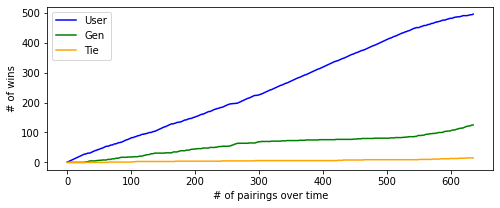

In [21]:
user_wins = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,28,28,29,30,31,31,31,31,32,33,34,35,36,37,38,39,40,40,41,42,43,43,44,45,46,47,47,48,49,50,51,52,53,54,54,54,54,55,56,57,58,58,58,59,60,61,62,62,62,63,64,65,66,66,66,67,67,68,69,70,71,72,73,74,75,76,76,77,78,79,80,81,82,83,83,83,84,85,86,86,87,88,89,89,90,90,91,92,93,94,94,94,95,95,96,96,97,97,98,99,100,100,100,100,101,102,103,103,104,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,119,120,121,122,123,124,125,126,127,128,129,129,129,129,130,131,131,132,133,134,134,134,135,135,135,136,137,138,139,140,141,142,142,142,143,144,145,146,146,147,147,147,148,149,150,151,151,152,153,154,154,155,156,157,158,159,160,161,161,161,162,163,164,165,166,167,168,169,170,170,170,171,172,173,174,175,176,177,178,178,179,180,180,181,181,182,183,184,184,184,185,186,187,188,189,190,191,192,193,194,194,195,196,196,196,196,197,197,197,197,197,198,198,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,215,216,217,218,219,220,221,222,223,224,224,224,224,225,225,225,226,227,228,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,258,259,260,261,262,263,264,265,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,284,285,286,287,288,289,290,291,292,293,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,338,339,340,340,341,342,343,344,345,346,347,348,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,362,363,364,365,366,367,368,368,369,370,371,372,373,374,374,375,376,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,415,416,417,418,419,420,421,422,422,423,424,425,426,427,428,429,430,431,432,433,433,434,435,436,437,437,438,439,440,440,441,442,443,444,445,446,447,448,449,449,450,451,451,451,451,451,452,453,454,455,455,456,457,458,458,458,458,459,460,461,461,462,462,463,464,465,465,465,466,467,468,469,469,470,470,471,471,472,472,473,474,475,475,476,476,476,476,477,478,479,479,480,481,481,482,482,482,482,483,484,485,485,486,486,486,487,487,487,487,487,488,489,489,490,491,491,491,491,491,491,491,491,492,492,493,494,494,494,494,495,496]
gen_wins = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,2,2,3,4,5,5,5,5,5,5,5,5,5,5,6,6,6,6,7,7,7,7,7,8,8,8,8,8,8,8,8,9,10,10,10,10,10,10,11,12,12,12,12,12,13,14,14,14,14,14,15,16,16,17,17,17,17,17,17,17,17,17,17,18,18,18,18,18,18,18,18,18,19,19,19,19,19,19,19,19,20,20,21,21,21,21,21,22,23,23,24,24,25,25,26,26,26,26,27,28,29,29,29,29,30,30,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,32,32,32,32,32,32,32,32,32,32,32,33,34,35,35,35,35,35,35,35,36,37,37,38,39,39,39,39,39,39,39,39,40,41,41,41,41,41,42,42,43,44,44,44,44,44,45,45,45,45,46,46,46,46,46,46,46,46,47,48,48,48,48,48,48,48,48,48,48,49,50,50,50,50,50,50,50,50,50,51,51,51,52,52,53,53,53,53,53,54,54,54,54,54,54,54,54,54,54,54,55,55,55,56,57,58,58,59,60,61,62,62,63,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,65,65,65,65,65,65,65,65,65,65,65,66,67,67,68,69,69,69,69,70,70,70,70,70,70,70,70,70,70,70,70,70,70,70,70,71,71,71,71,71,71,71,71,71,71,71,71,71,71,71,71,72,72,72,72,72,72,72,72,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,74,74,74,74,74,74,74,74,74,74,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,75,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,78,78,78,78,78,78,78,79,79,79,79,79,79,79,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,81,82,82,82,82,82,82,82,82,83,83,83,83,83,83,83,83,83,83,83,83,84,84,84,84,84,85,85,85,85,86,86,86,86,86,86,86,86,86,86,87,87,87,88,89,90,90,90,90,90,90,91,91,91,91,92,93,94,94,94,94,95,95,96,96,96,96,96,97,97,97,97,97,98,98,99,99,100,100,100,100,100,100,101,101,102,103,104,104,104,104,105,105,105,105,105,106,107,108,108,108,108,109,109,110,111,111,112,113,113,114,114,114,115,115,115,116,117,118,119,120,120,121,121,122,122,122,123,124,125,125,125]
tie_wins = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,7,7,7,7,7,7,7,7,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,11,11,11,11,11,11,11,11,11,11,11,11,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,14,14,14,14,14,14,14,14,14,14,14,14,15,15,15,15,15,15,15,15,15,15,15]

plt.figure(figsize=(8,3))
plt.plot(user_wins,label='User',color='b')
plt.plot(gen_wins,label='Gen',color='g')
plt.plot(tie_wins,label='Tie',color='orange')
# plt.hist(user_wins,bins=5)
plt.ylabel('# of wins')
plt.xlabel('# of pairings over time')
plt.legend()
plt.show()

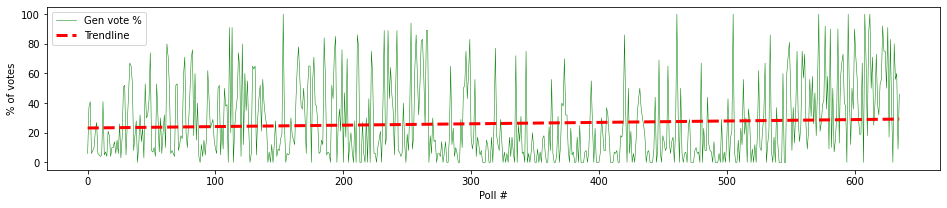

In [48]:
user_perc_wins = [0.94,0.63,0.59,0.94,0.91,0.89,0.78,0.73,0.94,0.95,0.96,0.95,0.59,0.95,0.92,0.96,0.78,0.82,0.96,0.89,0.89,0.86,0.93,0.85,0.94,0.74,0.97,0.83,0.49,0.48,0.95,0.74,0.53,0.33,0.34,0.47,0.91,0.82,0.72,1.00,0.88,0.67,0.86,0.77,0.97,0.47,0.70,0.67,0.58,0.26,0.91,0.92,0.89,0.96,0.47,0.68,0.92,0.70,0.93,0.79,0.67,0.89,0.20,0.29,0.50,0.93,0.91,0.93,0.96,0.48,0.47,0.91,0.88,0.81,0.84,0.41,0.29,0.79,0.89,0.73,0.53,0.30,0.24,0.82,0.40,0.85,0.60,0.96,1.00,0.88,0.96,0.85,0.95,0.83,0.38,0.56,0.77,0.74,0.71,0.85,0.90,0.94,0.50,0.48,0.95,0.75,0.90,0.50,0.62,0.61,1.00,0.09,0.79,0.09,1.00,0.77,0.65,0.56,0.26,0.38,0.96,0.20,0.88,0.40,0.65,0.45,0.77,1.00,0.93,0.35,0.37,0.35,0.95,0.71,0.57,0.48,0.78,0.44,0.60,0.69,0.75,1.00,0.92,1.00,0.88,1.00,0.88,0.72,0.96,0.90,0.91,0.84,0.80,0.00,0.75,1.00,0.93,0.95,0.94,0.70,0.80,0.85,0.88,0.57,0.35,0.22,0.43,0.62,0.64,0.50,0.67,0.94,0.52,0.34,0.35,1.00,0.46,0.29,0.61,0.62,0.73,0.94,0.92,0.85,0.88,0.16,0.42,0.95,0.92,0.93,1.00,0.48,0.57,0.26,0.15,1.00,0.76,0.64,0.78,0.24,1.00,0.53,0.83,0.30,1.00,0.88,0.79,0.92,1.00,0.72,1.00,0.14,0.23,1.00,1.00,0.73,0.94,1.00,0.70,1.00,0.56,1.00,0.25,0.42,0.93,0.93,1.00,0.89,0.85,0.78,1.00,0.62,0.11,0.88,0.82,0.11,0.57,0.36,0.54,0.65,0.95,0.50,0.11,0.91,0.92,0.96,0.94,0.60,0.87,1.00,0.80,0.91,0.65,0.06,0.90,0.83,0.36,0.14,0.43,0.67,0.47,0.18,0.17,0.43,0.75,0.11,0.11,1.00,0.82,0.93,0.70,0.86,0.85,1.00,0.93,0.93,0.96,0.86,1.00,0.94,0.86,1.00,1.00,0.83,0.35,0.88,0.77,0.96,0.89,0.94,1.00,1.00,0.71,0.89,0.50,0.48,0.25,0.56,0.40,0.17,0.83,0.90,0.85,0.44,0.96,0.83,0.88,0.95,0.91,1.00,1.00,1.00,0.85,0.88,1.00,1.00,0.83,1.00,0.72,0.23,0.81,0.88,0.91,0.71,0.86,1.00,0.92,1.00,0.93,1.00,0.83,0.96,0.83,0.92,1.00,0.28,1.00,0.75,0.86,0.68,0.94,0.92,1.00,0.25,1.00,0.94,1.00,0.92,0.79,0.90,1.00,1.00,0.90,1.00,0.92,1.00,0.84,0.81,0.93,1.00,1.00,0.76,0.91,0.44,0.94,1.00,1.00,0.95,0.68,1.00,0.88,0.60,0.62,0.30,0.67,0.67,0.91,1.00,0.77,0.95,0.92,1.00,1.00,0.83,1.00,0.75,1.00,1.00,1.00,0.92,0.91,1.00,0.92,0.71,0.45,0.76,1.00,0.77,1.00,1.00,1.00,0.94,0.70,0.79,0.91,0.91,0.63,0.67,0.82,1.00,1.00,1.00,0.92,0.93,0.91,1.00,1.00,0.82,0.83,0.73,0.14,0.67,1.00,0.50,0.94,0.78,1.00,0.93,1.00,0.86,0.67,0.56,0.50,0.63,0.70,0.75,0.83,1.00,0.92,0.91,1.00,1.00,1.00,0.90,0.55,1.00,0.91,0.31,0.92,1.00,0.82,0.86,0.91,0.89,0.35,0.86,0.93,0.86,0.83,1.00,0.77,0.00,0.69,1.00,0.50,0.94,1.00,0.94,0.92,1.00,0.75,0.71,1.00,1.00,1.00,0.91,0.89,0.93,0.92,1.00,0.33,1.00,0.77,0.91,0.91,0.55,0.88,0.91,0.92,1.00,0.86,1.00,1.00,1.00,0.93,1.00,0.71,1.00,0.92,1.00,0.86,0.56,1.00,0.83,0.78,0.00,0.91,1.00,1.00,0.85,1.00,0.77,0.88,0.44,0.80,0.70,1.00,0.64,0.73,1.00,0.90,1.00,0.88,1.00,0.80,0.38,0.89,0.91,0.78,0.67,0.33,1.00,0.88,0.78,0.14,0.92,1.00,0.83,1.00,0.63,0.88,1.00,1.00,1.00,0.40,1.00,1.00,0.40,0.29,0.19,0.50,0.91,0.63,0.87,0.64,0.25,0.73,0.86,0.75,0.25,0.43,0.27,0.75,0.90,0.78,0.44,0.69,0.42,0.74,0.53,0.82,0.50,0.00,0.78,0.73,0.61,0.58,0.08,0.64,0.42,0.90,0.10,0.89,0.50,0.92,0.85,0.69,0.10,0.87,0.43,0.33,0.27,0.60,0.62,1.00,0.00,0.56,0.88,0.50,0.64,0.10,0.29,0.43,0.69,0.80,0.80,0.33,1.00,0.00,0.31,0.81,0.13,0.00,0.50,0.29,0.75,0.60,0.27,0.61,0.67,0.47,0.44,0.08,0.25,0.25,0.50,0.09,0.83,0.17,0.63,1.00,0.20,0.44,0.40,0.90,0.54]
user_perc_wins2 = [int(x*100) for x in user_perc_wins]
gen_perc_wins = [1-x for x in user_perc_wins]
gen_perc_wins2 = [int(x*100) for x in gen_perc_wins]

#calc trend line
x = range(len(user_perc_wins2))
#z = np.polyfit(x, user_perc_wins2, 1)
z = np.polyfit(x,gen_perc_wins2,1)
p = np.poly1d(z)
# tline = []
# BREAK = 50
# for i in range(0,len(gen_perc_wins2),BREAK):
#     z = np.polyfit(x,gen_perc_wins2,1)
#     p = np.poly1d(z)
#     pe = p(gen_perc_wins2[i:i+BREAK])
#     for o in pe:
#         tline.append(o)


plt.figure(figsize=(16,3))
#plt.plot(user_perc_wins2, label='User vote %', linewidth=0.5, color='blue')
plt.plot(gen_perc_wins2, label='Gen vote %', linewidth=0.5, color='green')
plt.plot(x, p(x), label='Trendline',color='red', linewidth=3, linestyle="--")
# plt.plot(x, tline, label='Trendline (/ 100 votes)',color='red', linewidth=3, linestyle="--")

plt.xlabel("Poll #")
plt.ylabel("% of votes")
plt.ylim(-5,105)
plt.legend()
plt.show()




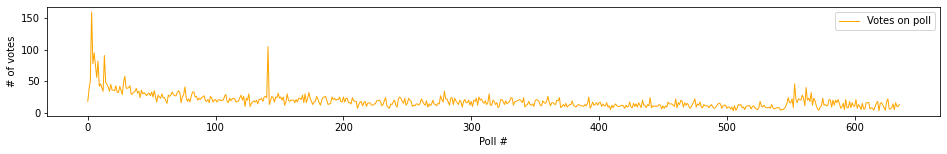

In [50]:
votes = [18,38,51,160,78,95,76,56,82,42,46,40,34,91,48,45,41,34,45,36,36,35,43,33,32,42,36,29,49,58,39,39,40,43,29,30,33,34,39,31,34,24,36,30,32,30,27,30,31,27,33,25,35,25,17,28,25,23,30,24,24,19,15,28,26,28,33,29,27,27,32,35,32,16,25,29,41,24,18,22,17,27,33,33,25,26,20,23,21,24,25,27,19,18,21,16,26,23,17,20,21,17,20,21,19,20,20,26,29,18,16,23,19,22,23,22,17,18,19,24,28,20,26,10,23,20,30,10,15,17,19,17,20,14,21,21,23,18,25,26,24,105,13,19,26,24,17,25,24,31,23,25,20,25,12,17,30,20,18,20,20,20,16,21,17,23,23,21,28,16,30,16,23,32,23,18,13,17,18,26,22,16,12,20,24,25,26,20,13,14,15,25,21,23,20,21,21,25,18,17,25,17,23,23,16,16,14,24,19,18,18,7,13,17,18,11,16,18,10,15,16,15,12,12,14,14,19,19,20,18,11,13,19,24,11,9,7,14,13,17,20,12,9,22,25,23,18,15,23,12,15,23,20,18,10,12,11,14,14,12,15,22,18,14,12,19,9,14,11,14,20,14,13,11,15,14,27,21,17,34,22,22,17,12,23,24,13,23,19,16,13,20,17,9,18,21,16,16,20,12,18,10,20,18,23,12,25,20,22,17,15,19,13,16,30,12,12,20,18,13,16,8,11,21,21,18,13,19,14,16,18,24,23,12,17,18,19,20,21,19,16,24,9,12,13,18,13,12,14,10,19,21,20,18,12,11,19,16,15,18,26,17,11,16,16,14,13,20,19,24,8,10,13,10,15,9,11,13,13,19,12,10,9,12,13,12,11,11,10,13,11,15,25,7,11,17,12,13,16,12,16,17,10,14,11,11,16,9,11,5,12,8,12,14,11,10,10,11,12,11,7,12,9,10,17,9,8,15,10,14,9,16,12,8,20,12,12,8,13,11,24,8,11,10,11,10,11,13,12,6,11,7,11,9,17,14,14,14,12,10,22,8,16,13,20,18,9,16,12,15,12,7,9,13,17,22,9,14,12,17,9,8,13,11,11,11,8,11,13,9,7,8,11,14,15,14,7,11,12,12,7,9,9,6,9,3,11,4,7,13,12,13,8,9,5,10,11,11,11,6,10,11,8,6,5,8,18,11,9,12,9,8,8,9,7,13,8,6,7,8,8,8,4,5,5,7,10,15,24,16,16,22,8,46,22,16,22,21,20,28,23,11,40,20,23,18,32,12,23,19,11,6,4,9,11,23,12,13,11,12,21,20,9,20,12,20,16,21,15,7,9,15,5,21,8,8,18,8,16,11,10,21,7,13,10,5,15,6,6,16,16,16,6,8,7,4,10,15,18,3,15,16,12,8,4,18,22,6,6,8,14,5,16,10,10,13]
plt.figure(figsize=(16,2))
plt.plot(votes, color='orange',label='Votes on poll',linewidth=1)
plt.ylabel('# of votes')
plt.xlabel('Poll #')
plt.legend()
plt.show()

#### Get Nifflas poll wins

In [71]:
# 1a. get all of the pairings saved to the database
winner_author = []
nifflas_polls = 0

for pid in all_pairIDs:
    vr = pair_gen_sql.pair2Rating(pid)

    # pair not found
    if vr == None:
        #print(f"** No valid pairing found for ID [ {pid} ] **")
        continue
        
    total = (abs(vr['real']['votes']) + abs(vr['fake']['votes']))
    user_win = abs(vr['real']['votes']) > abs(vr['fake']['votes'])
    user_author = pair_gen_sql.getUserLevelAuthor(pair_gen_sql.getPairLevelIDs(pid)['user'])
    
    if user_author == "@Nifflas":
        nifflas_polls += 1
    
    if abs(vr['real']['votes']) > abs(vr['fake']['votes']):
        winner_author.append(user_author)
    elif abs(vr['real']['votes']) < abs(vr['fake']['votes']):
        winner_author.append('AI')
    else:
        winner_author.append("TIE")
    
#1b. get all of the pairings saved to the database (EXT)
all_pairEXTIDs = pair_EXT_gen_sql.getAllPairIDs()
for pid in all_pairEXTIDs:
    vr = pair_EXT_gen_sql.pair2Rating(pid)

    # pair not found
    if vr == None:
        #print(f"** No valid pairing found in [EXT] for ID [ {pid} ] **")
        continue
        
    if pair_EXT_gen_sql.getAllPair(pid)['DUO_TYPE'] == "gen":
        continue
        
    pair_id_set = pair_EXT_gen_sql.getPairLevelIDs(pid)
    LEVEL_A = pair_id_set['A']
    LEVEL_B = pair_id_set['B']
    
    authorA = pair_gen_sql.getUserLevelAuthor(LEVEL_A)
    authorB = pair_gen_sql.getUserLevelAuthor(LEVEL_B)
    
    if authorA == "@Nifflas" or authorB == "@Nifflas":
        nifflas_polls += 1

    total = (abs(vr['real']['votes']) + abs(vr['fake']['votes']))

    if abs(vr['real']['votes']) > abs(vr['fake']['votes']):
        winner_author.append(authorA)
    elif abs(vr['real']['votes']) < abs(vr['fake']['votes']):
        winner_author.append(authorB)
    else:
        winner_author.append("TIE")

** WARNING: Level ID [ 68 ] from [ gen ] dataset not found! **


In [72]:
len([x for x in winner_author if x == "@Nifflas"])/nifflas_polls

0.9444444444444444

In [73]:
nifflas_polls

108